In [1]:
##################################
### Import the usual libraries ###
##################################

### Other
import warnings
warnings.filterwarnings('ignore')

### Matplotlib
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 30})

# from tqdm. import tqdm_notebook

In [239]:
import numpy as np
import astropy
from astropy.io import fits
from astropy.table import Table
from scipy.interpolate import InterpolatedUnivariateSpline
import warnings
from scipy.optimize import curve_fit
from tqdm import tqdm_notebook

class WhatsMyAgeAgain():
    '''
    Class to calculate a star's age and extinction using PARSEC isochrones and extinction law
    from Cardelli et al. 1989
    '''
    def __init__(self,mh,am,distance,rv,isochrones):
        
        '''
        feh: [float] metallicity [M/H] of star
        am: [float] [$\alpha$/M] of star
        distance: [float] distance to star in pc
        isochrones: [astropy Table] PARSEC isochrone table
        '''
        
        # stellar parameters
        self.salfeh = mh+np.log10(0.638*(10**am)+0.362) #Salaris et al. 1993
        self.dist = distance
        
        # PARSEC isochrones
        self.distmod = 5.0*np.log10(distance)-5.0
        
        # PARSEC isochrones
        self.rv = rv
        self.labels = ['Jmag','Hmag','Ksmag']
        
        self.uniq_ages = np.unique(isochrones['logAge'])
        self.iso = isochrones[np.where(isochrones['MH']==self.closest(isochrones['MH'],self.salfeh))]
        
        age_idx = []
        for i in range(len(self.uniq_ages)):
            ages, = np.where(self.iso['logAge']==self.uniq_ages[i])
            age_idx.append(np.array([min(ages),max(ages)]))
        
        self.age_idx = np.asarray(age_idx)
                
        # Effective Wavelengths of different passbands
        self.leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757} # mircons
        
    def closest(self,data,value):
        '''
        Find nearest value in array to given value
        
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        '''
        
        data = np.asarray(data)
    
        return data[(np.abs(np.subtract(data,value))).argmin()]
    
    def neighbors(self,data,value):
        '''
        Find values of two elements closest to the given value
    
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        
        Output:
        ------
            close1: closest value under the given value
            close2: closest value over the given value
        '''
    
        data = np.asarray(data)
        close1 = data[(np.abs(np.subtract(data,value))).argmin()]
        data = data[np.where(data!=close1)]
        close2 = data[(np.abs(np.subtract(data,value))).argmin()]
    
        return close1,close2
    
    def cardelli_a(self,x):
        '''
        a(x) function from Cardelli et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            a: a function value  
        '''
        if 0.3 <= x < 1.1:
            a = 0.574*(x**1.61)
            return a
    
        elif 1.1 <= x < 3.3:
            y = x - 1.82
            a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                 0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
            return a
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
                return a
        
            else:
                fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
                return a       
    
    def cardelli_b(self,x):
        '''
        b(x) function from Cardelli et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            b: b function value 
        '''
        if 0.3 <= x < 1.1:
            b = -0.527*(x**1.61)
            return b
    
        elif 1.1 <= x <= 3.3:
            y = x - 1.82
            b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                 0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
            return b
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
                return b
        
            else:
                fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
                return b
    
    def cardelli_alav(self,wave):
        '''
        Calculate A\lambda/Av
    
        Inputs:
        ------
            wave: effective wavelength in units of micron
            rv: Rv value (=Av/E(B_V))
        
        Output:
        ------
            alav: A\lambda/Av
        '''
        x=1/wave
        alav = self.cardelli_a(x)+self.cardelli_b(x)/self.rv
        return alav    
        
    def Teff2AppMags(self,teff,age,ak):
        '''
        Calculate the expected apparent magnitude of a star
        
        Inputs:
        ------
            teff: temperature of star
            age: age of star
            ak: extinction in the 2MASS K band
        
        Output:
        ------
            calc_mag: expected intrinsic magnitude for the given temperature
        '''
        
        #Some calcualtions to set things up
        lgteff = np.log10(teff)
        
        ajak = self.cardelli_alav(self.leff['J'])/self.cardelli_alav(self.leff['K'])
        ahak = self.cardelli_alav(self.leff['H'])/self.cardelli_alav(self.leff['K'])
        
        extincts = np.array([ajak,ahak,1.0])*ak
        
        lgage = np.log10(age*10**9)
        
        ##print('Input [Age, Ak]: ',[age,ak])
        
        # Figure out if age is actually in the ages given in the isochrone table
        if lgage in self.uniq_ages:
            
            ### pick out a single isochrone 
            aidx, = np.where(self.uniq_ages==lgage)
            iso_ = self.iso[self.age_idx[int(aidx)][0]:self.age_idx[int(aidx)][1]]
            
            if lgteff < min(iso_['logTe']) or lgteff > max(iso_['logTe']):
                #print('[J,H,K]: ',np.array([999999.0, 999999.0, 999999.0]))
                warnings.warn("Temperature outside range of selected isochrone")
                return np.array([999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            sidx = np.argsort(iso_['logTe'])
            slogTe = iso_['logTe'][sidx]
            _, uidx = np.unique(slogTe,return_index=True)
            slogTe = slogTe[uidx]
            
            ### use a spline to get the apparent mags
            calc_mags = 999999.0*np.ones(3)
            for i in range(3):
                mag_spl = InterpolatedUnivariateSpline(slogTe,iso_[self.labels[i]][sidx][uidx])
                calc_mags[i] = mag_spl(lgteff)+self.distmod+extincts[i]
            
            #print('[J,H,K]: ',calc_mags)
            return calc_mags
            
        else:
            lgage_lo,lgage_hi = self.neighbors(self.uniq_ages,lgage)
#             #print('[lgage_lo,lgage_hi]: ',[lgage_lo,lgage_hi])
            #print('[age_lo,age_hi]: ',[10**lgage_lo/10**9,10**lgage_hi/10**9])
            
            ### Pick out single isochrones
        
            # younger
            aidx_lo, = np.where(self.uniq_ages==lgage_lo)
            iso_lo = self.iso[self.age_idx[int(aidx_lo)][0]:self.age_idx[int(aidx_lo)][1]]
            
            # older
            aidx_hi, = np.where(self.uniq_ages==lgage_hi)
            iso_hi = self.iso[self.age_idx[int(aidx_hi)][0]:self.age_idx[int(aidx_hi)][1]]
            
            ### Temperature Check
            if lgteff < min(iso_lo['logTe']) or lgteff > max(iso_lo['logTe']):
                #print('[J,H,K]: ',np.array([999999.0, 999999.0, 999999.0]))
                warnings.warn("Temperature outside range of selected isochrone")
                return np.array([999999.0, 999999.0, 999999.0])
            if lgteff < min(iso_hi['logTe']) or lgteff > max(iso_hi['logTe']):
                #print('[J,H,K]: ',np.array([999999.0, 999999.0, 999999.0]))
                warnings.warn("Temperature outside range of selected isochrone")
                return np.array([999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            
            # younger
            sidx_lo = np.argsort(iso_lo['logTe'])
            slogTe_lo = iso_lo['logTe'][sidx_lo]
            _, uidx_lo = np.unique(slogTe_lo,return_index=True)
            slogTe_lo = slogTe_lo[uidx_lo]
            
            # older
            sidx_hi = np.argsort(iso_hi['logTe'])
            slogTe_hi = iso_hi['logTe'][sidx_hi]
            _, uidx_hi = np.unique(slogTe_hi,return_index=True)
            slogTe_hi = slogTe_hi[uidx_hi]
            
            ### use a spline to get the apparent mags
            age_lo = 10**lgage_lo/10**9
            age_hi = 10**lgage_hi/10**9
            calc_mags = 999999.0*np.ones(3)
            for i in range(3):
                mag_spl_lo = InterpolatedUnivariateSpline(slogTe_lo,iso_lo[self.labels[i]][sidx_lo][uidx_lo])
                mag_spl_hi = InterpolatedUnivariateSpline(slogTe_hi,iso_hi[self.labels[i]][sidx_hi][uidx_hi])
                age_spl_interp = np.poly1d(np.squeeze(np.polyfit([age_lo,age_hi],
                                                                 [mag_spl_lo(lgteff),mag_spl_hi(lgteff)],1)))
                calc_mags[i] = age_spl_interp(age)+self.distmod+extincts[i]
            #print('[J,H,K]: ',calc_mags)
            return calc_mags
        
#     def GetAgeAk(self,teff,obs_mags,obs_mags_err,initial_sample_pts,constraints):
#         '''
#         Get the age and ak extinctions of a star using the Teff2AppMags function and curve_fit.
        
#         Inputs:
#         ------
#             teff: temperature of star
#             obs_mags: observed 2MASS magnitudes; np.array([J value, H value, K value])
#             obs_mags_err: errors in observed 2MASS magnitudes
#             initial_sample_pts: array of initial guesses; np.array([initial ages, initial aks])
#             constraints: tuple of bounds for age and ak; ((lower age, lower ak),(upper age, upper ak))
            
#         Outputs:
#         -------
#             age: age values found; same size as initial_sample_pts
#             age_err: age errors; same size as initial_sample_pts
#             ak: ak values found; same size as initial_sample_pts
#             ak_err: ak errors; same size as initial_sample_pts
#             chi: chi squared value of fit; same size as initial_sample_pts
#         '''
#         age0,ak0 = initial_sample_pts
        
#         if np.size(age0)>1 & np.size(ak0)>1:
#             age = 999999.0*np.ones((len(age0),len(ak0)))
#             age_err = 999999.0*np.ones((len(age0),len(ak0)))
#             ak = 999999.0*np.ones((len(age0),len(ak0)))
#             ak_err = 999999.0*np.ones((len(age0),len(ak0)))
#             chi = 999999.0*np.ones((len(age0),len(ak0)))
            
#             for i in range(len(age0)):
#                 for j in range(len(ak0)):
#                     try:
#                         popt,pcov = curve_fit(f=self.Teff2AppMags,xdata=teff,ydata=obs_mags,p0=[age0[i],ak0[j]],
#                                               sigma=obs_mags_err,bounds=constraints,method='trf',
#                                               absolute_sigma=True)
#                         age[i,j] = popt[0]
#                         ak[i,j] = popt[1]
#                         age_err[i,j] = np.sqrt(pcov[0][0])
#                         ak_err[i,j] = np.sqrt(pcov[1][1])
                        
#                         calc_mags = np.asarray(self.Teff2AppMags(teff,popt[0],popt[1]))
#                         chi[i,j] = sum((calc_mags-obs_mags)**2/obs_mags_err**2)
                        
#                     except:
#                         age[i,j] = 999999.0
#                         ak[i,j] = 999999.0
#                         age_err[i,j] = 999999.0
#                         ak_err[i,j] = 999999.0
#                         chi[i,j] = 999999.0
                        
#             return age,age_err,ak,ak_err,chi
        
#         elif np.size(age0)>1 & np.size(ak0)==1:
#             age = 999999.0*np.ones((len(age0),1))
#             age_err = 999999.0*np.ones((len(age0),1))
#             ak = 999999.0*np.ones((len(age0),1))
#             ak_err = 999999.0*np.ones((len(age0),1))
#             chi = 999999.0*np.ones((len(age0),1))
            
#             for i in range(len(age0)):
#                 try:
#                     popt,pcov = curve_fit(f=self.Teff2AppMags,xdata=teff,ydata=obs_mags,p0=[age0[i],ak0],
#                                               sigma=obs_mags_err,bounds=constraints,method='trf',
#                                               absolute_sigma=True)
#                     age[i] = popt[0]
#                     ak[i] = popt[1]
#                     age_err[i] = np.sqrt(pcov[0][0])
#                     ak_err[i] = np.sqrt(pcov[1][1])
                        
#                     calc_mags = np.asarray(self.Teff2AppMags(teff,popt[0],popt[1]))
#                     chi[i] = sum((calc_mags-obs_mags)**2/obs_mags_err**2)
                    
#                 except:
#                     age[i] = 999999.0
#                     age_err[i] = 999999.0
#                     ak[i] = 999999.0
#                     ak_err[i] = 999999.0
#                     chi[i] = 999999.0
                    
#             return age,age_err,ak,ak_err,chi
        
#         elif np.size(age0)==1 & np.size(ak0)>1:
#             age = 999999.0*np.ones((1,len(ak0)))
#             age_err = 999999.0*np.ones((1,1))
#             ak = 999999.0*np.ones((1,1))
#             ak_err = 999999.0*np.ones((1,1))
#             chi = 999999.0*np.ones((1,1))
            
#             for j in range(len(ak0)):
#                 try:
#                     popt,pcov = curve_fit(f=self.Teff2AppMags,xdata=teff,ydata=obs_mags,p0=[age0,ak0[j]],
#                                               sigma=obs_mags_err,bounds=constraints,method='trf',
#                                               absolute_sigma=True)
#                     age[j] = popt[0]
#                     ak[j] = popt[1]
#                     age_err[j] = np.sqrt(pcov[0][0])
#                     ak_err[j] = np.sqrt(pcov[1][1])
                        
#                     calc_mags = np.asarray(self.Teff2AppMags(teff,popt[0],popt[1]))
#                     chi[j] = sum((calc_mags-obs_mags)**2/obs_mags_err**2)
                    
#                 except:
#                     age[j] = 999999.0
#                     age_err[j] = 999999.0
#                     ak[j] = 999999.0
#                     ak_err[j] = 999999.0
#                     chi[j] = 999999.0
                    
#             return age,age_err,ak,ak_err,chi
        
#         elif np.size(age0)==1 & np.size(ak0)==1:
#             age = 999999.0
#             age_err = 999999.0
#             ak = 999999.0
#             ak_err = 999999.0
#             chi = 999999.0

#             try:
#                 popt,pcov = curve_fit(f=self.Teff2AppMags,xdata=teff,ydata=obs_mags,p0=[age0,ak0],
#                                       sigma=obs_mags_err,bounds=constraints,method='trf',
#                                       absolute_sigma=True)
#                 age = popt[0]
#                 ak = popt[1]
#                 age_err = np.sqrt(pcov[0][0])
#                 ak_err = np.sqrt(pcov[1][1])
                        
#                 calc_mags = np.asarray(self.Teff2AppMags(teff,popt[0],popt[1]))
#                 chi = sum((calc_mags-obs_mags)**2/obs_mags_err**2)
                    
#             except:
#                 age = 999999.0
#                 age_err = 999999.0
#                 ak = 999999.0
#                 ak_err = 999999.0
#                 chi = 999999.0
                    
#             return age,age_err,ak,ak_err,chi

In [ ]:
leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
def cardelli_a(x):
    '''
    a(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        a: a function value  
    '''
    if 0.3 <= x < 1.1:
        a = 0.574*(x**1.61)
        return a
    
    elif 1.1 <= x < 3.3:
        y = x - 1.82
        a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
        return a
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
            return a
        
        else:
            fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
            return a       
    
def cardelli_b(x):
    '''
    b(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        b: b function value 
    '''
    if 0.3 <= x < 1.1:
        b = -0.527*(x**1.61)
        return b
    
    elif 1.1 <= x <= 3.3:
        y = x - 1.82
        b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
        return b
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
            return b
        
        else:
            fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
            return b
    
def cardelli_alav(wave,rv):
    '''
    Calculate A\lambda/Av
    
    Inputs:
    ------
        wave: effective wavelength in units of micron
        rv: Rv value (=Av/E(B_V))
        
    Output:
    ------
        alav: A\lambda/Av
    '''
    x=1/wave
    alav = cardelli_a(x)+cardelli_b(x)/rv
    return alav

ejk_ak = (cardelli_alav(leff['J'],3.1)-cardelli_alav(leff['K'],3.1))/cardelli_alav(leff['K'],3.1)

def closest(data,value):
    '''
    Find nearest value in array to given value
        
    Inputs:
    ------
        data: data to search through 
        value: value of interest
    '''
        
    data = np.asarray(data)
    return data[(np.abs(np.subtract(data,value))).argmin()]

# PARSEC

In [4]:
### massive
massive = fits.getdata('/Users/joshuapovick/Desktop/Research/parsec/parsec_massive.fits.gz',0)
massive = massive[np.where(massive['label']==3.0)]
massive = massive[np.argsort(massive['logAge'])]
massive = Table(massive)['MH','logAge','logTe','logg','Gmag','G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']

# GCs

In [5]:
### GCS Data
gcs = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStar-r13-l33-58932beta_apa_dist_galvel_gc.fits.gz')
cln = np.where((gcs['FE_H']>-9999.0)&(gcs['AK_TARG']>-9999.0)&(gcs['LOGG']>0.0)&(gcs['M_H_ERR']>-90.0)&
                (gcs['C_FE']>-9999.0)&(gcs['N_FE']>-9999.0))
gcs = Table(gcs[cln])

### Find Cluster with more than one star

idx = []
for i in range(len(np.unique(gcs['CLUSTER']))):
    idx.append(np.squeeze(np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])))

for i in range(len(idx)):
    try:
        len(idx[i])
    except:
        print('bad: ',i)
        
good_names = []
for i in np.asarray(idx)[np.delete(np.asarray(list(range(len(idx)))),[24,27,37])]:
    if len(i)>10:
        good_names.append(gcs['CLUSTER'][i][0])

print(good_names)

good_clus = np.where((gcs['CLUSTER']=='47Tuc')|(gcs['CLUSTER']=='M10')|(gcs['CLUSTER']=='M107')|
                     (gcs['CLUSTER']=='M12')|(gcs['CLUSTER']=='M13')|(gcs['CLUSTER']=='M19')|
                     (gcs['CLUSTER']=='M2')|(gcs['CLUSTER']=='M22')|(gcs['CLUSTER']=='M3')|
                     (gcs['CLUSTER']=='M4')|(gcs['CLUSTER']=='M5')|(gcs['CLUSTER']=='M53')|
                     (gcs['CLUSTER']=='M54')|(gcs['CLUSTER']=='M55')|(gcs['CLUSTER']=='M71')|
                     (gcs['CLUSTER']=='M79')|(gcs['CLUSTER']=='NGC1851')|(gcs['CLUSTER']=='NGC2808')|
                     (gcs['CLUSTER']=='NGC288')|(gcs['CLUSTER']=='NGC3201')|(gcs['CLUSTER']=='NGC362')|
                     (gcs['CLUSTER']=='NGGC6388')|(gcs['CLUSTER']=='NGC6397')|(gcs['CLUSTER']=='NGC6752')|
                     (gcs['CLUSTER']=='omegaCen'))

gcs = gcs[good_clus]

bad:  24
bad:  27
bad:  37
['47Tuc', 'M10', 'M107', 'M12', 'M13', 'M19', 'M2', 'M22', 'M3', 'M4', 'M5', 'M53', 'M54', 'M55', 'M71', 'M79', 'NGC1851', 'NGC2808', 'NGC288', 'NGC3201', 'NGC362', 'NGC6388', 'NGC6397', 'NGC6752', 'omegaCen']


In [ ]:
gcs_ages = [11.75,11.75,12.00,13.00,12.00,12,11.75,12.50,11.75,11.50,11.50,12.25,11.75,13.00,11.00,11.14,11.00,
            11.00,11.50,10.75,12.03,13.00,12.50] 

In [98]:
gcs['CLUSTER'][1776]

'M22'

In [218]:
from scipy.optimize import curve_fit

# leff2MASS = {'Jmag':12345.,'Hmag':16393.,'Ksmag':21757.}

p0 = [12.0,0.5]

idx = 1024
CalcAge = WhatsMyAgeAgain(gcs['M_H'][idx],gcs['ALPHA_M'][idx],10000,3.1,massive)
obs_mags = np.array([gcs['J'][idx],gcs['H'][idx],gcs['K'][idx]],dtype=float).T.ravel()
popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),method='trf',
                      sigma=np.array([gcs['J_ERR'][idx],gcs['H_ERR'][idx],gcs['K_ERR'][idx]],dtype=float).T.ravel(),absolute_sigma=True)

print('Initial',p0)
print('Age; Ak',popt)
print(pcov)

[lgage_lo,lgage_hi]:  [10.079180000000001, 10.08008]
[J,H,K]:  [13.57519159 12.54378255 12.16882865]
[lgage_lo,lgage_hi]:  [10.079180000000001, 10.08008]
[J,H,K]:  [13.5751916  12.54378255 12.16882866]
[lgage_lo,lgage_hi]:  [10.079180000000001, 10.08008]
[J,H,K]:  [13.57519163 12.54378258 12.16882867]
[lgage_lo,lgage_hi]:  [9.8341, 9.83569]
[J,H,K]:  [12.74967072 11.92718119 11.68463907]
[lgage_lo,lgage_hi]:  [9.8341, 9.83569]
[J,H,K]:  [12.74967072 11.9271812  11.68463907]
[lgage_lo,lgage_hi]:  [9.8341, 9.83569]
[J,H,K]:  [12.74967075 11.92718122 11.68463908]
[lgage_lo,lgage_hi]:  [9.676689999999999, 9.6744]
[J,H,K]:  [12.3044645  11.58165188 11.40240739]
[lgage_lo,lgage_hi]:  [9.676689999999999, 9.6744]
[J,H,K]:  [12.30446451 11.58165189 11.4024074 ]
[lgage_lo,lgage_hi]:  [9.676689999999999, 9.6744]
[J,H,K]:  [12.30446454 11.5816519  11.4024074 ]
[lgage_lo,lgage_hi]:  [9.66745, 9.66511]
[J,H,K]:  [12.20140311 11.51211445 11.35362354]
[lgage_lo,lgage_hi]:  [9.66745, 9.66511]
[J,H,K]: 

In [228]:
# CalcAge.GetAgeAk(gcs['TEFF'][idx],
#                np.array([gcs['J'][idx],gcs['H'][idx],gcs['K'][idx]],dtype=float).T.ravel(),
#                np.array([gcs['J_ERR'][idx],gcs['H_ERR'][idx],gcs['K_ERR'][idx]],dtype=float).T.ravel(),[12,0.5],
#                ((0.,0.),(14.,2.)))

In [44]:
### GCs distances in pc
harris = np.array([4.5,4.4,6.4,4.8,7.1,8.8,11.5,3.2,10.2,2.2,7.5,17.9,26.5,5.4,4.0,12.9,12.1,9.6,8.9,4.9,
                   8.6,2.3,4.0,5.2])*1000.

gcs_dist = 999999.0*np.ones(len(gcs))
for i in range(len(np.unique(gcs['CLUSTER']))):
    clus = np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])
    gcs_dist[clus] = harris[i]

### Run 2MASS code
guess_ages = np.arange(0,14)
guess_aks = [0,0.5,1.0]

best_ages = 999999.0*np.ones(len(gcs))
best_aks = 999999.0*np.ones(len(gcs))
best_ages_err = 999999.0*np.ones(len(gcs))
best_aks_err = 999999.0*np.ones(len(gcs))
best_chis = 999999.0*np.ones(len(gcs))


for i in tqdm_notebook(range(len(gcs))):
    curve_ages = []
    curve_aks = []
    curve_ages_err = []
    curve_aks_err = []
    curve_chi = []
    
    CalcAge = WhatsMyAgeAgain(gcs['M_H'][i],gcs['ALPHA_M'][i],gcs_dist[i],3.1,massive)
    for j in range(len(guess_ages)):
        for k in range(len(guess_aks)):
            try:
                obs_mags = np.array([gcs['J'][i],gcs['H'][i],gcs['K'][i]],dtype=float).T.ravel()
                obs_sigs = np.array([gcs['J_ERR'][i],gcs['H_ERR'][i],gcs['K_ERR'][i]],dtype=float).T.ravel()
                popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][i],
                                   obs_mags,p0=[guess_ages[j],guess_aks[k]],bounds=((0.,0.),(14.,2.)),
                                   method='trf',sigma=obs_sigs,maxfev=5000)
            
                curve_ages.append(popt[0])
                curve_aks.append(popt[1])
                curve_ages_err.append(np.sqrt(pcov[0][0]))
                curve_aks_err.append(np.sqrt(pcov[1][1]))
                curve_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][i],popt[0],popt[1]))
                curve_chi.append(sum((curve_mags-obs_mags)**2/obs_sigs**2))
            
            except:
                print([i,j,k])
                curve_ages.append(999999.0)
                curve_aks.append(999999.0)
                curve_ages_err.append(999999.0)
                curve_aks_err.append(999999.0)
                curve_chi.append(999999.0)
                
    best_idx = np.asarray(curve_chi).argmin()
    best_chis[i] = np.min(curve_chi)
    best_ages[i] = np.asarray(curve_ages)[best_idx]
    best_aks[i] = np.asarray(curve_aks)[best_idx]
    best_ages_err[i] = np.asarray(curve_ages_err)[best_idx]
    best_aks_err[i] = np.asarray(curve_aks_err)[best_idx]

[435, 7, 1]
[992, 7, 1]
[1083, 3, 2]
[1087, 9, 1]



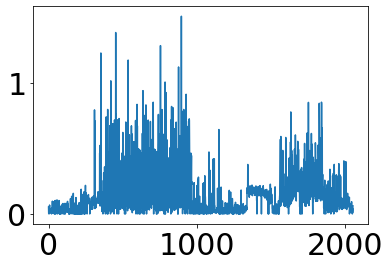

In [49]:
plt.plot(best_aks)

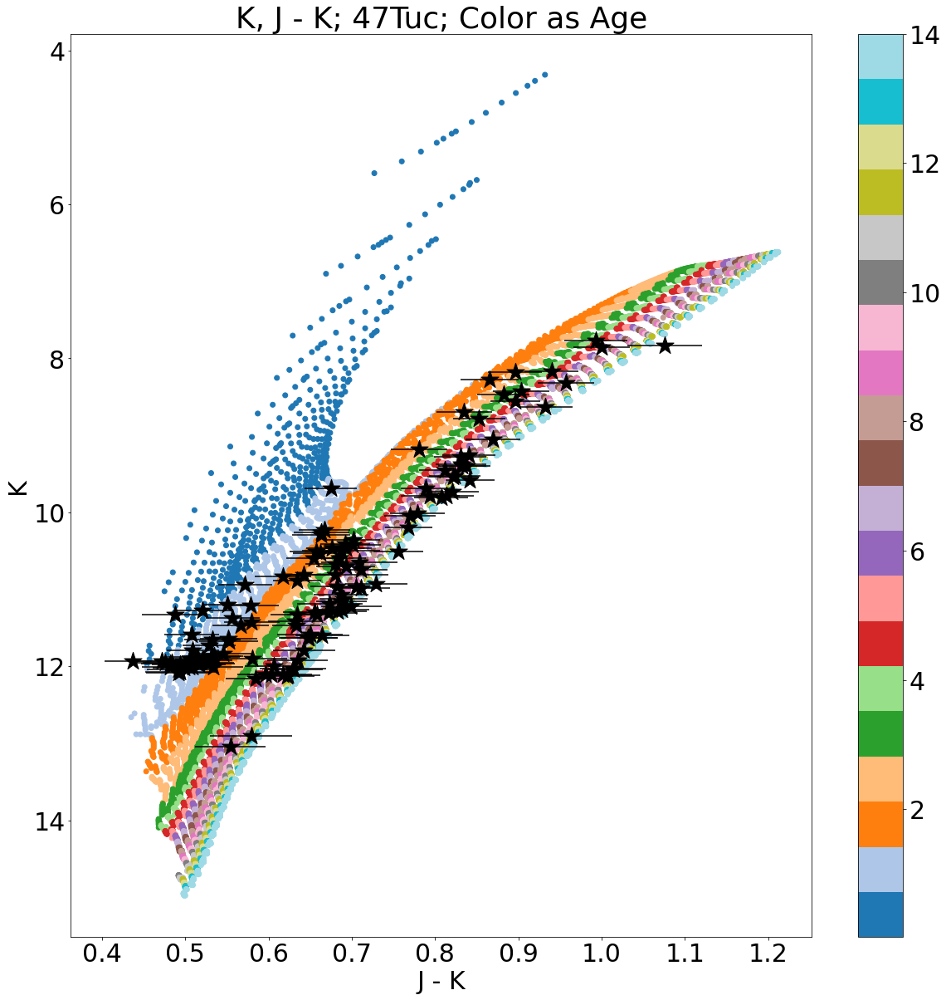

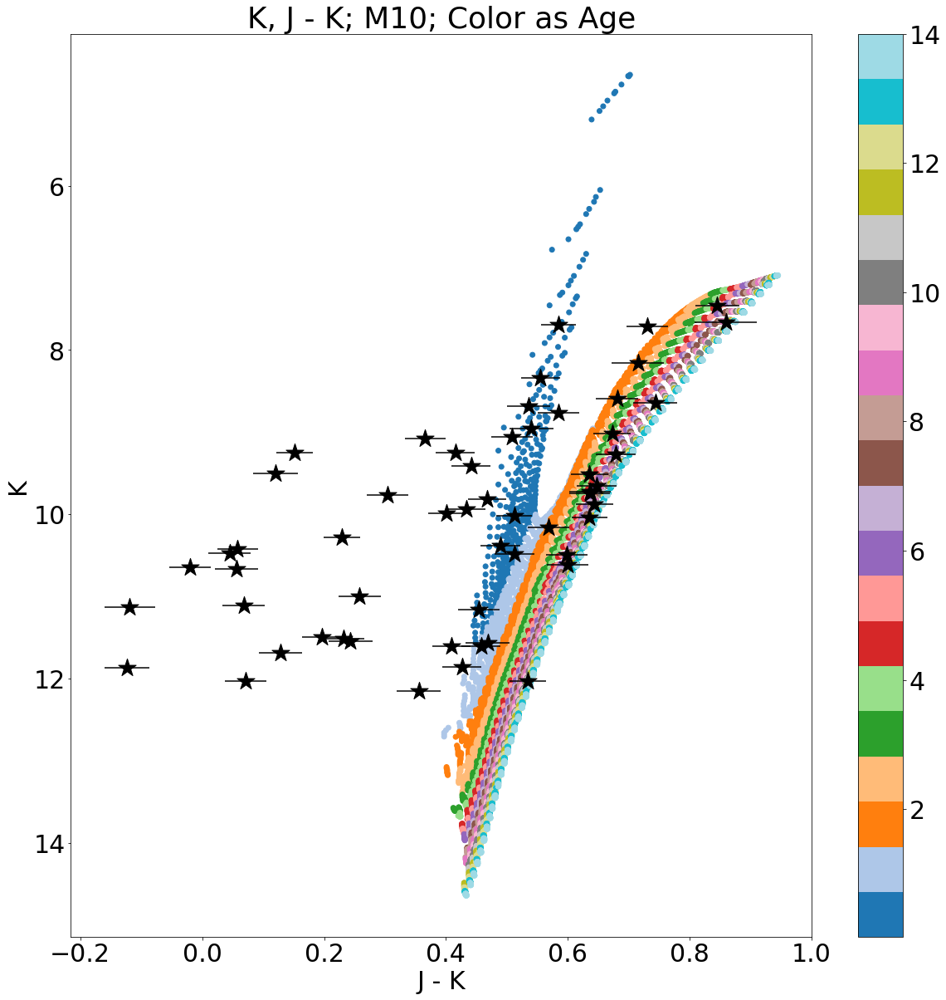

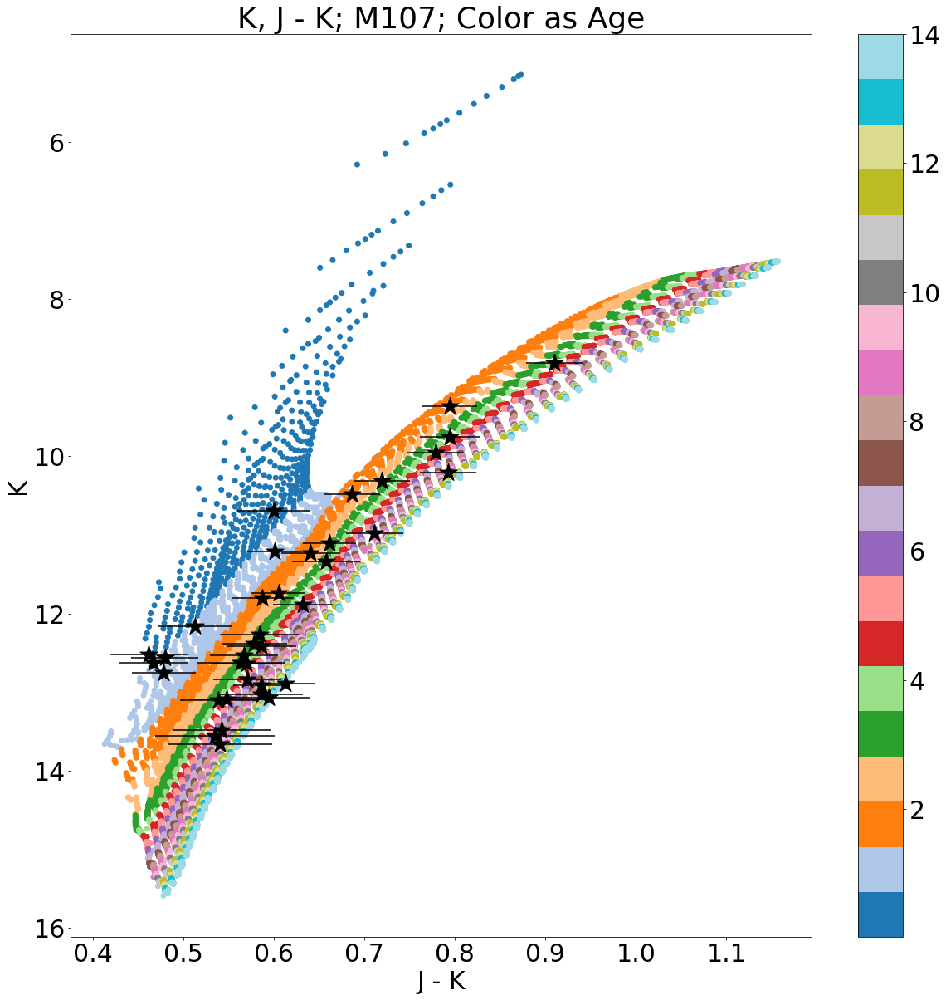

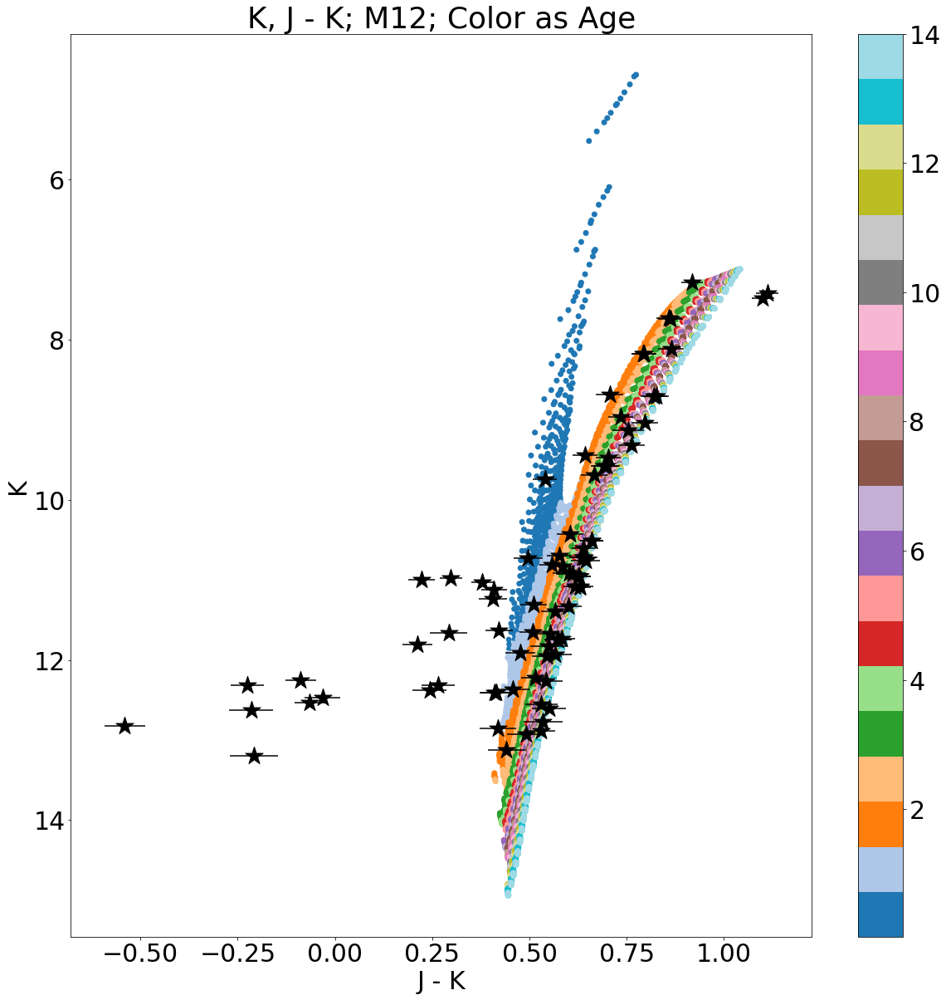

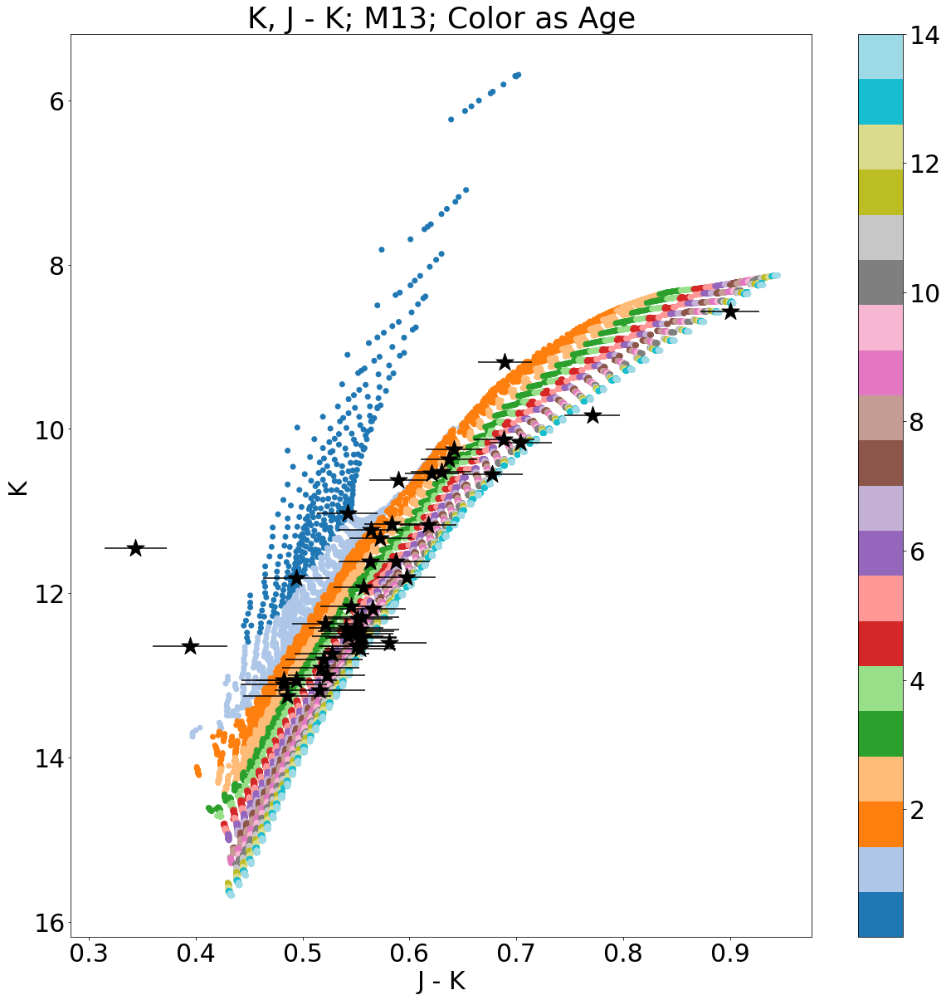

...

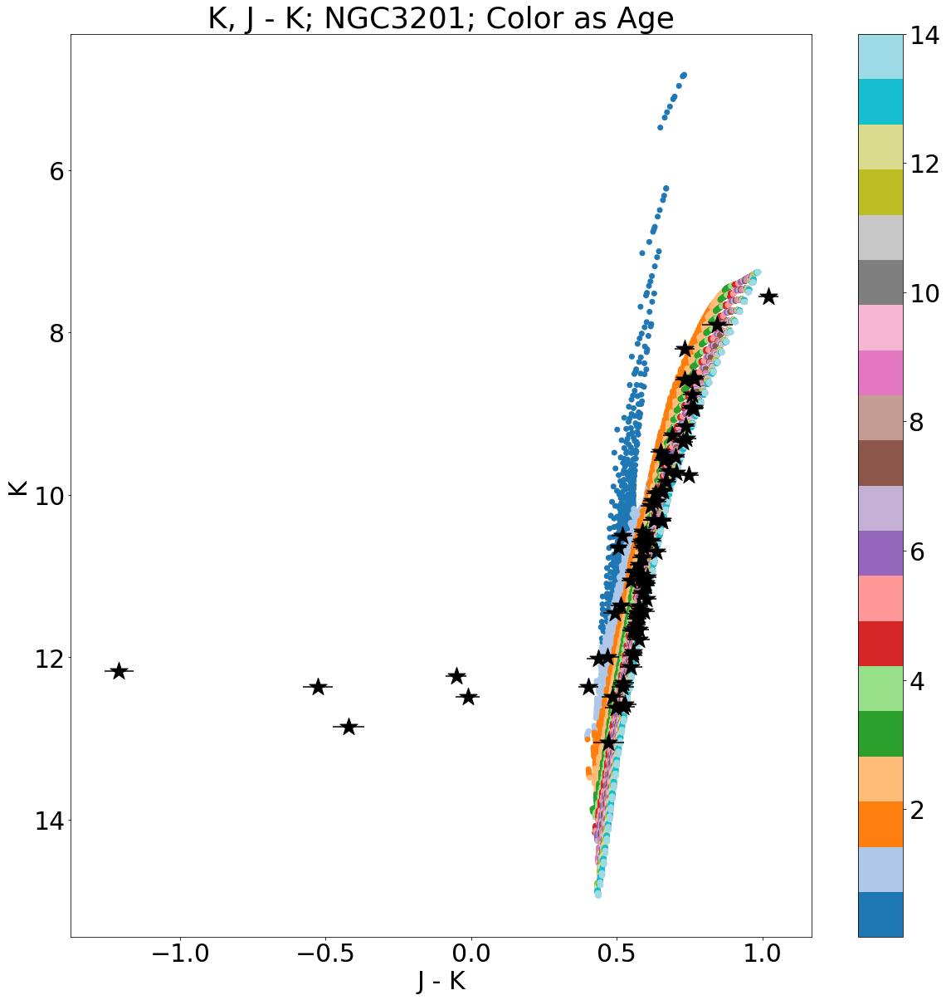

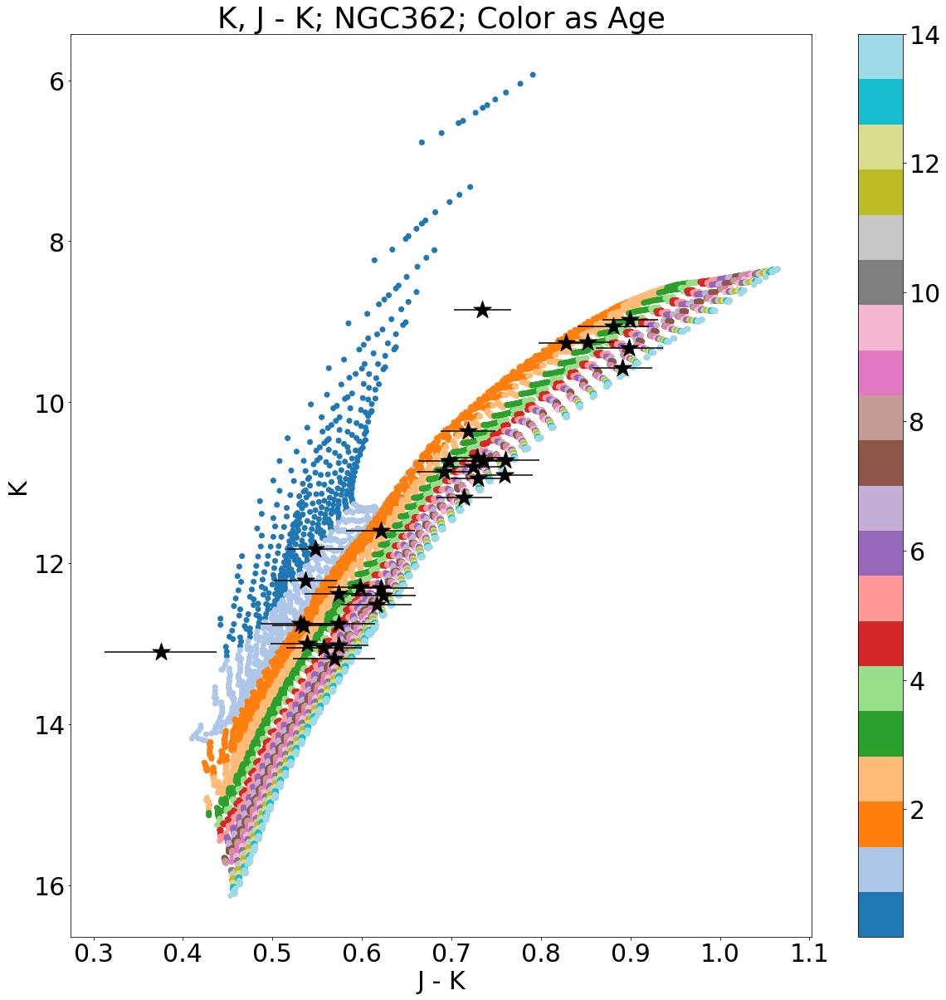

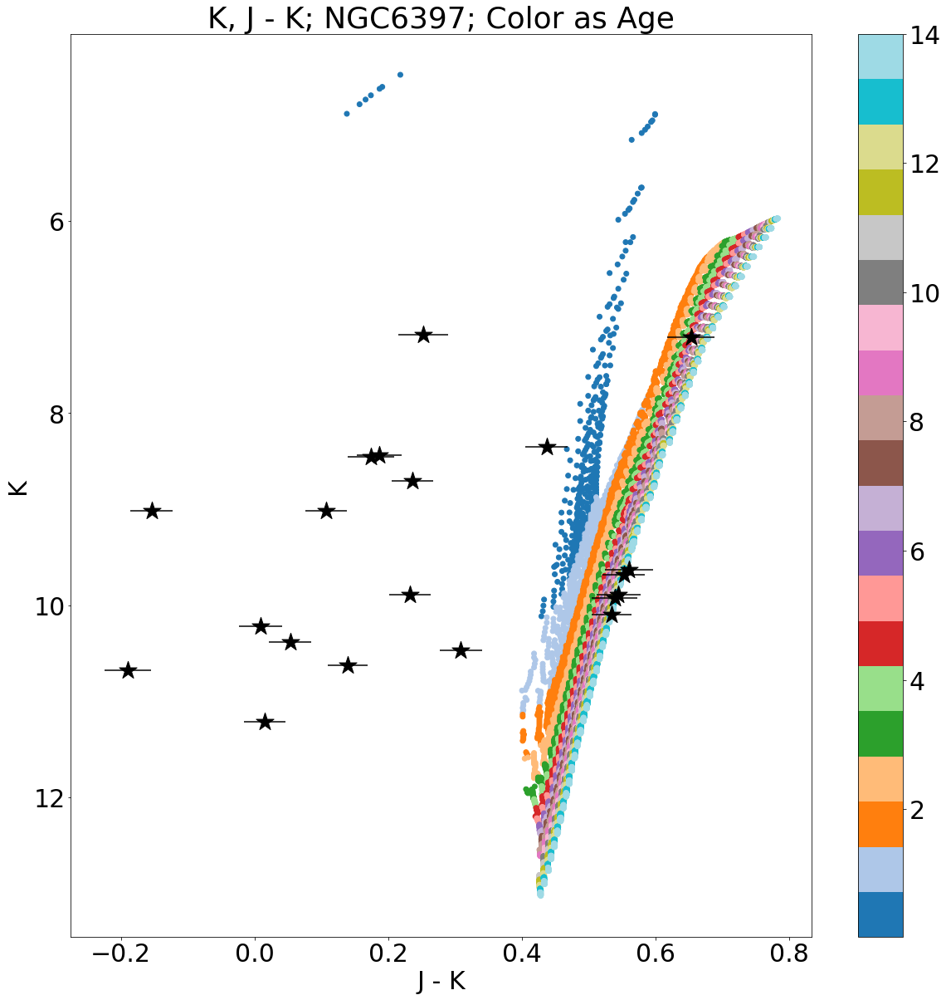

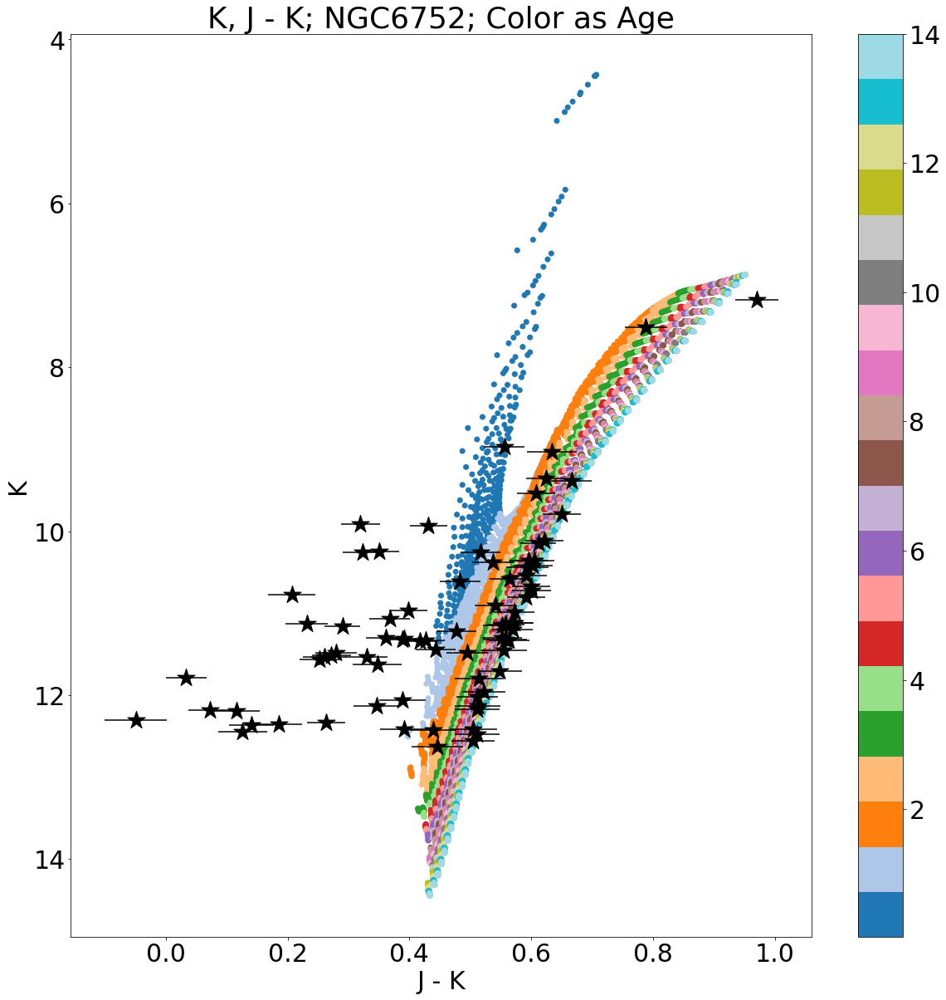

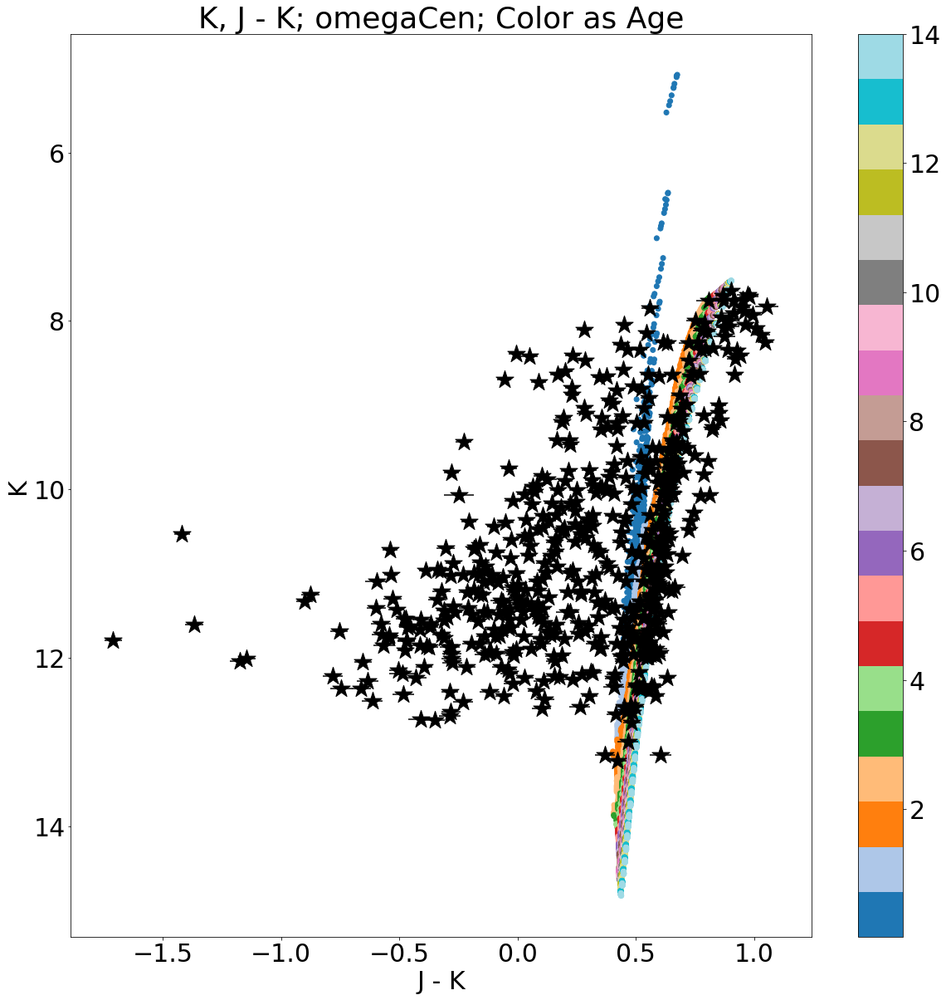

In [50]:
gcs_clus = np.unique(gcs['CLUSTER'])
ejk_ak = (cardelli_alav(leff['J'],3.1)-cardelli_alav(leff['K'],3.1))/cardelli_alav(leff['K'],3.1)
ejk = ejk_ak*best_aks

for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcs['LOGG']<2.984853))
    isopick = np.where(massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][clus])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][clus]))+0.362)))
    
    plt.figure(figsize=[20,20])
    plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],massive['Ksmag'][isopick]+5.*np.log10(harris[i])-5.0,
                c=10**massive['logAge'][isopick]/10**9,cmap='tab20',zorder=0)
    plt.colorbar()

    plt.errorbar((gcs['J']-gcs['K']-ejk)[clus],gcs['K'][clus]-best_aks[clus],c='k',
                 xerr=np.sqrt(gcs['K_ERR']**2+gcs['J_ERR']**2)[clus],yerr=gcs['K_ERR'][clus],ls='none')
    
    plt.scatter((gcs['J']-gcs['K']-ejk)[clus],gcs['K'][clus]-best_aks[clus],c='k',marker='*',s=500,zorder=1)
    
    plt.gca().invert_yaxis()
    plt.xlabel(r'J - K')
    plt.ylabel(r'K')
    plt.title(r'K, J - K; {}; Color as Age'.format(gcs_clus[i]))
    plt.show()

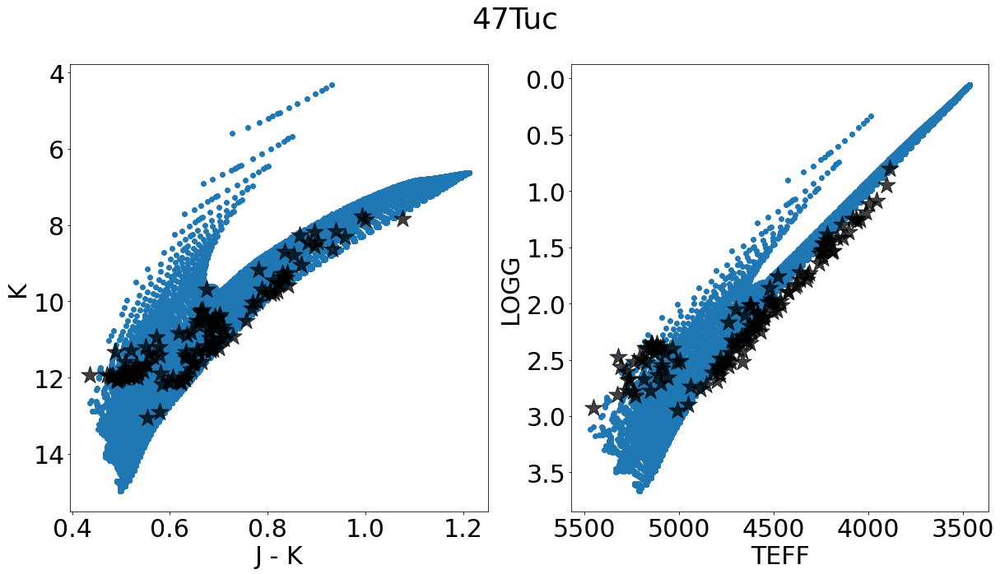

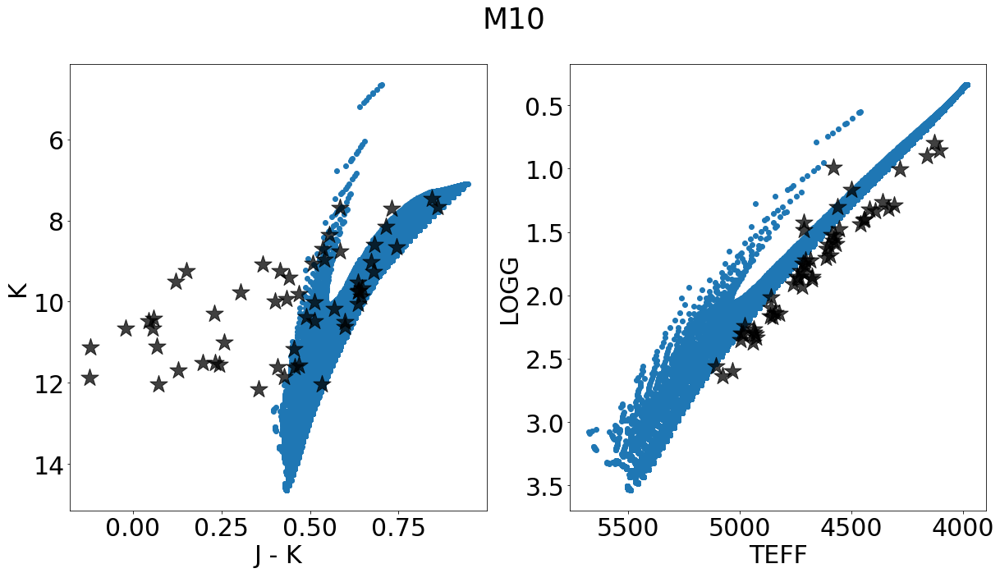

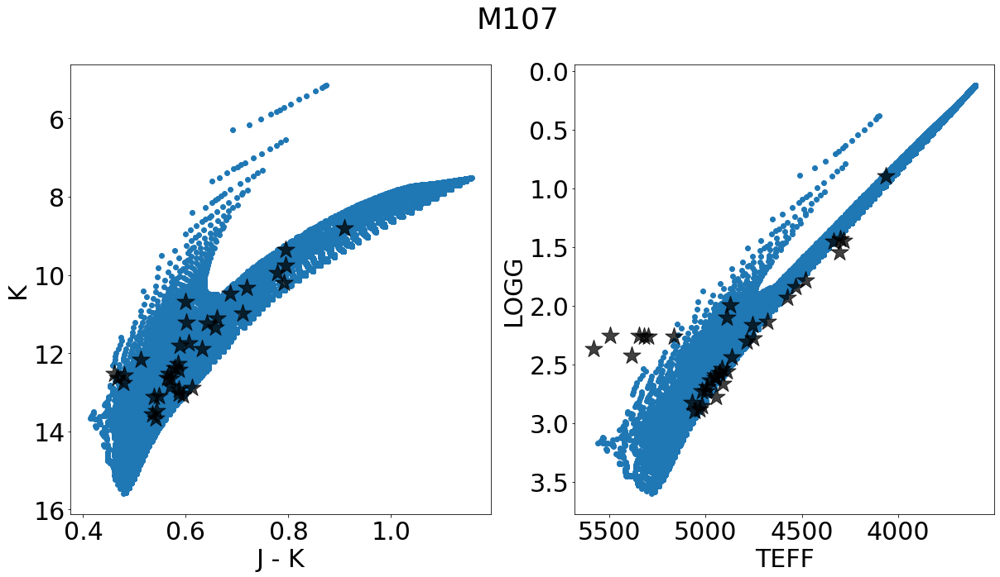

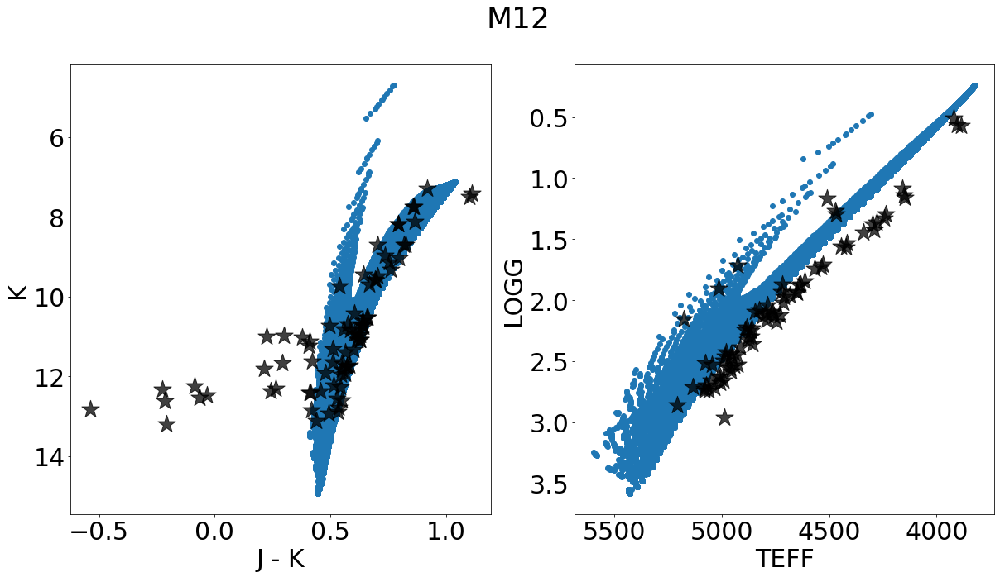

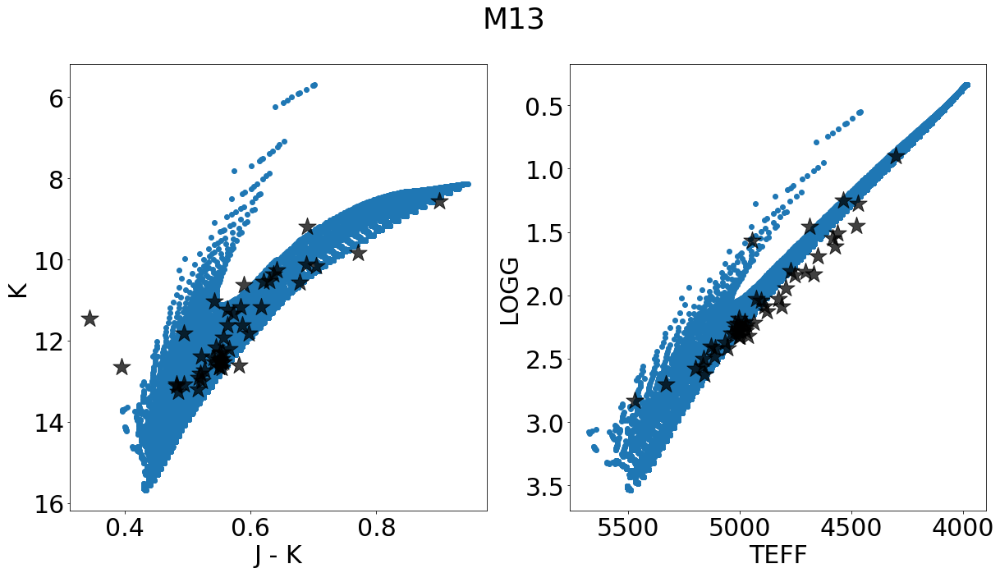

...

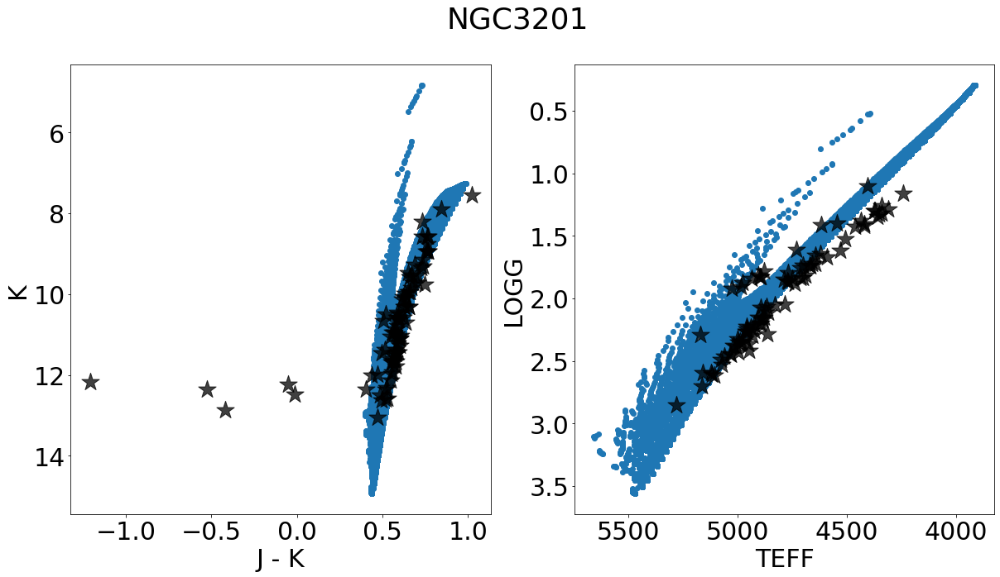

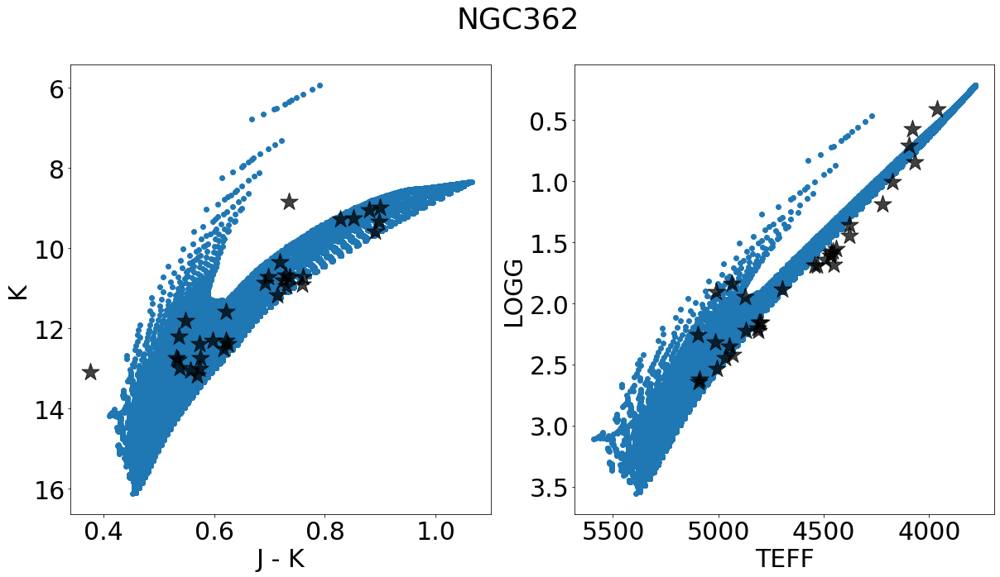

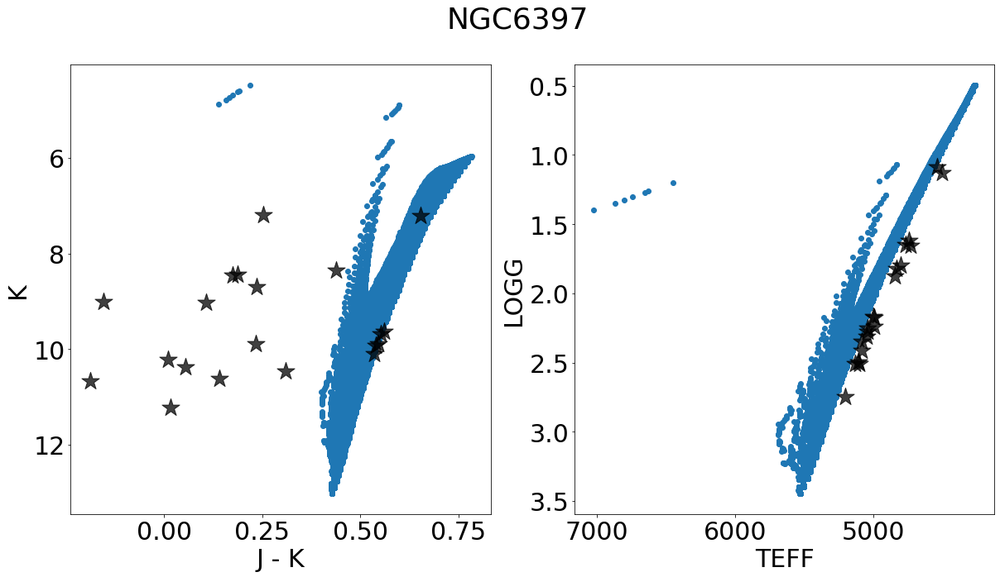

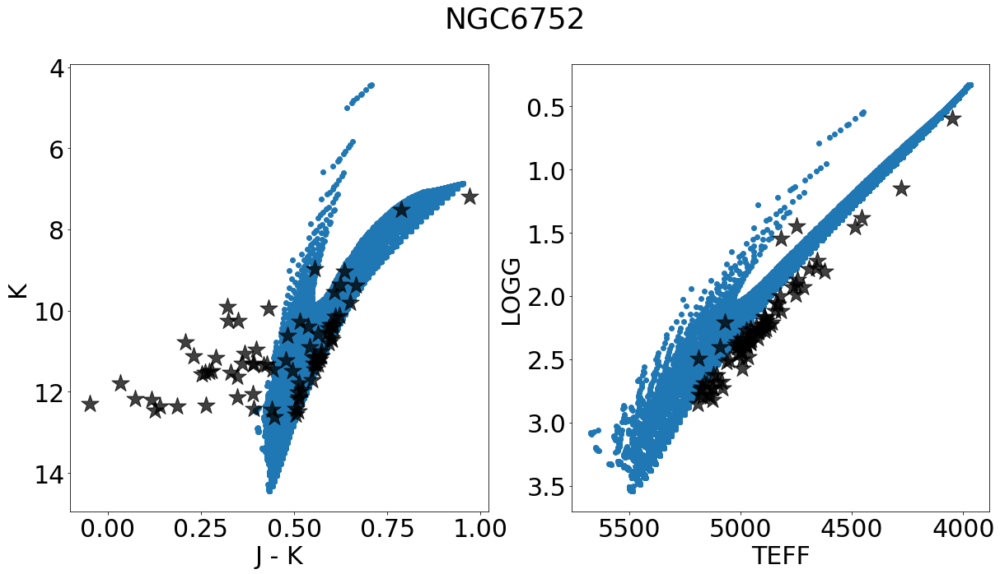

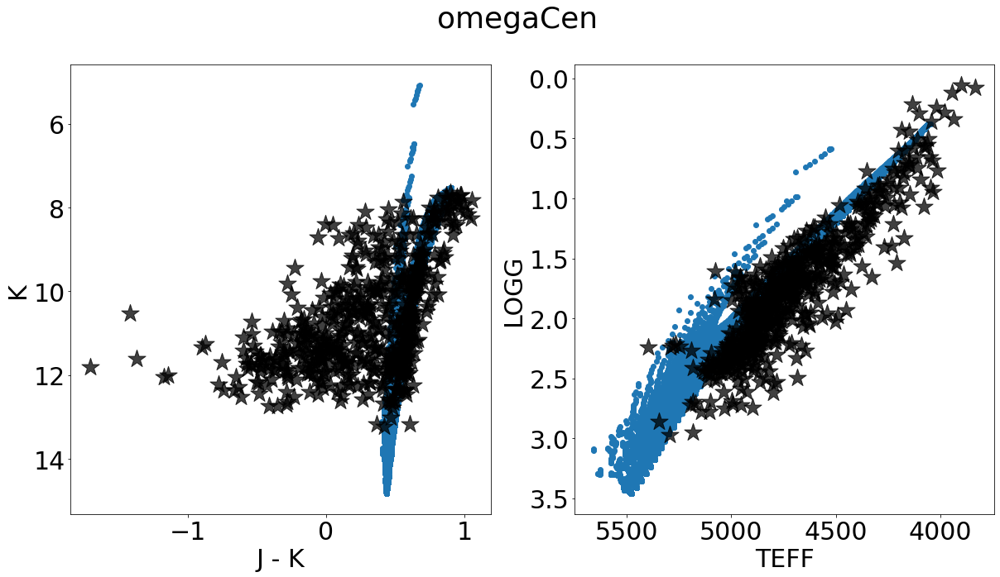

In [69]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcs['LOGG']<2.984853))
    isopick = np.where(massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][clus])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][clus]))+0.362)))
    
    fig, ax = plt.subplots(1,2,figsize=[20,10])
    ax[0].scatter((massive['Jmag']-massive['Ksmag'])[isopick],
                  massive['Ksmag'][isopick]+5.*np.log10(harris[i])-5.0,cmap='tab20',zorder=0)
    ax[0].scatter((gcs['J']-gcs['K']-ejk)[clus],gcs['K'][clus]-best_aks[clus],c='k',marker='*',s=500,zorder=1,
                  alpha=0.75)
    ax[0].invert_yaxis()
    ax[0].set_xlabel(r'J - K')
    ax[0].set_ylabel(r'K')
    
    ax[1].scatter(10**massive['logTe'][isopick],massive['logg'][isopick],cmap='tab20',zorder=0)
    ax[1].scatter(gcs['TEFF'][clus],gcs['LOGG'][clus],c='k',marker='*',s=500,zorder=1,alpha=0.75)
    ax[1].set_xlabel(r'TEFF')
    ax[1].set_ylabel(r'LOGG')
    ax[1].invert_yaxis()
    ax[1].invert_xaxis()
    
    plt.suptitle(r'{}'.format(gcs_clus[i]))
    plt.savefig('{}CMDHR.pdf'.format(gcs_clus[i]),bbox_inches='tight')
#     plt.title(r'K, J - K; {}; Color as Age'.format(gcs_clus[i]))
    plt.show()

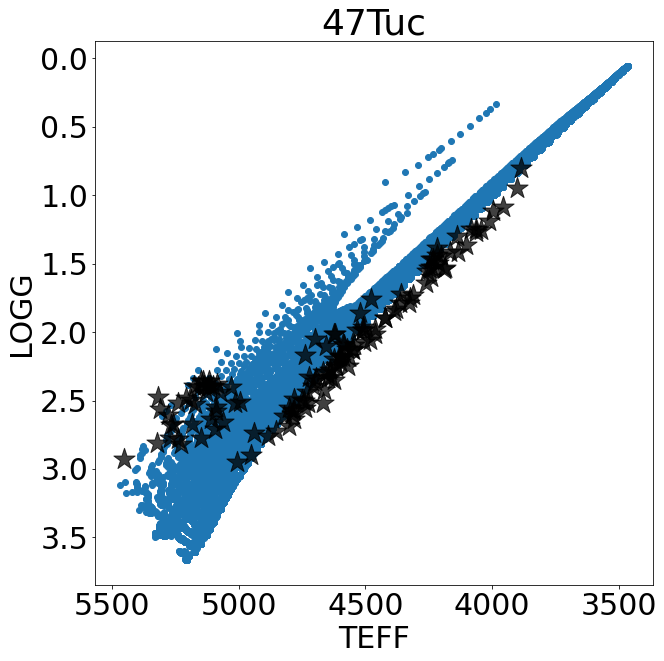

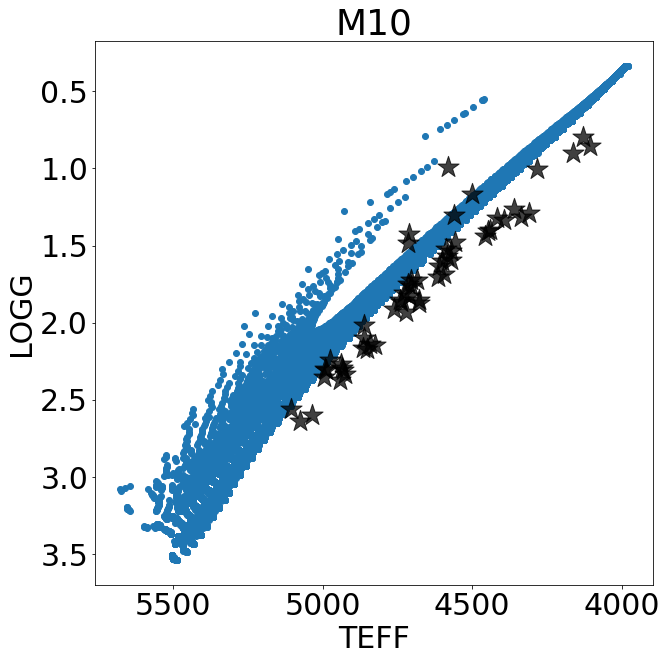

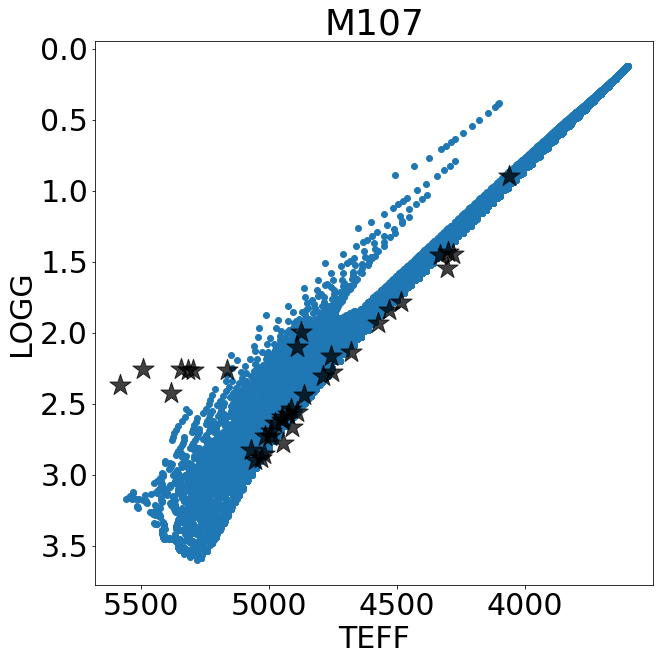

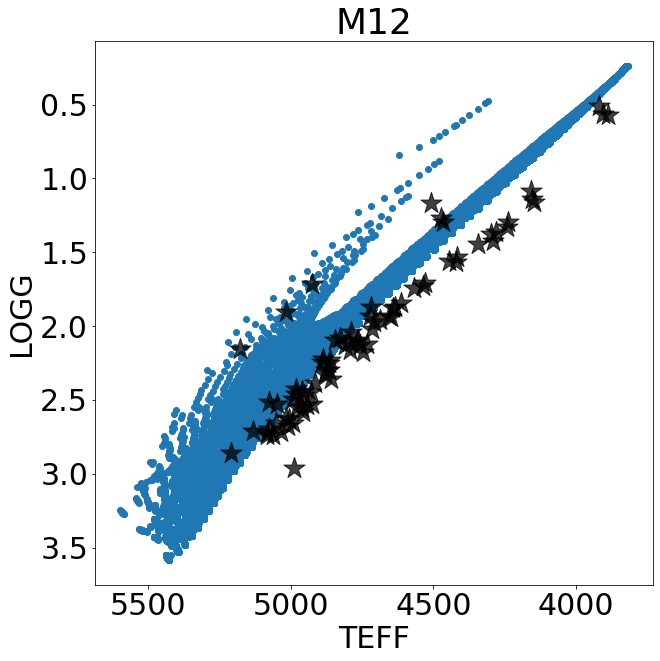

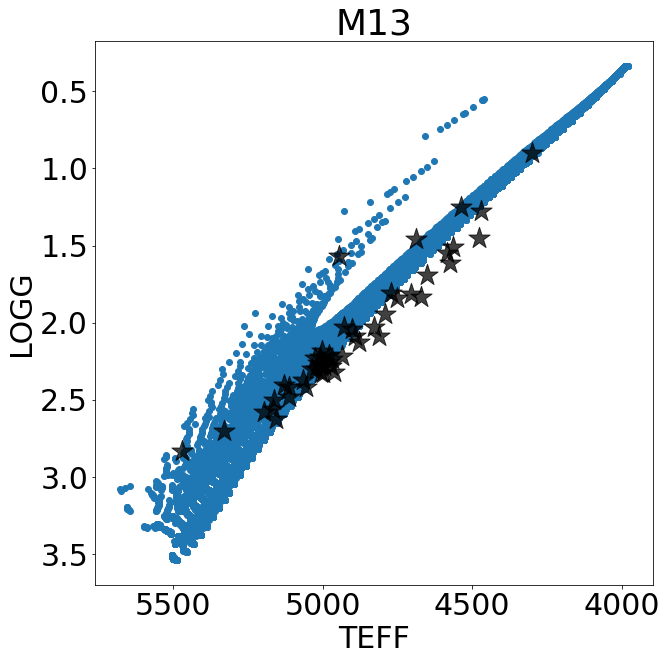

...

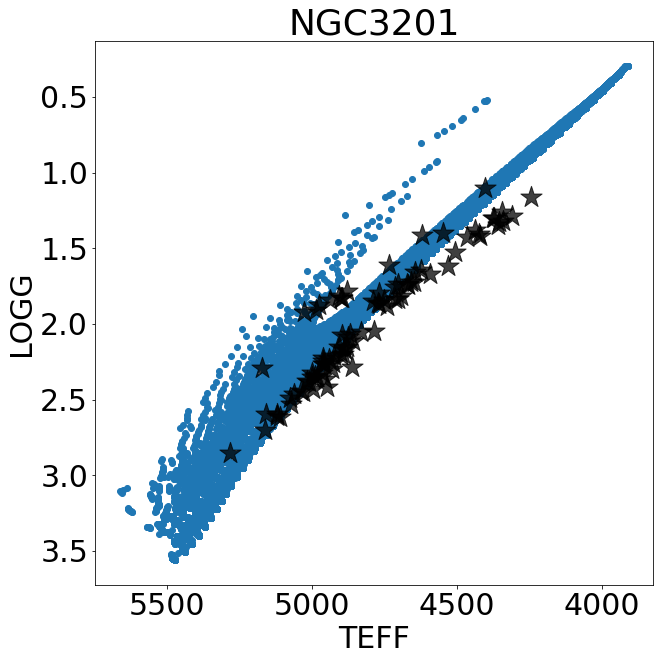

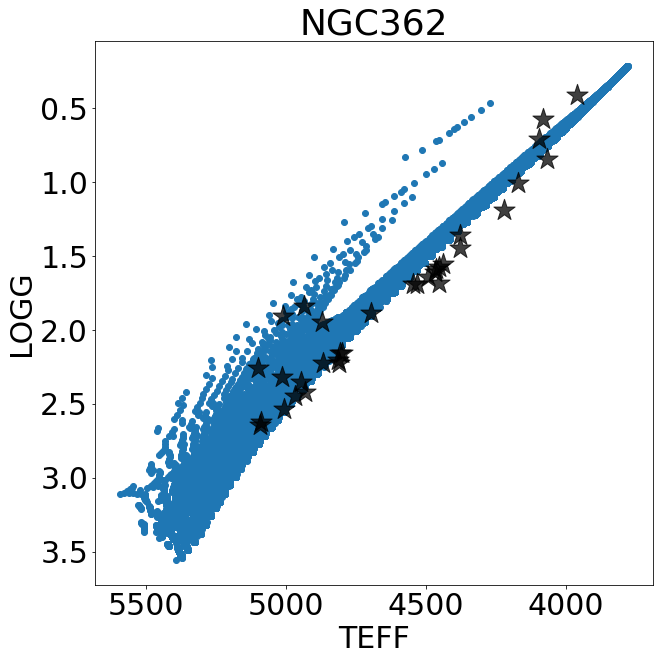

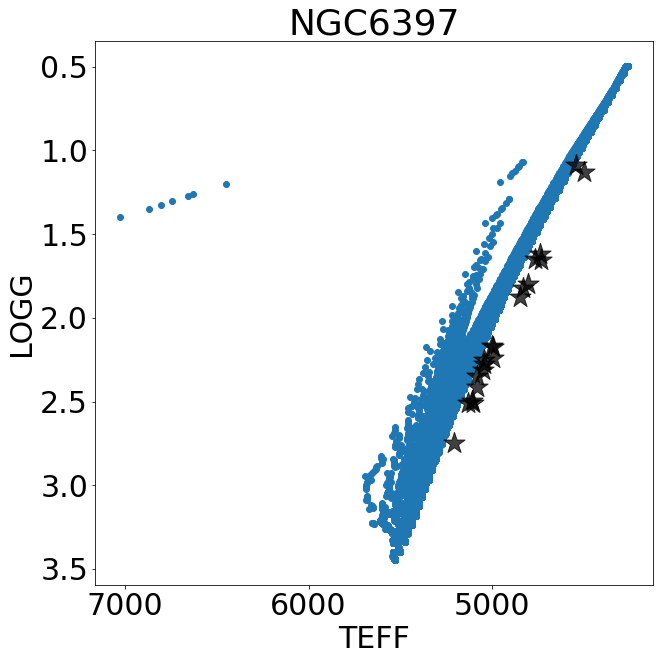

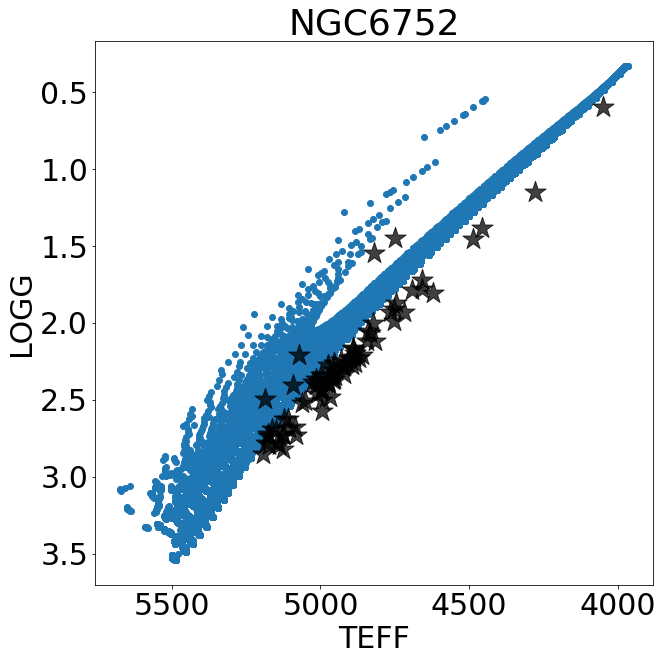

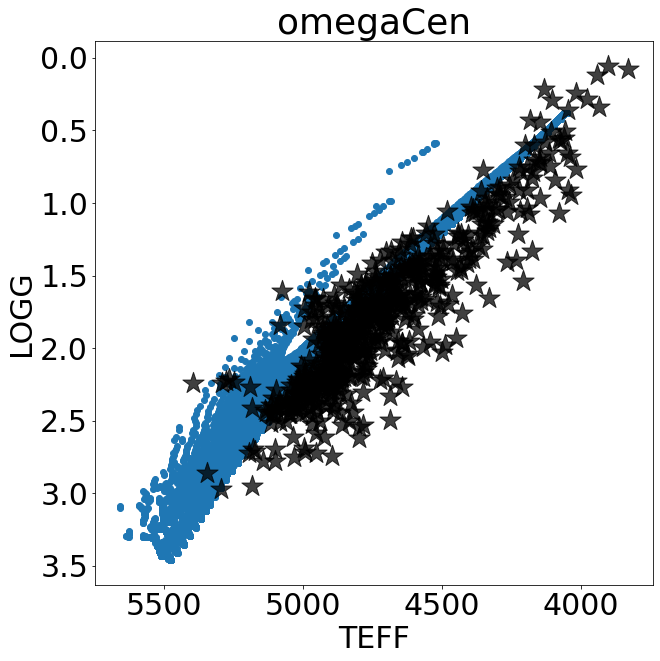

In [71]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcs['LOGG']<2.984853))
    isopick = np.where(massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][clus])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][clus]))+0.362)))
    
    plt.figure(figsize=[10,10])
    
    plt.scatter(10**massive['logTe'][isopick],massive['logg'][isopick],cmap='tab20',zorder=0)
    plt.scatter(gcs['TEFF'][clus],gcs['LOGG'][clus],c='k',marker='*',s=500,zorder=1,alpha=0.75)
    plt.xlabel(r'TEFF')
    plt.ylabel(r'LOGG')
    plt.gca().invert_yaxis()
    plt.gca().invert_xaxis()
    
    plt.title(r'{}'.format(gcs_clus[i]))
    plt.savefig('{}sHR.pdf'.format(gcs_clus[i]),bbox_inches='tight')
    plt.show()

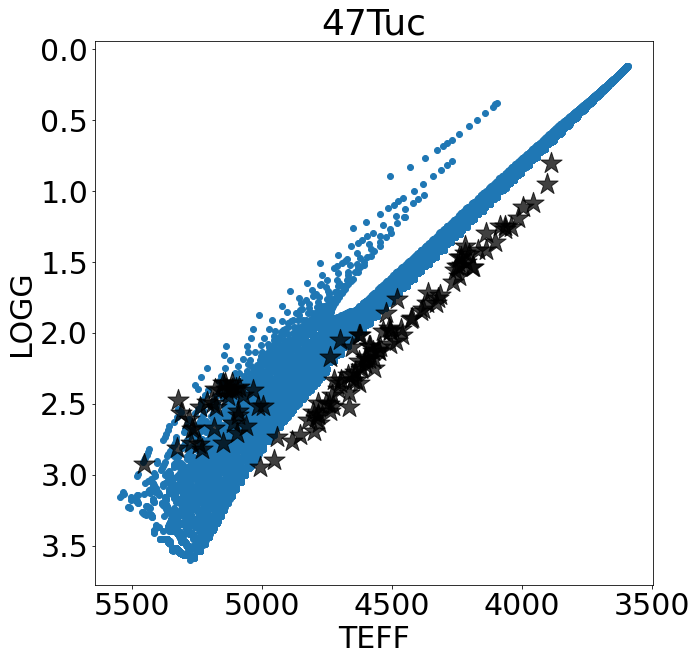

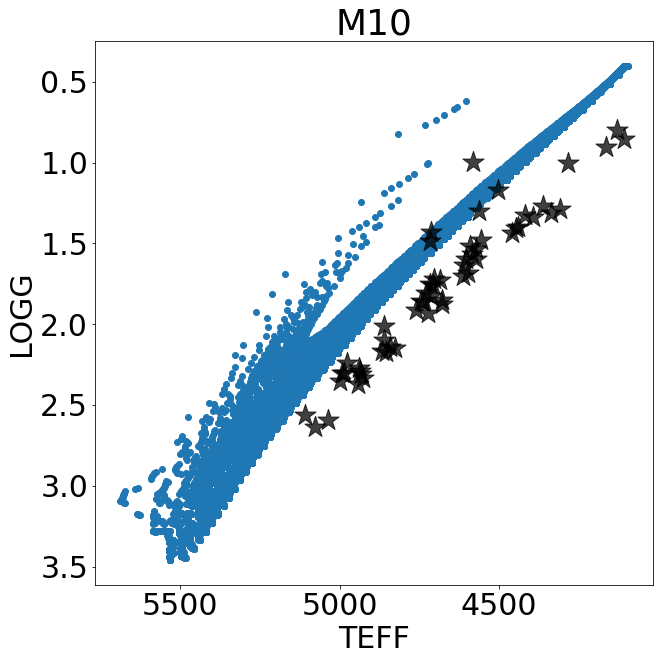

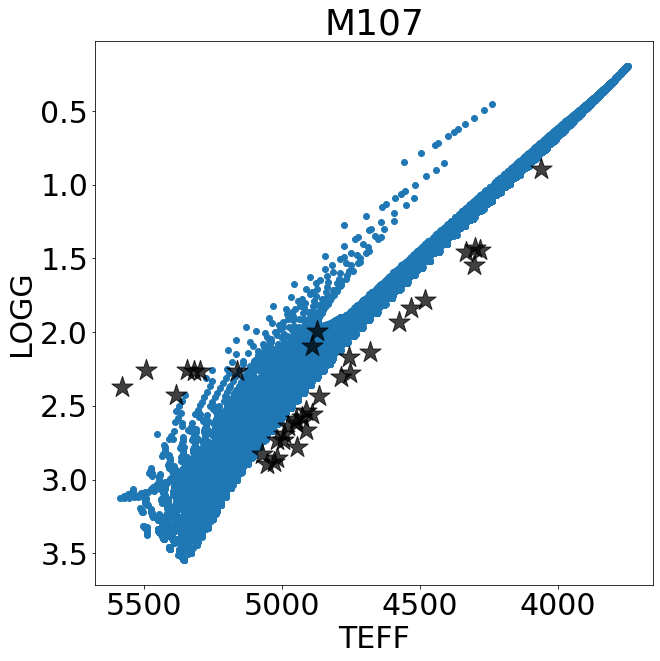

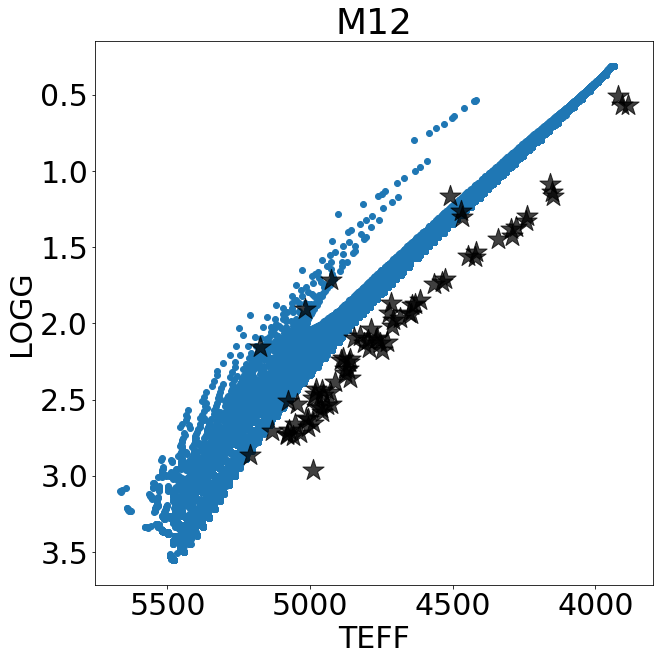

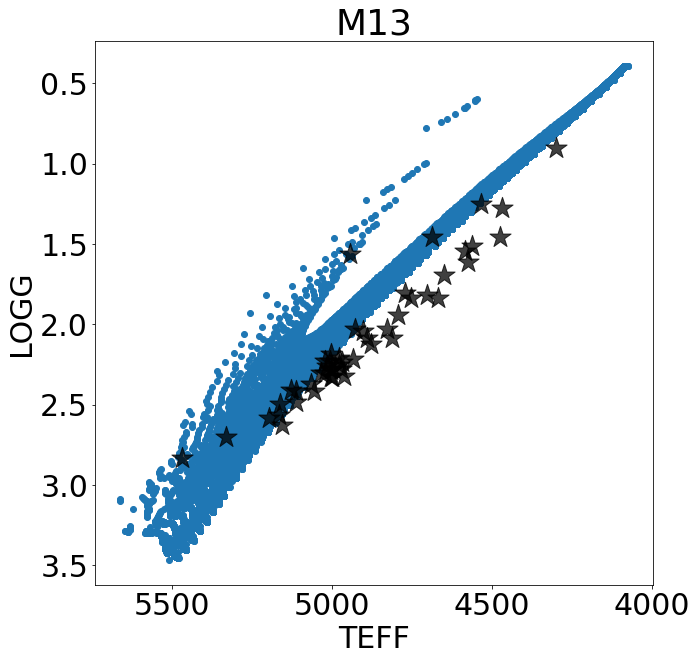

...

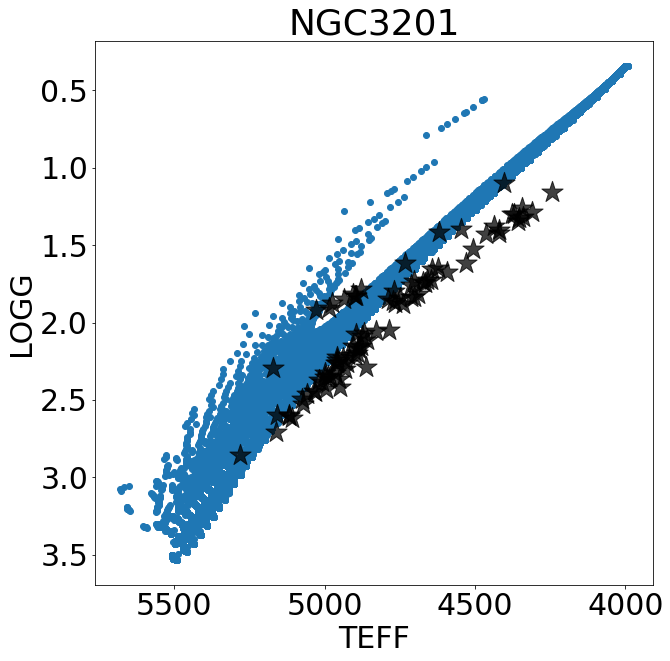

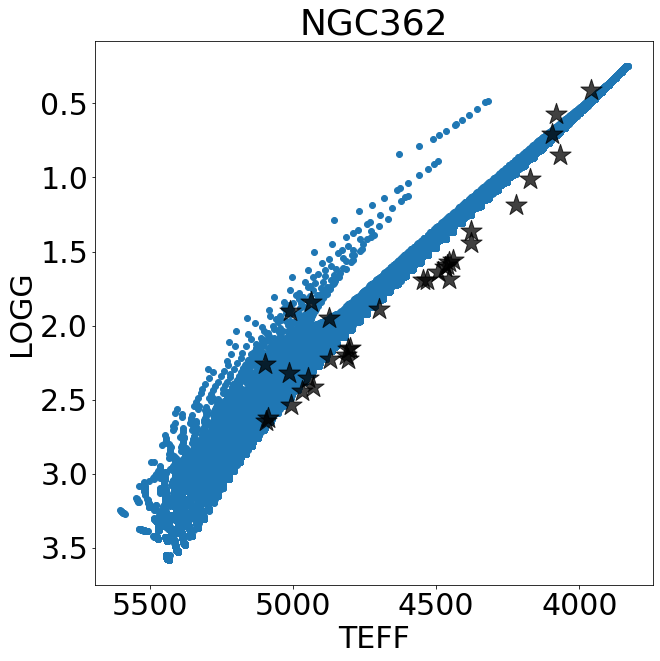

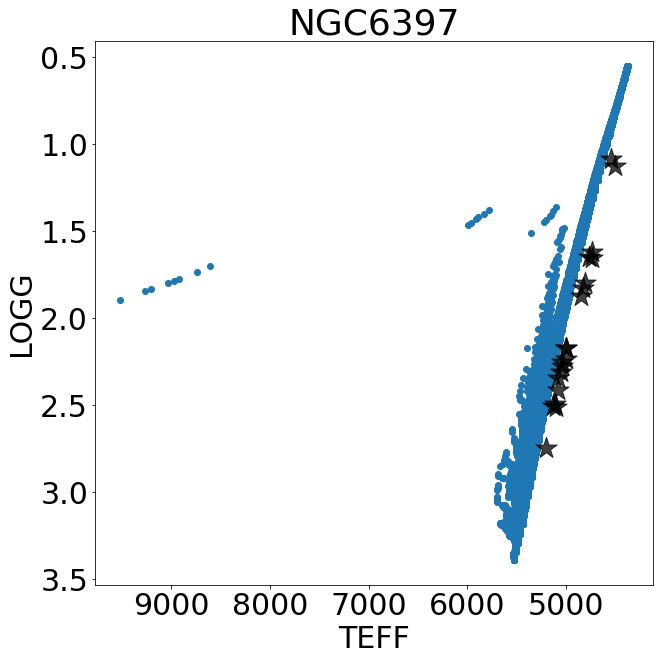

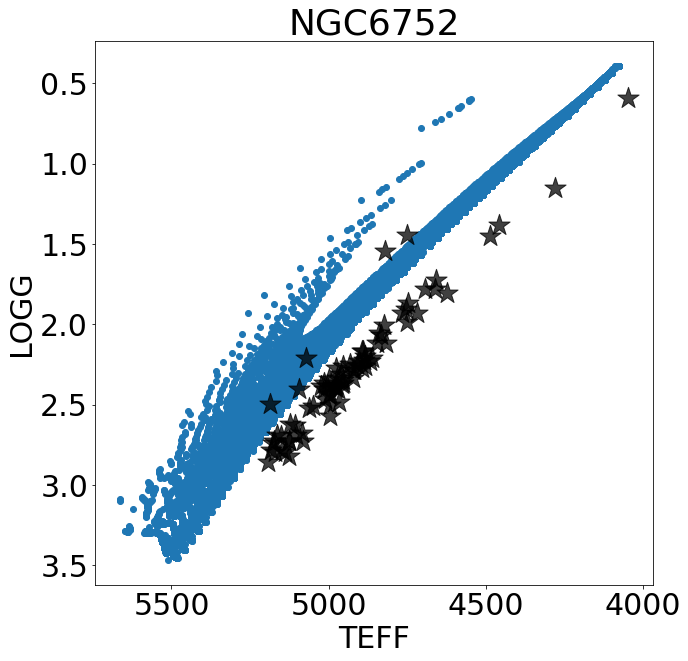

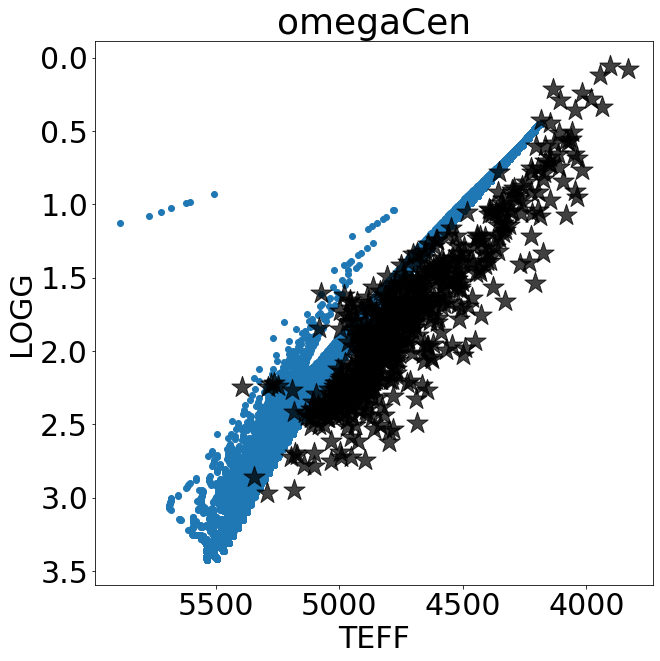

In [211]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcs['LOGG']<2.984853))
    isopick = np.where(massive['MH']==closest(massive['MH'],np.nanmedian(gcs['FE_H'][clus])))
    
    plt.figure(figsize=[10,10])
    
    plt.scatter(10**massive['logTe'][isopick],massive['logg'][isopick],cmap='tab20',zorder=0)
    plt.scatter(gcs['TEFF'][clus],gcs['LOGG'][clus],c='k',marker='*',s=500,zorder=1,alpha=0.75)
    plt.xlabel(r'TEFF')
    plt.ylabel(r'LOGG')
    plt.gca().invert_yaxis()
    plt.gca().invert_xaxis()
    
    plt.title(r'{}'.format(gcs_clus[i]))
    plt.savefig('{}sHRNoSalaris.pdf'.format(gcs_clus[i]),bbox_inches='tight')
    plt.show()

In [120]:
m22_idx, = np.where(gcs['CLUSTER']=='M22')
# m22_idx

# plt.plot(best_aks[m22_idx])
# plt.plot(best_aks[m22_idx]*ejk_ak);

# np.median(best_aks[m22_idx])

In [121]:
isopick, = np.where(massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][m22_idx])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][m22_idx]))+0.362))) 
# plt.figure(figsize=[20,20])
# plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],
#             massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22_idx][0])-5.0,
#             c=10**massive['logAge'][isopick]/10**9,cmap='tab20')
# plt.gca().invert_yaxis()

# plt.colorbar()

# plt.errorbar((gcs['J']-gcs['K']-ejk)[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c='k',
#                  xerr=np.sqrt(gcs['K_ERR']**2+gcs['J_ERR']**2)[m22_idx],yerr=gcs['K_ERR'][m22_idx],ls='none')
    
# plt.scatter((gcs['J']-gcs['K']-ejk)[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c='k',marker='*',s=500,zorder=1)
    
# # plt.gca().invert_yaxis()
# plt.xlabel(r'J - K')
# plt.ylabel(r'K')
# plt.title(r'K, J - K; {}; Color as Age'.format(gcs['CLUSTER'][m22_idx][0]))
# plt.show()

# #####
# plt.figure(figsize=[20,20])
# plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],
#             massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22_idx][0])-5.0,
#             c=10**massive['logAge'][isopick]/10**9,cmap='tab20')
# plt.gca().invert_yaxis()

# plt.colorbar()

# plt.errorbar((gcs['J']-gcs['K']-ejk_ak*np.median(best_aks))[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c='k',
#                  xerr=np.sqrt(gcs['K_ERR']**2+gcs['J_ERR']**2)[m22_idx],yerr=gcs['K_ERR'][m22_idx],ls='none')
    
# plt.scatter((gcs['J']-gcs['K']-ejk_ak*np.median(best_aks))[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c='k',
#             marker='*',s=500,zorder=1)
    
# # plt.gca().invert_yaxis()
# plt.xlabel(r'J - K')
# plt.ylabel(r'K')
# plt.title(r'K, J - K; {}; Color as Age; Median Ejk'.format(gcs['CLUSTER'][m22_idx][0]))
# plt.show()

# #####
# plt.figure(figsize=[20,20])
# plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],
#             massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22_idx][0])-5.0,
#             c=10**massive['logAge'][isopick]/10**9,cmap='tab20')
# plt.gca().invert_yaxis()

# plt.colorbar()

# plt.errorbar((gcs['J']-gcs['K']-ejk_ak*np.mean(best_aks))[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c='k',
#                  xerr=np.sqrt(gcs['K_ERR']**2+gcs['J_ERR']**2)[m22_idx],yerr=gcs['K_ERR'][m22_idx],ls='none')
    
# plt.scatter((gcs['J']-gcs['K']-ejk_ak*np.mean(best_aks))[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c='k',
#             marker='*',s=500,zorder=1)
    
# # plt.gca().invert_yaxis()
# plt.xlabel(r'J - K')
# plt.ylabel(r'K')
# plt.title(r'K, J - K; {}; Color as Age; Mean Ejk'.format(gcs['CLUSTER'][m22_idx][0]))
# plt.show()

# #####
# plt.figure(figsize=[20,20])
# plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],
#             massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22_idx][0])-5.0,
#             c=10**massive['logAge'][isopick]/10**9,cmap='tab20')
# plt.gca().invert_yaxis()

# plt.colorbar()

# plt.errorbar((gcs['J']-gcs['K'])[m22_idx],gcs['K'][m22_idx],c='k',
#                  xerr=np.sqrt(gcs['K_ERR']**2+gcs['J_ERR']**2)[m22_idx],yerr=gcs['K_ERR'][m22_idx],ls='none')
    
# plt.scatter((gcs['J']-gcs['K'])[m22_idx],gcs['K'][m22_idx],c='k',marker='*',s=500,zorder=1)
    
# # plt.gca().invert_yaxis()
# plt.xlabel(r'J - K')
# plt.ylabel(r'K')
# plt.title(r'K, J - K; {}; Color as Age'.format(gcs['CLUSTER'][m22_idx][0]))
# plt.show()

In [12]:
# for i in range(len(np.unique(gcs[m22_idx]['APOGEE_ID']))):
#     print(r'{}: {}'.format(np.unique(gcs[m22_idx]['APOGEE_ID'])[i],
#                            np.where(gcs['APOGEE_ID']==np.unique(gcs[m22_idx]['APOGEE_ID'])[i])))
    
# for i in m22_idx:
#     print(gcs['CLUSTER'][i])

# Diagnostic plots for M22

In [13]:
# initial_age = np.array([])
# initial_aks = np.array([])
# for i in tqdm_notebook(range(len(guess_ages))):
#     for j in range(len(guess_aks)):
        
#         initial_age = np.append(initial_age,guess_ages[i])
#         initial_aks = np.append(initial_aks,guess_aks[j])
        
# initial_age
# initial_aks

In [14]:
# theo_mags0 = []
# theo_magsak = []

# for i in tqdm_notebook(range(len(gcs))):
#     CalcAge = WhatsMyAgeAgain(gcs['M_H'][i],gcs['ALPHA_M'][i],gcs_dist[i],massive)
#     theo0 = []
#     theoak = []
#     for j in range(0,14):
#         theo0.append(CalcAge.Teff2AppMags(gcs['TEFF'][i],j,0))
#         theoak.append(CalcAge.Teff2AppMags(gcs['TEFF'][i],j,best_aks[i]))
    
#     theo_mags0.append(theo0)
#     theo_magsak.append(theoak)

In [15]:
# plt.figure(figsize=[10,10])
# plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],
#             massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22_idx][0])-5.0,
#             c=10**massive['logAge'][isopick]/10**9,cmap='tab20')
# plt.gca().invert_yaxis()

# # plt.colorbar()
    
# plt.scatter((gcs['J']-gcs['K']-ejk)[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c=m22_idx,marker='*',s=500,
#             zorder=1)
# plt.colorbar()

# # plt.gca().invert_yaxis()
# plt.xlabel(r'J - K')
# plt.ylabel(r'K')
# plt.title(r'K, J - K; {}; Color as Age'.format(gcs['CLUSTER'][m22_idx][0]))
# plt.show()

# #######
# plt.figure(figsize=[10,10])
# plt.scatter((massive['Jmag']-massive['Ksmag'])[isopick],
#             massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22_idx][0])-5.0,
#             c=10**massive['logAge'][isopick]/10**9,cmap='tab20')
# plt.gca().invert_yaxis()

# # plt.colorbar()
    
# plt.scatter((gcs['J']-gcs['K']-ejk)[m22_idx],gcs['K'][m22_idx]-best_aks[m22_idx],c=range(len(m22_idx)),marker='*',
#             s=500,zorder=1)
# plt.colorbar()

# # plt.gca().invert_yaxis()
# plt.xlabel(r'J - K')
# plt.ylabel(r'K')
# plt.title(r'K, J - K; {}; Color as Age'.format(gcs['CLUSTER'][m22_idx][0]))
# plt.show()

In [16]:
# (gcs['J']-gcs['K']-ejk)[m22_idx][78]

In [116]:
# np.where(gcs[m22_idx]['APOGEE_ID']==gcs[m22_idx]['APOGEE_ID'][78])
# gcs['APOGEE_ID'][m22_idx][78]
m22star = np.where(gcs['APOGEE_ID']=='2M18364201-2351316')
m22star

(array([1826]),)

In [18]:
# np.min((gcs['J']-gcs['K']-ejk)[m22_idx])
# m22star, = np.where((gcs['J']-gcs['K']-ejk)[m22_idx]==np.min((gcs['J']-gcs['K']-ejk)[m22_idx]))
# m22star

# np.where(gcs[m22_idx]['APOGEE_ID']==gcs[m22_idx]['APOGEE_ID'][m22star])

In [19]:
# np.array([[gcs['J'][idx],gcs['H'][idx],gcs['K'][idx]]],dtype=float).T.ravel()

In [117]:
ages0 = np.arange(0,15,1.0)
aks0 = np.array([0,0.5,1.0])

initial_age = np.array([])
initial_aks = np.array([])

chi = 999999.0*np.ones((len(ages0),len(aks0)))

idx = m22star
CalcAge = WhatsMyAgeAgain(gcs['M_H'][idx],gcs['ALPHA_M'][idx],10400,3.1,massive)
age = 999999.0*np.ones((len(ages0),len(aks0)))
ak = 999999.0*np.ones((len(ages0),len(aks0)))

cmags = 999999.0*np.ones((len(ages0),len(aks0)))

for i in tqdm_notebook(range(len(ages0))):
    for j in range(len(aks0)):
#         try:
        popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][idx],
                              np.array([[gcs['J'][idx][0],gcs['H'][idx][0],gcs['K'][idx][0]]],
                                       dtype=float).T.ravel(),
                              p0=[ages0[i],aks0[j]],bounds=((0.,0.),(14.,2.)),method='trf',
                              sigma=np.array([[gcs['J_ERR'][idx][0],gcs['H_ERR'][idx][0],gcs['K_ERR'][idx][0]]],
                                             dtype=float).T.ravel())
        
        age[i][j] = popt[0]
        ak[i][j] = popt[1]
        
        initial_age = np.append(initial_age,ages0[i])
        initial_aks = np.append(initial_aks,aks0[j])
        
        calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][idx],popt[0],popt[1]))
        print(calc_mags)
        
        mag_errs = np.array([gcs['J_ERR'][idx][0],gcs['H_ERR'][idx][0],gcs['K_ERR'][idx][0]])
        mags = np.array([gcs['J'][idx][0],gcs['H'][idx][0],gcs['K'][idx][0]])
        
#         print(sum((calc_mags-mags)**2/mag_errs**2))
    
#         import pdb; pdb.set_trace()
        chi[i][j]= sum((calc_mags-mags)**2/mag_errs**2) #sum((calc_mags-mags)**2/mag_errs**2)

print(np.array([gcs['J'][idx][0],gcs['H'][idx][0],gcs['K'][idx][0]]))
print(np.array([gcs['J_ERR'][idx][0],gcs['H_ERR'][idx][0],gcs['K_ERR'][idx][0]]))

[999999. 999999. 999999.]
[999999. 999999. 999999.]
[999999. 999999. 999999.]
[999999. 999999. 999999.]
[999999. 999999. 999999.]
[999999. 999999. 999999.]
[11.67809479 11.09212502 10.98012375]
[11.68114184 11.09073758 10.97588978]
[11.86296516 11.19061252 11.02450075]
[11.67809479 11.09212502 10.98012375]
[11.797326   11.14903452 10.99814173]
[12.18607264 11.39527941 11.15425252]
[12.05092205 11.5111422  11.42915215]
[11.67809479 11.09212502 10.98012375]
[11.68114185 11.09073757 10.97588977]
[11.67809479 11.09212502 10.98012375]
[11.68114184 11.09073758 10.97588978]
[11.90640379 11.21812798 11.0419446 ]
[11.67809479 11.09212502 10.98012376]
[11.68114184 11.09073758 10.97588978]
[11.68114184 11.09073758 10.97588978]
[12.11703012 11.57779455 11.49547256]
[11.68114184 11.09073758 10.97588978]
[11.68114185 11.09073758 10.97588978]
[11.68114184 11.09073757 10.97588978]
[11.68114184 11.09073758 10.97588978]
[11.68114185 11.09073757 10.97588977]
[11.67809479 11.09212502 10.98012375]
[11.6811

In [118]:
ages0 = np.arange(0,15,1.0)
aks0 = np.array([0,0.5,1.0])

initial_age = np.array([])
initial_aks = np.array([])

chi = 999999.0*np.ones((len(ages0),len(aks0)))

idx = m22star
CalcAge = WhatsMyAgeAgain(gcs['M_H'][idx],gcs['ALPHA_M'][idx],gcs_dist[m22star],3.1,massive)
age0 = 5.0
ak0 = 0.

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][idx],
                              np.array([[gcs['J'][idx][0],gcs['H'][idx][0],gcs['K'][idx][0]]],
                                       dtype=float).T.ravel(),
                              p0=[age0,ak0],bounds=((0.,0.),(14.,2.)),method='trf',
                              sigma=np.array([[gcs['J_ERR'][idx][0],gcs['H_ERR'][idx][0],gcs['K_ERR'][idx][0]]],
                                             dtype=float).T.ravel())
        
curve_age = popt[0]
curve_ak = popt[1]
print('   ')
print('--- FINAL VALUES ---')
print('curve_fit Age: ',popt[0])
print('curve_fit Ak: ',popt[1])
      
calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][idx],popt[0],popt[1]))

mag_errs = np.array([gcs['J_ERR'][idx][0],gcs['H_ERR'][idx][0],gcs['K_ERR'][idx][0]])
mags = np.array([gcs['J'][idx][0],gcs['H'][idx][0],gcs['K'][idx][0]])
    
#         import pdb; pdb.set_trace()
chi = sum((calc_mags-mags)**2/mag_errs**2)

print('chi: ',chi)

print('Catalog Mags: ',np.array([gcs['J'][idx][0],gcs['H'][idx][0],gcs['K'][idx][0]]))
print('Catalog Mag Errs: ',np.array([gcs['J_ERR'][idx][0],gcs['H_ERR'][idx][0],gcs['K_ERR'][idx][0]]))

   
--- FINAL VALUES ---
curve_fit Age:  13.624952603396974
curve_fit Ak:  0.8496309455302625
chi:  1393.449459603968
Catalog Mags:  [11.688 11.072 10.991]
Catalog Mag Errs:  [0.025 0.023 0.023]


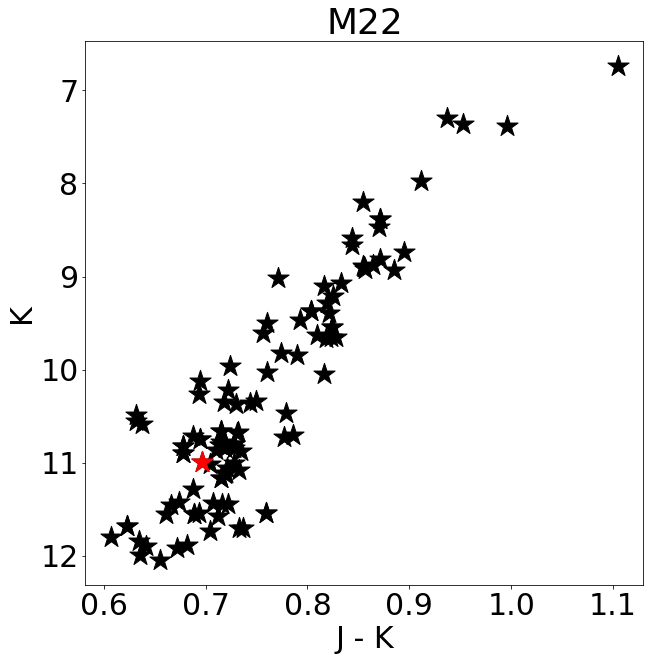

In [122]:
plt.figure(figsize=[10,10])
plt.scatter((gcs['J']-gcs['K'])[m22_idx],(gcs['K'])[m22_idx],c='k',marker='*',s=500,zorder=1) 
plt.scatter((gcs['J']-gcs['K'])[1826],(gcs['K'])[1826],c='r',marker='*',s=500,zorder=1)
plt.gca().invert_yaxis()
plt.xlabel(r'J - K')
plt.ylabel(r'K')
plt.title(r'M22')
plt.show()

In [123]:
gcs_dist[m22_idx][0]

3200.0

In [125]:
ages0 = np.arange(0,15,1.0)
aks0 = np.array([0,0.5,1.0])

# initial_age = np.array([])
# initial_aks = np.array([])

m22age = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22age_err = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22ak = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22ak_err = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22chi = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))

for k in tqdm_notebook(range(len(m22_idx))):
    
    CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx[k]],gcs['ALPHA_M'][m22_idx[k]],gcs_dist[m22_idx][0],3.1,massive)
    
    for i in range(len(ages0)):
        for j in range(len(aks0)):
            try:
                popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx[k]],
                              np.array([[gcs['J'][m22_idx[k]],gcs['H'][m22_idx[k]],gcs['K'][m22_idx[k]]]],
                                       dtype=float).T.ravel(),
                              p0=[ages0[i],aks0[j]],bounds=((0.,0.),(14.,2.)),method='trf',
                              sigma=np.array([[gcs['J_ERR'][m22_idx[k]],gcs['H_ERR'][m22_idx[k]],
                                               gcs['K_ERR'][m22_idx[k]]]],
                                             dtype=float).T.ravel(),maxfev=5000,absolute_sigma=True)
        
                m22age[i,j,k] = popt[0]
                m22age_err[i,j,k] = np.sqrt(pcov[0][0])
                m22ak[i,j,k] = popt[1]
                m22ak_err[i,j,k] = np.sqrt(pcov[1][1])
        
                calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx[k]],popt[0],popt[1]))
                mag_errs = np.array([gcs['J_ERR'][m22_idx[k]],gcs['H_ERR'][m22_idx[k]],gcs['K_ERR'][m22_idx[k]]])
                mags = np.array([gcs['J'][m22_idx[k]],gcs['H'][m22_idx[k]],gcs['K'][m22_idx[k]]])
    
#         import pdb; pdb.set_trace()
                m22chi[i,j,k] = sum((calc_mags-mags)**2/mag_errs**2) #sum((calc_mags-mags)**2/mag_errs**2)
            
            except:
                print([i,j,k])
                m22age[i,j,k] = 999999.0
                m22age_err[i,j,k] = 999999.0
                m22ak[i,j,k] = 999999.0
                m22ak_err[i,j,k] = 999999.0
                m22chi[i,j,k] = 999999.0

In [126]:
m22bestchi = [] #999999.0*np.ones(len(m22_idx))
m22bestak = [] #999999.0*np.ones(len(m22_idx))

for i in tqdm_notebook(range(len(m22_idx))):
    bestind = np.where(chi[:,:,i]==np.min(m22chi[:,:,i]))
#     print(chi[:,:,i][bestind])
    m22bestchi.append(m22chi[:,:,i][bestind][0])
    m22bestak.append(m22ak[:,:,i][bestind][0])
#     bestind = list(zip(*bestind))[0]
#     bestchi = np.append(bestchi,chi[:,:,i][bestind])
#     bestak = np.append(bestak,ak[:,:,i][bestind])

In [127]:
ejk_ak

1.4901972382364816

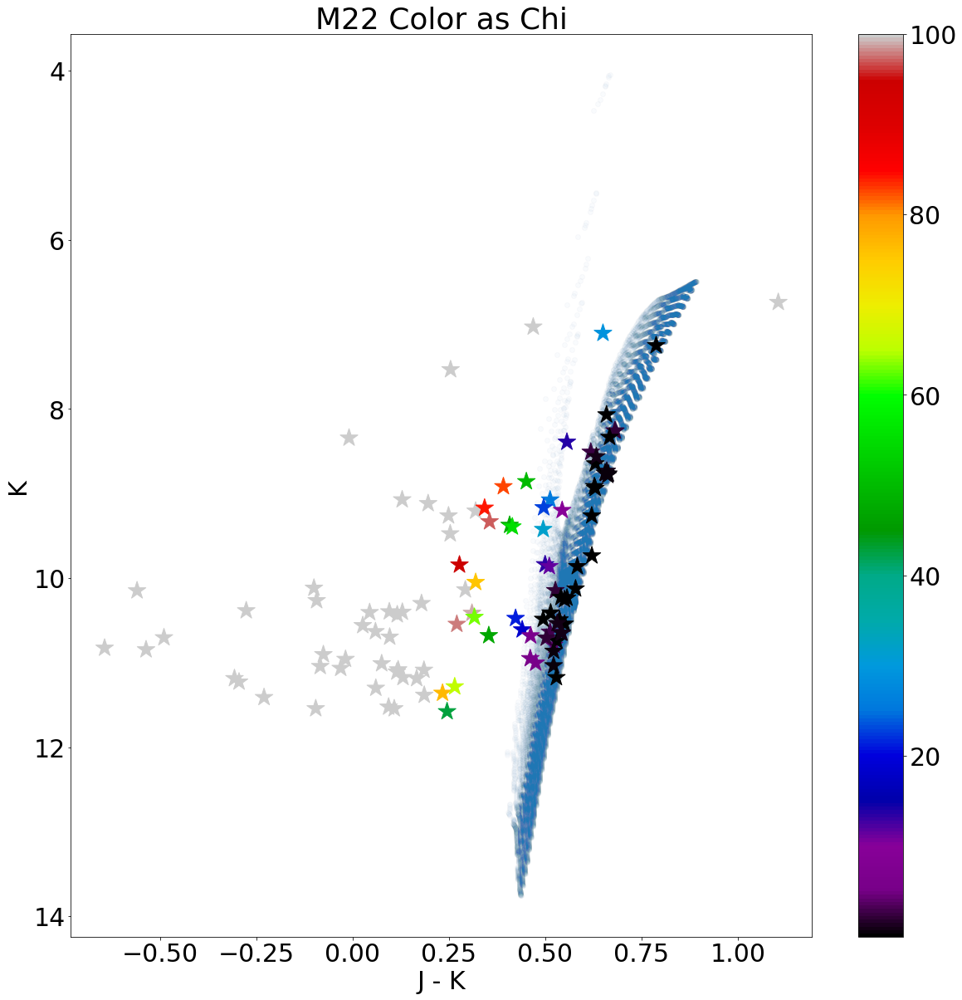

In [130]:
m22iso = np.where(massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][m22_idx])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][m22_idx]))+0.362)))

plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive[m22iso]['Ksmag']+5*np.log10(gcs_dist[m22_idx][0])-5,alpha=0.01)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestak),(gcs['K'])[m22_idx]-m22bestak,c=m22bestchi,
            marker='*',s=500,zorder=1,cmap='nipy_spectral',vmax=100) 
plt.colorbar()
plt.gca().invert_yaxis()
plt.xlabel(r'J - K')
plt.ylabel(r'K')
plt.title(r'M22 Color as Chi')
plt.show()

In [131]:
#all stars keep track of chi sq cmd uses fit ak and color code by chi sq

In [132]:
m22_idx

array([1748, 1749, 1750, 1751, 1752, 1753, 1754, 1755, 1756, 1757, 1758,
       1759, 1760, 1761, 1762, 1763, 1764, 1765, 1766, 1767, 1768, 1769,
       1770, 1771, 1772, 1773, 1774, 1775, 1776, 1777, 1778, 1779, 1780,
       1781, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791,
       1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799, 1800, 1801, 1802,
       1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811, 1812, 1813,
       1814, 1815, 1816, 1817, 1818, 1819, 1820, 1821, 1822, 1823, 1824,
       1825, 1826, 1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834, 1835,
       1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846,
       1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855])

In [134]:
ages0 = np.arange(0,15,1.0)
aks0 = np.array([0,0.5,1.0])

m22curve_chis = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22curve_ages = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22curve_ages_err = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22curve_aks = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22curve_aks_err = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
for k in tqdm_notebook(range(len(m22_idx))):
        CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx[k]],gcs['ALPHA_M'][m22_idx[k]],gcs_dist[m22_idx[k]],
                                  3.1,massive)
        for i in range(len(ages0)):
            for j in range(len(aks0)):
                try:
                    popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx[k]],
                                  np.array([[gcs['J'][m22_idx[k]],gcs['H'][m22_idx[k]],gcs['K'][m22_idx[k]]]],
                                       dtype=float).T.ravel(),
                                  p0=[ages0[i],aks0[j]],bounds=((12.,0.),(12.01,2.)),method='trf',
                                  sigma=np.array([[gcs['J_ERR'][m22_idx[k]],gcs['H_ERR'][m22_idx[k]],
                                                   gcs['K_ERR'][m22_idx[k]]]],dtype=float).T.ravel(),maxfev=5000,
                                          absolute_sigma=True)
        
                    m22curve_ages[i,j,k] = popt[0]
                    m22curve_aks[i,j,k] = popt[1]
                    m22curve_ages_err[i,j,k] = np.sqrt(pcov[0][0])
                    m22curve_aks_err[i,j,k] = np.sqrt(pcov[1][1])
      
                    calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx[k]],popt[0],popt[1]))
                    mag_errs = np.array([gcs['J_ERR'][m22_idx[k]],gcs['H_ERR'][m22_idx[k]],
                                         gcs['K_ERR'][m22_idx[k]]])
                    mags = np.array([gcs['J'][m22_idx[k]],gcs['H'][m22_idx[k]],gcs['K'][m22_idx[k]]])
                    m22curve_chis[i,j,k] = sum((calc_mags-mags)**2/mag_errs**2)
                    
                except:
                    m22curve_ages[i,j,k]=999999.0
                    m22curve_aks[i,j,k]=999999.0
                    m22curve_chis[i,j,k]=999999.0
                    m22curve_ages_err[i,j,k]=999999.0
                    m22curve_aks_err[i,j,k]=999999.0

In [135]:
m22bestaks = 999999.0*np.ones(len(m22_idx))
m22bestchis = 999999.0*np.ones(len(m22_idx))
m22bestages = 999999.0*np.ones(len(m22_idx))
m22bestaks_err = 999999.0*np.ones(len(m22_idx))
m22bestages_err = 999999.0*np.ones(len(m22_idx))
for i in range(len(m22_idx)):
    bestidx = np.where(m22curve_chis[:,:,i]==np.min(m22curve_chis[:,:,i]))
    m22bestchis[i] = np.median(m22curve_chis[:,:,i][bestidx])
    m22bestaks[i] = np.median(m22curve_aks[:,:,i][bestidx])
    m22bestages[i] = np.median(m22curve_ages[:,:,i][bestidx])
    m22bestaks_err[i] = np.median(m22curve_aks_err[:,:,i][bestidx])
    m22bestages_err[i] = np.median(m22curve_ages_err[:,:,i][bestidx])

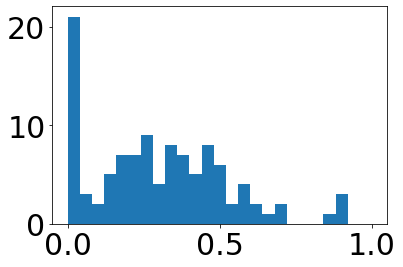

0.29133331367512194


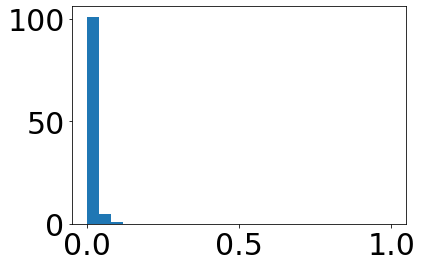

0.021781054843234223


In [139]:
plt.hist(m22bestaks,range=(0,1.),bins=25)
plt.show()
print(np.median(m22bestaks))

plt.hist(m22bestaks_err,range=(0,1.),bins=25)
plt.show()
print(np.median(m22bestaks_err))

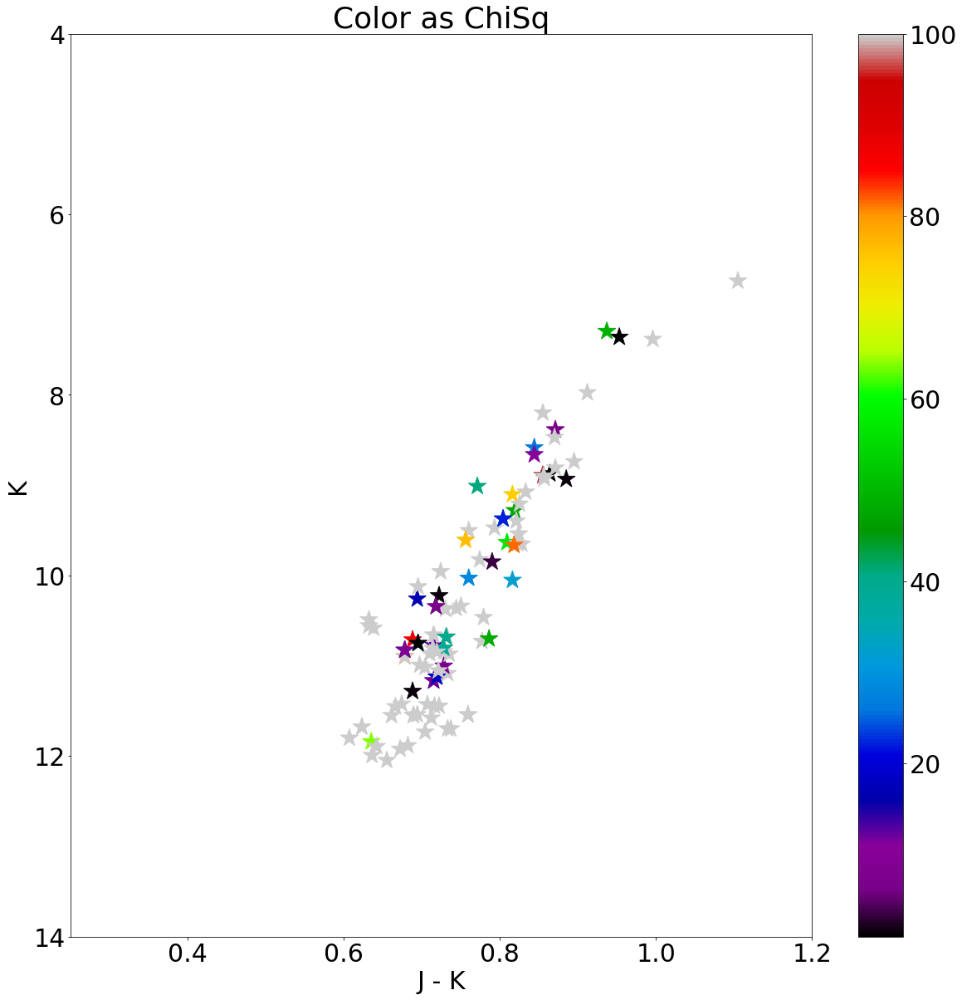

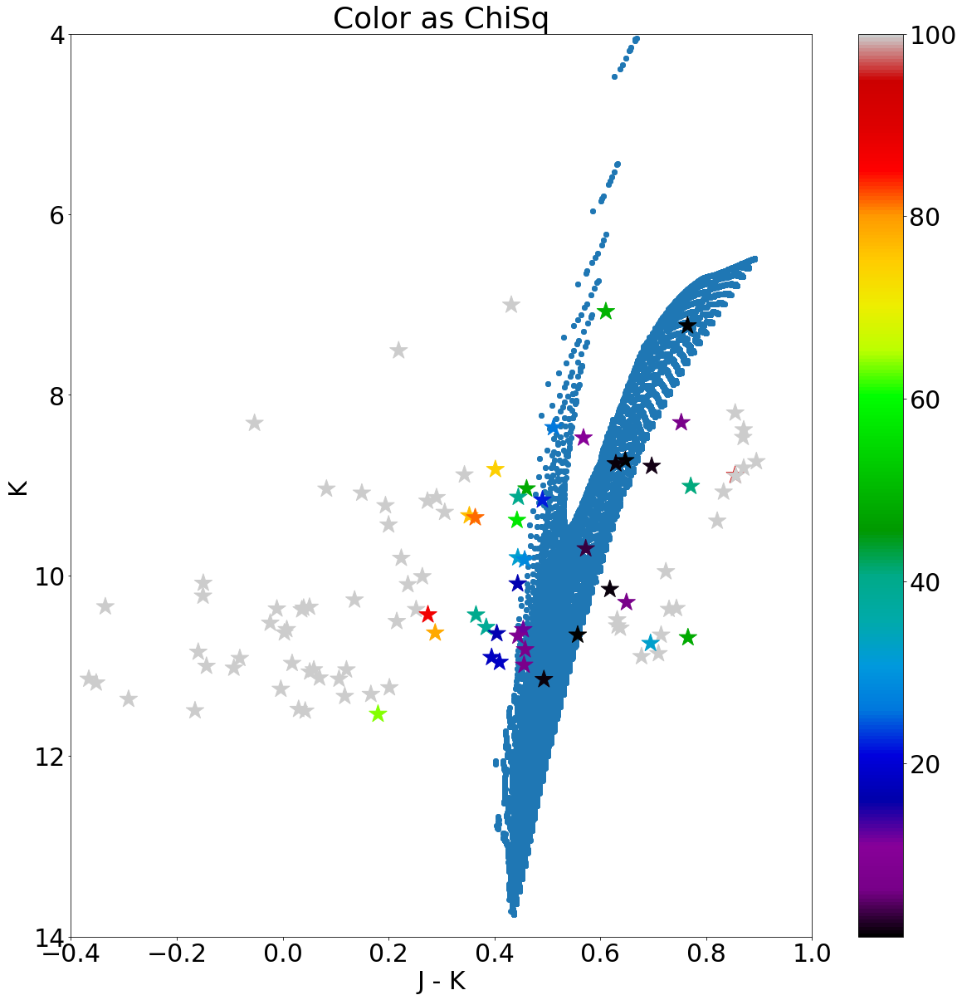

In [140]:
### Without Isochrones
plt.figure(figsize=[20,20])
plt.scatter((gcs['J']-gcs['K'])[m22_idx],gcs['K'][m22_idx],c=m22bestchis,cmap='nipy_spectral',vmax=100,marker='*',
            s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as ChiSq')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(0.25,1.2)
plt.show()

### With Isochrones
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks),gcs['K'][m22_idx]-m22bestaks,c=m22bestchis,cmap='nipy_spectral',vmax=100,
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as ChiSq')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.0)
plt.show()

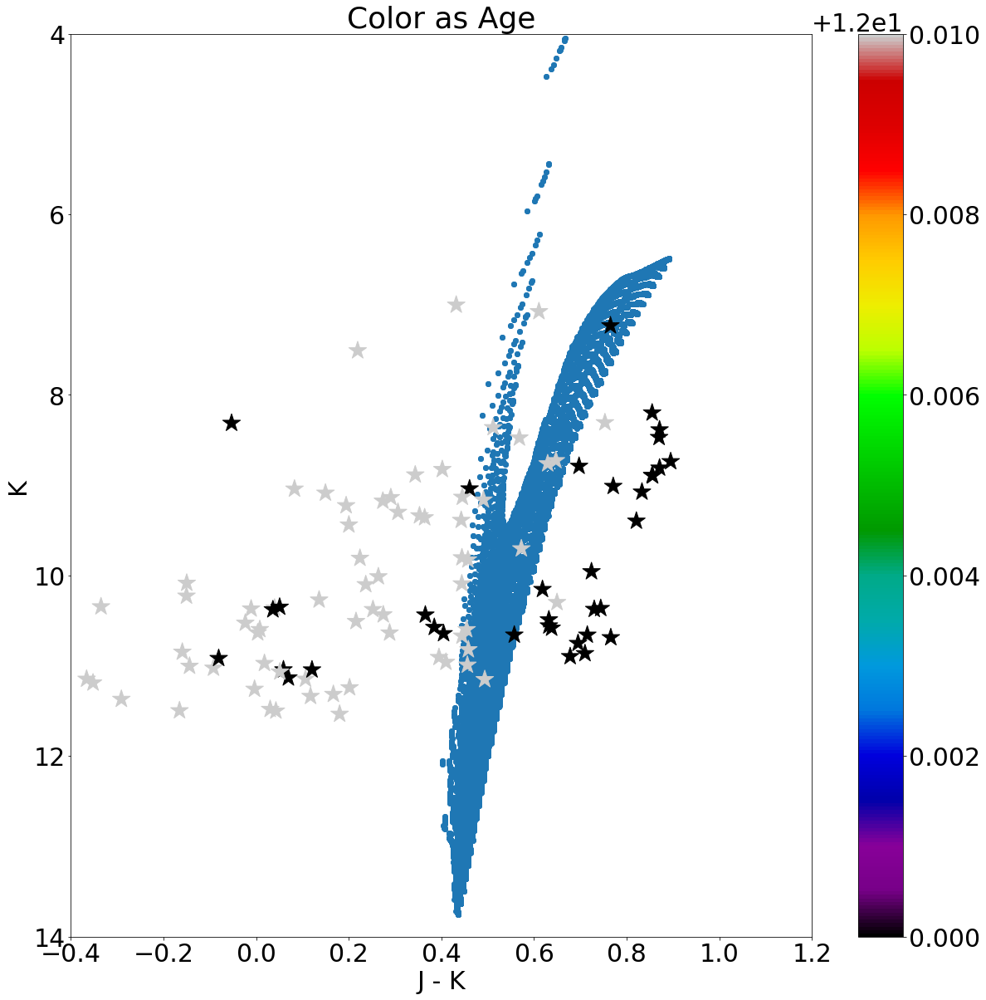

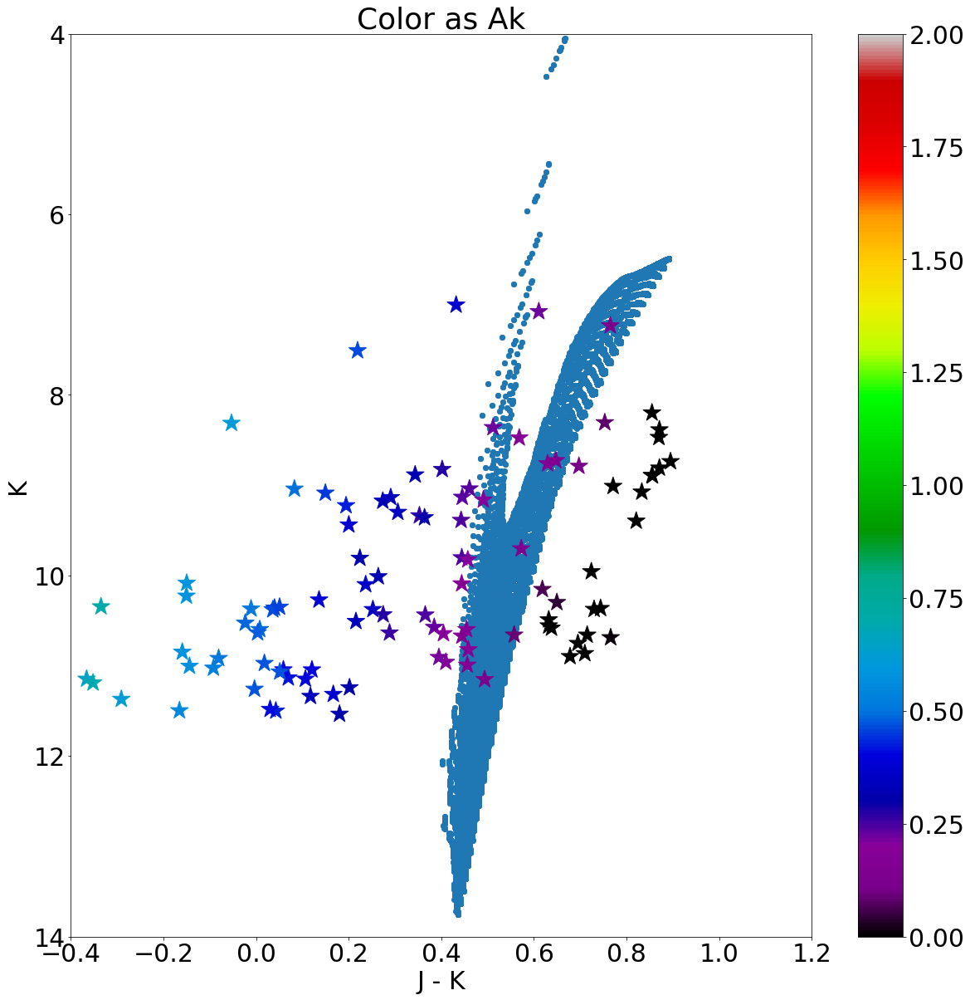

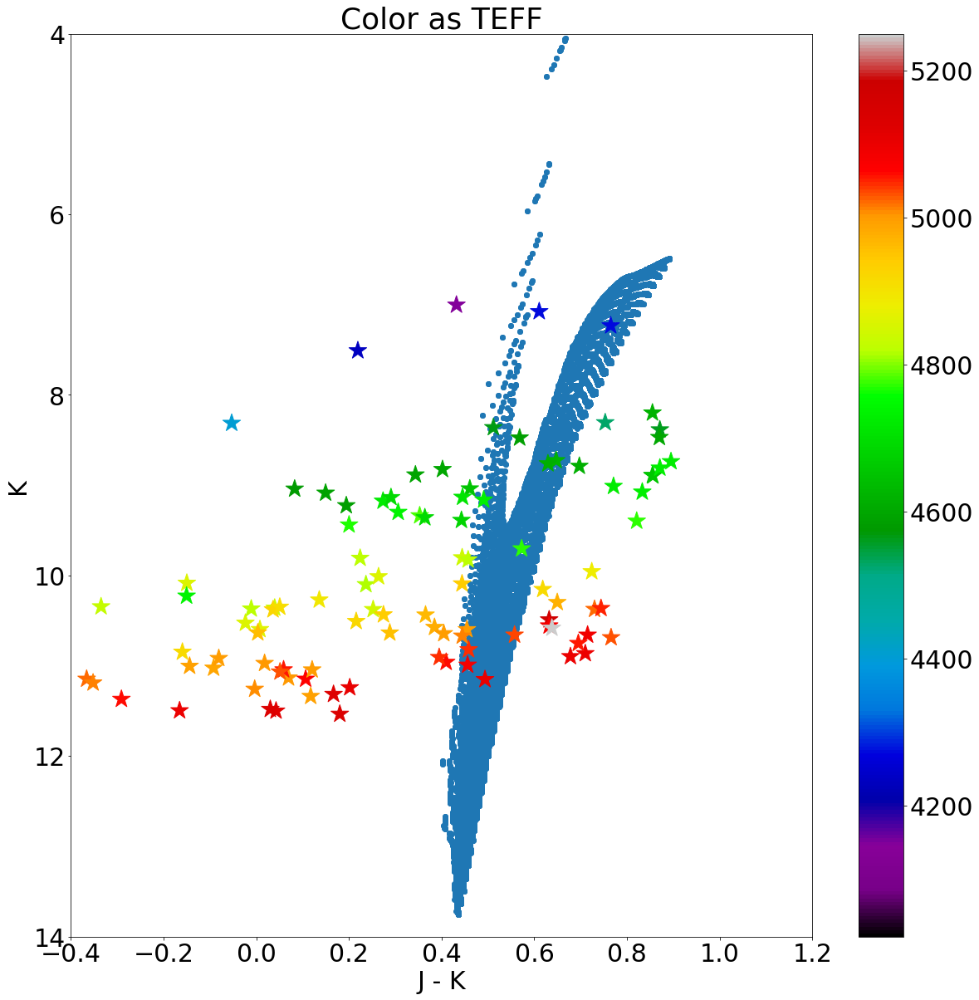

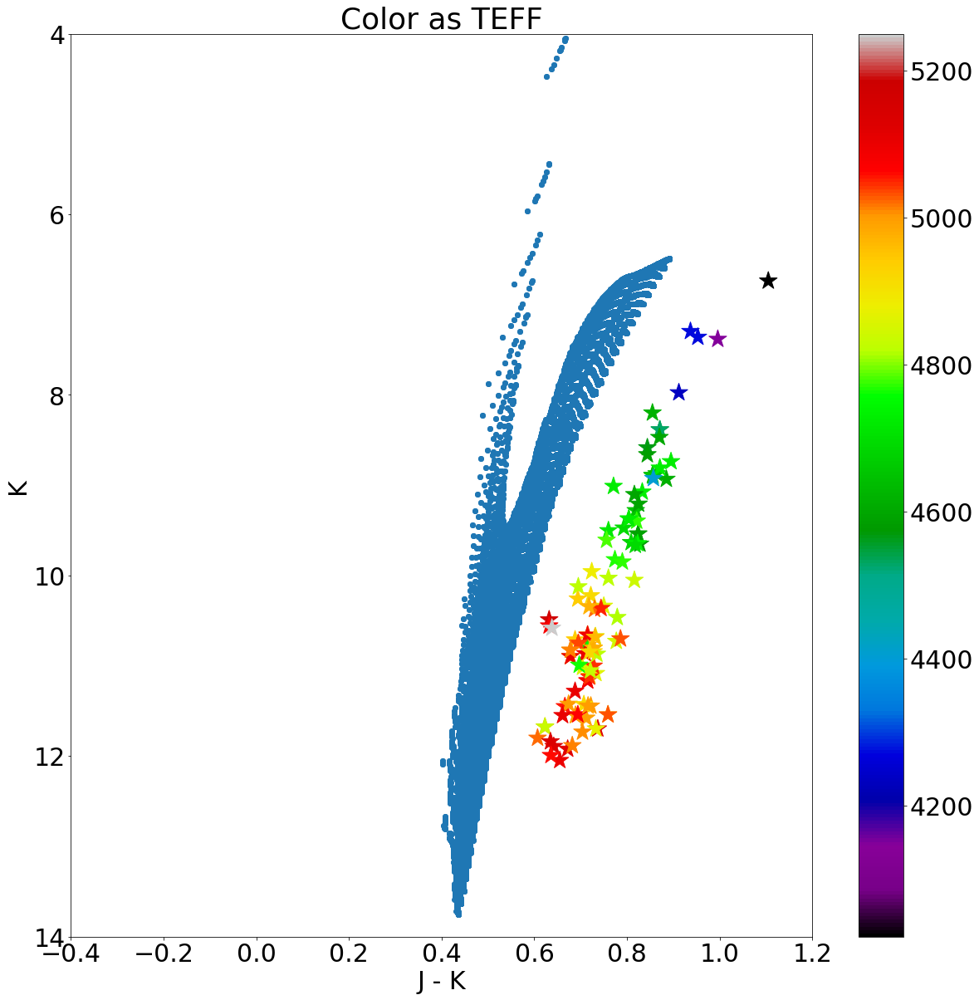

In [141]:
### Age
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks),gcs['K'][m22_idx]-m22bestaks,c=m22bestages,
            cmap='nipy_spectral',vmax=12.01,
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as Age')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

### Aks
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks),gcs['K'][m22_idx]-m22bestaks,c=m22bestaks,
            cmap='nipy_spectral',
            marker='*',s=500,vmax=2.0)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as Ak')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

### TEFF
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks),gcs['K'][m22_idx]-m22bestaks,c=gcs['TEFF'][m22_idx],
            cmap='nipy_spectral',
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as TEFF')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx],gcs['K'][m22_idx],c=gcs['TEFF'][m22_idx],
            cmap='nipy_spectral',
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as TEFF')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

In [142]:
print(gcs['AK_TARG'][m22_idx])

 AK_TARG  
----------
0.16064948
0.15514188
0.15514188
0.15147014
0.11934028
0.11934028
0.18176326
0.13586396
0.20746802
0.16156785
       ...
0.11475018
0.20104204
0.19094434
0.16156785
0.13219222
0.17533816
0.17533816
0.10465159
 0.2469422
0.13494647
 0.2423521
Length = 108 rows


0.16110867


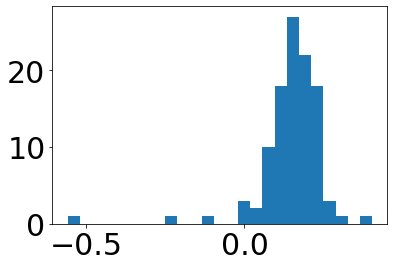

In [143]:
plt.hist(gcs[m22_idx]['AK_TARG'],bins=25)
print(np.median(gcs[m22_idx]['AK_TARG']))

In [144]:
# age-mag diagnostic few stars
# try redo fititng with rv 3.6
# include gaia bands

In [145]:
gcs_dist[m22_idx]

array([3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.,
       3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200., 3200.])

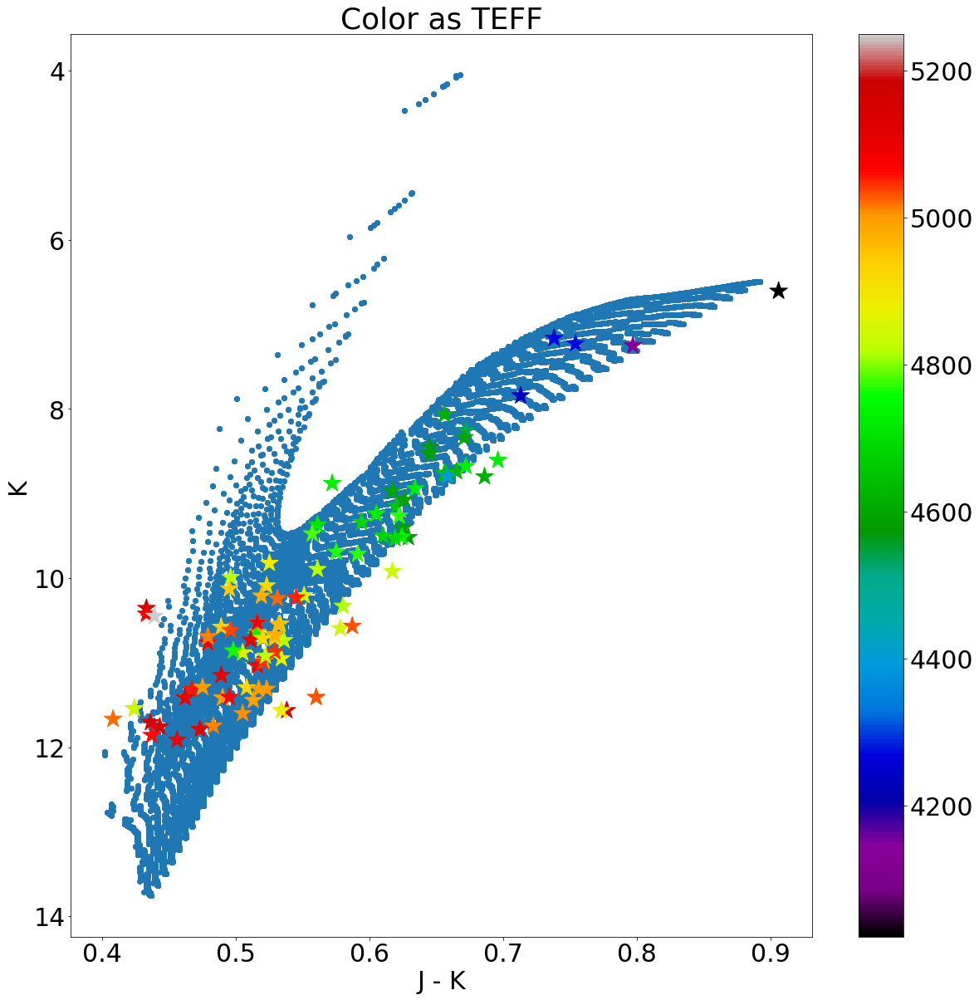

In [146]:
#E(J-K) = .28
#ak = .18

ak_test = 0.1325
ejk_test = 1.5*ak_test

plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_test,gcs['K'][m22_idx]-ak_test,c=gcs['TEFF'][m22_idx],
            cmap='nipy_spectral',
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as TEFF')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.show()

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 107.,   0.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <a list of 10 Patch objects>)

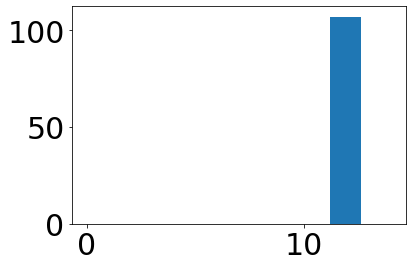

In [148]:
#misleading as forced to age of cluster
plt.hist(m22bestages,range=(0,14))

0.4341440994449493


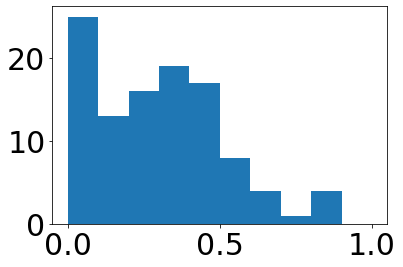

In [149]:
plt.hist(m22bestaks,range=(0,1))
print(np.median(m22bestaks)*ejk_ak)

In [150]:
#harris E(B-V) = 0.34

(0.34*(cardelli_alav(leff['J'],3.1)-cardelli_alav(leff['K'],3.1))/
 (cardelli_alav(0.445,3.1)-cardelli_alav(0.551,3.1)))

0.18928887563095959

In [151]:
ejk_ak

1.4901972382364816

In [152]:
(cardelli_alav(leff['J'],3.1)-cardelli_alav(leff['K'],3.1))/(cardelli_alav(0.445,3.1)-cardelli_alav(0.551,3.1))

0.556731987149881

In [153]:
0.4341440994449493/0.18928887563095959

2.2935531631101402

In [154]:
aj_ak = cardelli_alav(leff['J'],3.1)/cardelli_alav(leff['K'],3.1)
ah_ak = cardelli_alav(leff['H'],3.1)/cardelli_alav(leff['K'],3.1)

exts = np.array([aj_ak,ah_ak,1.0])*ak[np.where(chi==np.min(chi))]
exts

array([0.32719459, 0.2072558 , 0.13139304])

In [156]:
theo_mags = []
CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22star],gcs['ALPHA_M'][m22star],gcs_dist[m22star],3.1,massive)
for i in np.arange(0,15,0.25):
    theo_mags.append(CalcAge.Teff2AppMags(gcs['TEFF'][m22star],i,curve_ak))

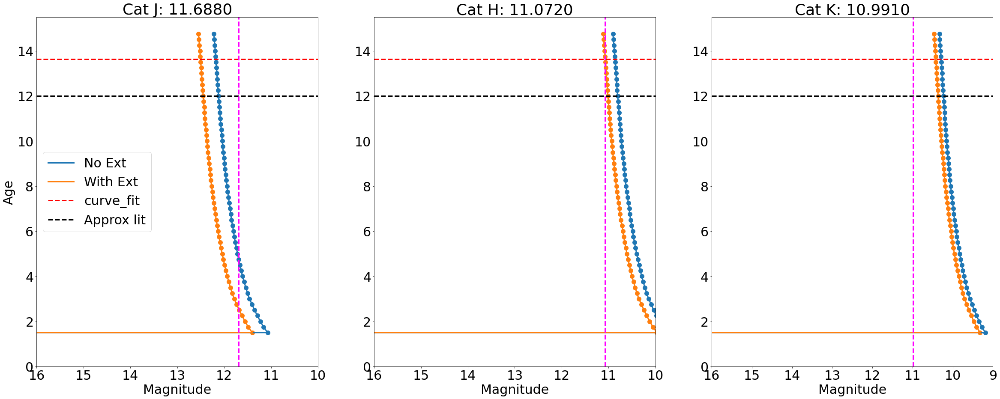

In [157]:
bands = ['J','H','K']
catalog_mags = [gcs[m22star]['J'][0],gcs[m22star]['H'][0],gcs[m22star]['K'][0]]
fig, ax = plt.subplots(1,3,figsize=[40,15])
for i in range(3):
    ax[i].scatter(np.asarray(theo_mags)[:,i],np.arange(0,15,0.25),s=100)
    ax[i].plot(np.asarray(theo_mags)[:,i],np.arange(0,15.,0.25),lw=3.0,label='No Ext')
    ax[i].scatter(np.asarray(theo_mags)[:,i]+exts[i],np.arange(0,15,0.25),s=100)
    ax[i].plot(np.asarray(theo_mags)[:,i]+exts[i],np.arange(0,15,0.25),lw=3.0,label='With Ext')
    ax[i].set_ylim(bottom=0)
    ax[i].axhline(curve_age,c='r',ls='--',label='curve_fit',lw=3.0)
    ax[i].axhline(12,c='k',ls='--',label='Approx lit',lw=3.0)
    ax[i].set_xlabel('Magnitude')
    ax[i].set_title(r'Cat {}: {:.4f}'.format(bands[i],catalog_mags[i]))

ax[0].axvline(catalog_mags[0],ls='--',c='magenta',lw=3.0)
ax[1].axvline(catalog_mags[1],ls='--',c='magenta',lw=3.0)
ax[2].axvline(catalog_mags[2],ls='--',c='magenta',lw=3.0)

# ax[0].set_xlim(12.5,10.)
# ax[1].set_xlim(12,9.0)
# ax[2].set_xlim(12,8.25)

ax[0].set_xlim(16,10)
ax[1].set_xlim(16,10)
ax[2].set_xlim(16,9)

ax[0].legend()

ax[0].set_ylabel('Age')
plt.show()

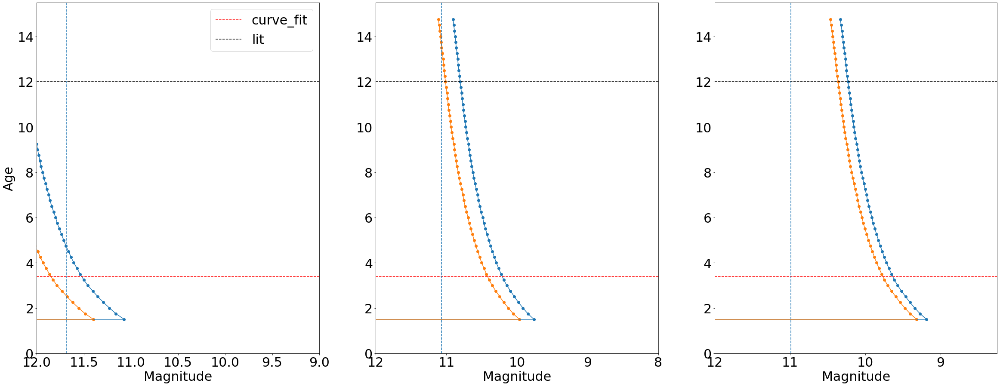

In [159]:
fig, ax = plt.subplots(1,3,figsize=[40,15])
for i in range(3):
    ax[i].scatter(np.asarray(theo_mags)[:,i],np.arange(0,15,0.25))
    ax[i].plot(np.asarray(theo_mags)[:,i],np.arange(0,15,0.25))
    ax[i].scatter(np.asarray(theo_mags)[:,i]+exts[i],np.arange(0,15,0.25))
    ax[i].plot(np.asarray(theo_mags)[:,i]+exts[i],np.arange(0,15,0.25))
    ax[i].set_ylim(bottom=0)
    ax[i].axhline(age[np.where(chi==np.min(chi))],c='r',ls='--',label='curve_fit')
    ax[i].axhline(12,c='k',ls='--',label='lit')
    ax[i].set_xlabel('Magnitude')

ax[0].axvline(gcs[idx]['J'][0],ls='--',c='tab:blue')
ax[1].axvline(gcs[idx]['H'][0],ls='--',c='tab:blue')
ax[2].axvline(gcs[idx]['K'][0],ls='--',c='tab:blue')

ax[0].set_xlim(12,9.0)
ax[1].set_xlim(12,8.0)
ax[2].set_xlim(12,8.25)

ax[0].legend()

ax[0].set_ylabel('Age')
plt.show()

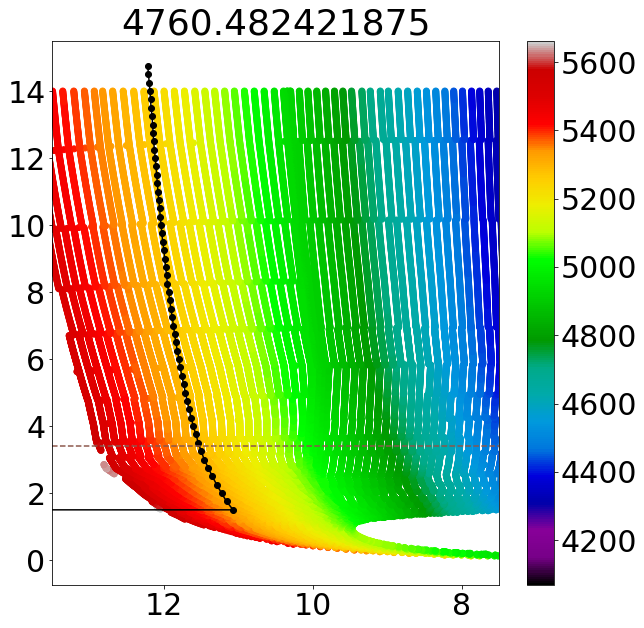

In [161]:
plt.figure(figsize=[10,10])
plt.scatter(massive['Ksmag'][isopick]+5.0*np.log10(gcs_dist[m22star])-5.0,10**massive['logAge'][isopick]/10**9,
            c=10**massive['logTe'][isopick],cmap="nipy_spectral")
plt.colorbar()
plt.plot(np.asarray(theo_mags)[:,0],np.arange(0,15,0.25),'o-',c='black')
plt.gca().invert_xaxis()
plt.xlim(13.5,7.5)
plt.axhline(age[np.where(chi==np.min(chi))],c='tab:brown',ls='--',label='curve_fit')
plt.title(r'{}'.format(gcs[idx]['TEFF'][0]));

In [162]:
curvefitage = age[np.where(chi==np.min(chi))][0]
curvefitiso, = np.where((massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][m22star])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][m22star]))+0.362)))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(curvefitage*10**9))))

twgyr, = np.where((massive['MH']==closest(massive['MH'],np.nanmedian(gcs['M_H'][m22star])+
                                              np.log10(0.638*(10**np.nanmedian(gcs['ALPHA_M'][m22star]))+0.362)))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(12*10**9))))

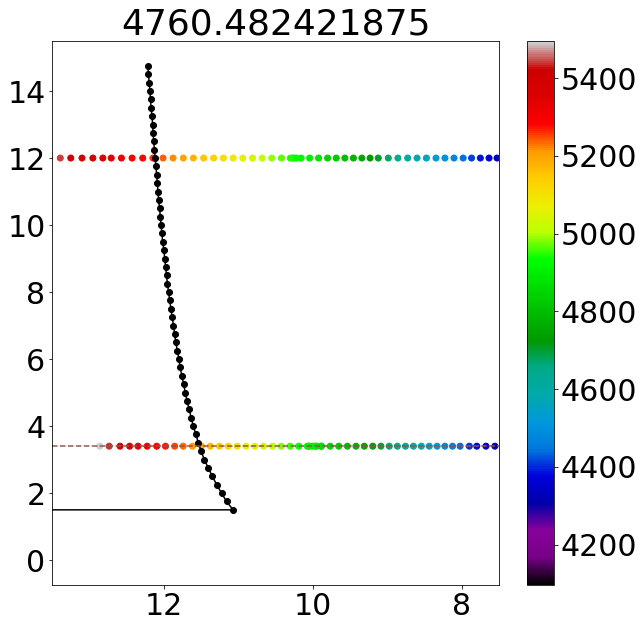

In [164]:
plt.figure(figsize=[10,10])

plt.scatter(massive['Ksmag'][curvefitiso]+5.0*np.log10(gcs_dist[m22star])-5.0,
            10**massive['logAge'][curvefitiso]/10**9,
            c=10**massive['logTe'][curvefitiso],cmap="nipy_spectral")

plt.scatter(massive['Ksmag'][twgyr]+5.0*np.log10(gcs_dist[m22star])-5.0,
            10**massive['logAge'][twgyr]/10**9,
            c=10**massive['logTe'][twgyr],cmap="nipy_spectral")

plt.colorbar()
plt.plot(np.asarray(theo_mags)[:,0],np.arange(0,15,0.25),'o-',c='black')
plt.gca().invert_xaxis()
plt.xlim(13.5,7.5)
plt.axhline(age[np.where(chi==np.min(chi))],c='tab:brown',ls='--',label='curve_fit')
plt.title(r'{}'.format(gcs[idx]['TEFF'][0]));

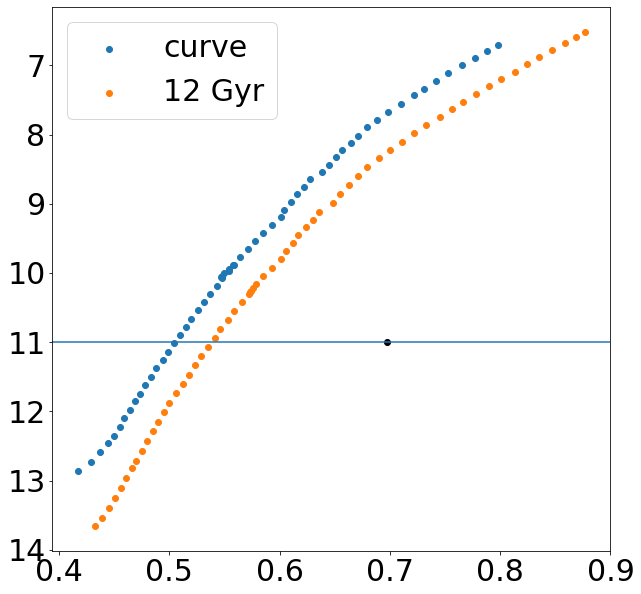

In [165]:
plt.figure(figsize=[10,10])
plt.scatter((massive['Jmag']-massive['Ksmag'])[curvefitiso],
            massive[curvefitiso]['Ksmag']+5.0*np.log10(gcs_dist[m22star])-5.0,label='curve')
plt.scatter((massive['Jmag']-massive['Ksmag'])[twgyr],
            massive[twgyr]['Ksmag']+5.0*np.log10(gcs_dist[m22star])-5.0,label='12 Gyr')
plt.legend()
plt.scatter((gcs['J']-gcs['K'])[m22star],gcs['K'][m22star],c='k')
plt.axhline(gcs['K'][m22star])
plt.gca().invert_yaxis()

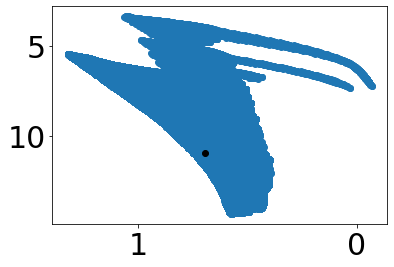

In [166]:
plt.scatter(massive['Jmag']-massive['Ksmag'],massive['Ksmag']+5.0*np.log10(gcs_dist[m22star])-5.0,label='curve')
plt.scatter((gcs['J']-gcs['K'])[m22star],gcs['K'][m22star],c='k')
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()

# Multiple Bad Stars Age-Mag Plot

In [168]:
# plt.hist(badcolors,range=(-0.4,1.0))
# plt.show()

# plt.hist(badmags,range=(6,14))
# plt.show()

In [169]:
def euclid2d(arr,pt):
    ptx,pty=pt
    arrx,arry=arr
    arrx = arrx.data
    arry = arry.data
    euc = np.subtract(arrx,ptx)**2+np.subtract(arry,pty)**2
    return euc

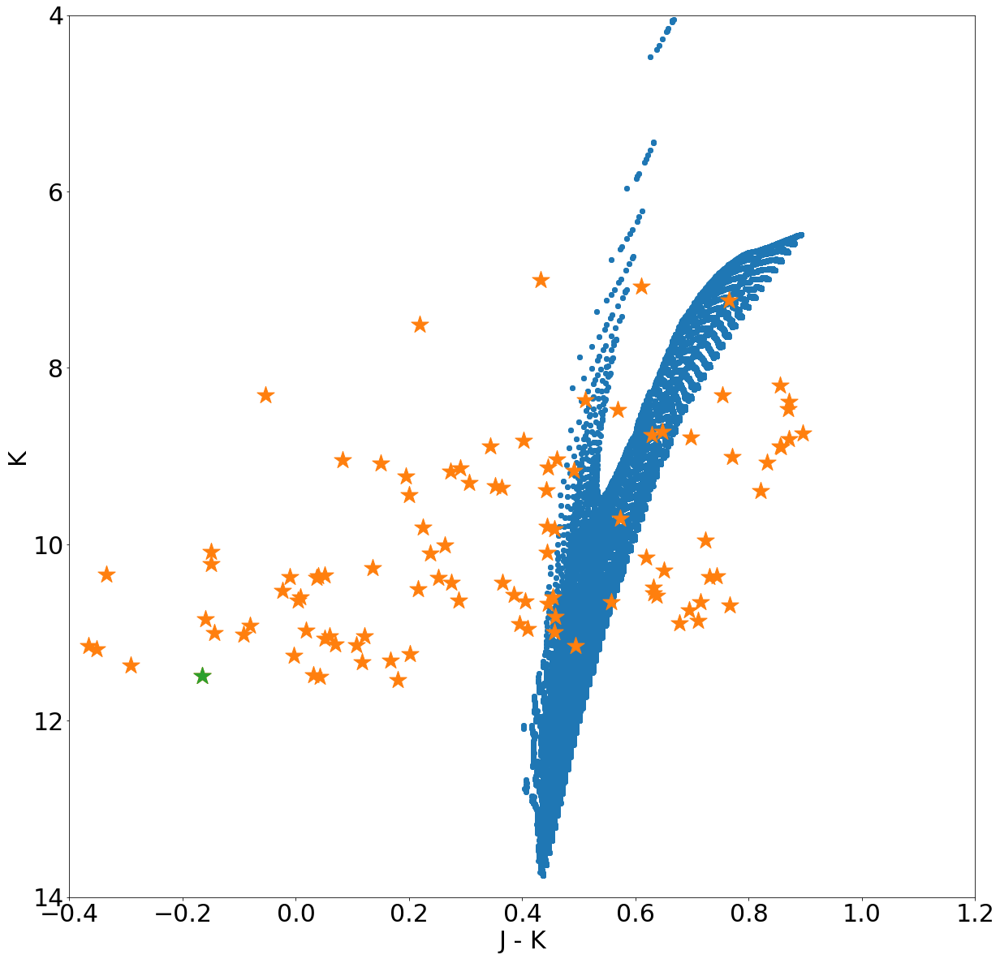

In [171]:
badcolors = (gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks)
badmags = gcs['K'][m22_idx]-m22bestaks

bad1 = euclid2d([badcolors,badmags],[-0.1,8.0]).argmin()
bad2 = euclid2d([badcolors,badmags],[0.2,9.0]).argmin()
bad3 = euclid2d([badcolors,badmags],[-0.3,12.0]).argmin()
bad4 = euclid2d([badcolors,badmags],[0.3,7.0]).argmin()
bad5 = euclid2d([badcolors,badmags],[0.8,10.0]).argmin()

plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks),gcs['K'][m22_idx]-m22bestaks,marker='*',s=500)
# plt.scatter(((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks))[bad1],(gcs['K'][m22_idx]-m22bestaks)[bad1],
#             marker='*',s=500,c='tab:green')
# plt.scatter(((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks))[bad2],(gcs['K'][m22_idx]-m22bestaks)[bad2],
#             marker='*',s=500,c='tab:green')
plt.scatter(((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks))[bad3],(gcs['K'][m22_idx]-m22bestaks)[bad3],
            marker='*',s=500,c='tab:green')
# plt.scatter(((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks))[bad4],(gcs['K'][m22_idx]-m22bestaks)[bad4],
#             marker='*',s=500,c='tab:green')
# plt.scatter(((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks))[bad5],(gcs['K'][m22_idx]-m22bestaks)[bad5],
#             marker='*',s=500,c='tab:green')
plt.gca().invert_yaxis()
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

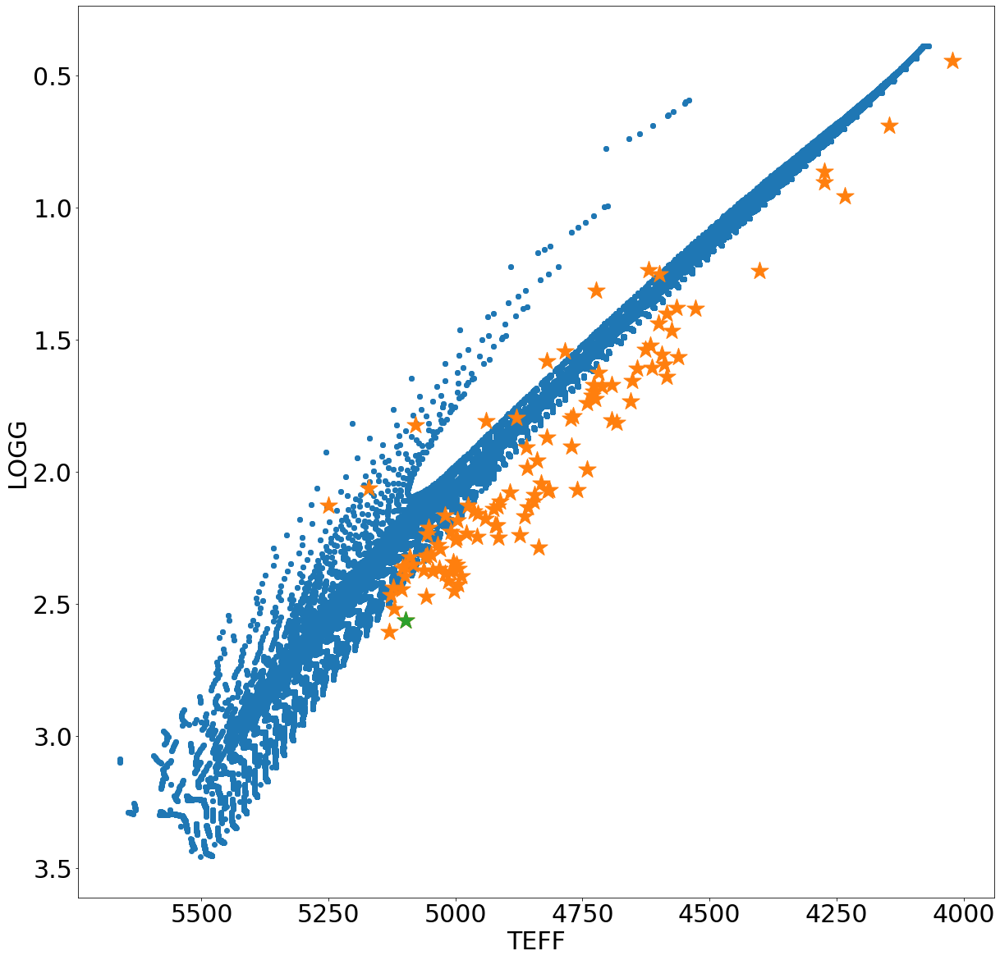

In [172]:
plt.figure(figsize=[20,20])
plt.scatter(10**massive['logTe'][m22iso],massive['logg'][m22iso])
plt.scatter(gcs['TEFF'][m22_idx],gcs['LOGG'][m22_idx],marker='*',s=500)
plt.scatter(gcs['TEFF'][m22_idx][bad3],gcs['LOGG'][m22_idx][bad3],marker='*',s=500,c='tab:green')
plt.gca().invert_yaxis()
plt.ylabel(r'LOGG')
plt.xlabel(r'TEFF')
plt.gca().invert_xaxis()
plt.show()

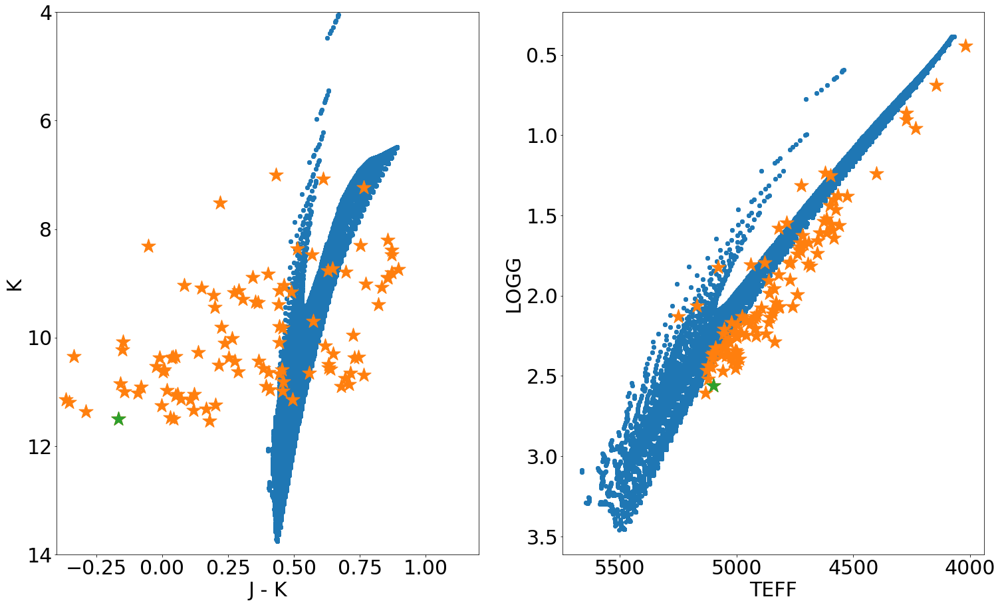

In [173]:
fig, ax = plt.subplots(1,2,figsize=[25,15])
### CMD
ax[0].scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
ax[0].scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks),gcs['K'][m22_idx]-m22bestaks,marker='*',s=500)
ax[0].scatter(((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks))[bad3],(gcs['K'][m22_idx]-m22bestaks)[bad3],
            marker='*',s=500,c='tab:green')
ax[0].invert_yaxis()
ax[0].set_ylabel(r'K')
ax[0].set_xlabel(r'J - K')
ax[0].set_ylim(14,4)
ax[0].set_xlim(-0.4,1.2)

### sHR
ax[1].scatter(10**massive['logTe'][m22iso],massive['logg'][m22iso])
ax[1].scatter(gcs['TEFF'][m22_idx],gcs['LOGG'][m22_idx],marker='*',s=500)
ax[1].scatter(gcs['TEFF'][m22_idx][bad3],gcs['LOGG'][m22_idx][bad3],marker='*',s=500,c='tab:green')
ax[1].invert_yaxis()
ax[1].set_ylabel(r'LOGG')
ax[1].set_xlabel(r'TEFF')
ax[1].invert_xaxis()

plt.show()

In [174]:
bads = np.array([bad1,bad2,bad3,bad4,bad5])
gcs_bad_idx = np.array([m22_idx[bad1],m22_idx[bad2],m22_idx[bad3],m22_idx[bad4],m22_idx[bad5]])
gcs_bad_idx

array([1839, 1750, 1776, 1808, 1785])

In [176]:
print(len(gcs_bad_idx))
print(len(np.arange(0,15,0.25)))

5
60


In [178]:
m22badtheos = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(gcs_bad_idx),3))
m22badtheos0 = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(gcs_bad_idx),3))

for i in tqdm_notebook(range(len(gcs_bad_idx))):
    CalcAge = WhatsMyAgeAgain(gcs['M_H'][gcs_bad_idx[i]],gcs['ALPHA_M'][gcs_bad_idx[i]],gcs_dist[gcs_bad_idx[i]],
                              3.1,massive)

    for j in range(len(np.arange(0,15,0.25))):
        theo = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],m22bestaks[bads[i]])
        theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],0)
        m22badtheos[j,i,0] = theo[0]
        m22badtheos[j,i,1] = theo[1]
        m22badtheos[j,i,2] = theo[2]
        m22badtheos0[j,i,0] = theo0[0]
        m22badtheos0[j,i,1] = theo0[1]
        m22badtheos0[j,i,2] = theo0[2]

In [180]:
# m22badtheos[:,0,:]

In [182]:
# m22bestages

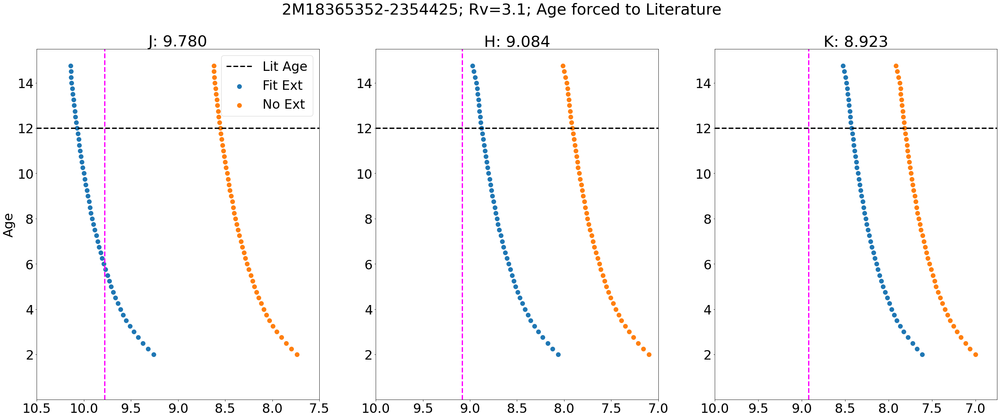

In [183]:
bands = ['J','H','K']
fig, ax = plt.subplots(1,3,figsize=[40,15])
for i in range(3):
    ax[i].scatter(m22badtheos[:,0,i],np.arange(0,15,0.25),s=100,label='Fit Ext')
    ax[i].scatter(m22badtheos0[:,0,i],np.arange(0,15,0.25),s=100,label='No Ext')
    ax[i].set_ylim(bottom=0.01)
    ax[i].axhline(12.0,c='k',ls='--',label='Lit Age',lw=3.0)

ax[0].axvline(gcs[gcs_bad_idx[0]]['J'],ls='--',c='magenta',lw=3.0)
ax[1].axvline(gcs[gcs_bad_idx[0]]['H'],ls='--',c='magenta',lw=3.0)
ax[2].axvline(gcs[gcs_bad_idx[0]]['K'],ls='--',c='magenta',lw=3.0)

ax[0].set_title(r'J: {:.3f}'.format(gcs[gcs_bad_idx[0]]['J']))
ax[1].set_title(r'H: {:.3f}'.format(gcs[gcs_bad_idx[0]]['H']))
ax[2].set_title(r'K: {:.3f}'.format(gcs[gcs_bad_idx[0]]['K']))

ax[0].set_xlim(10.5,7.5)
ax[1].set_xlim(10.,7.)
ax[2].set_xlim(10.,6.75)

ax[0].legend()

ax[0].set_ylabel('Age')
plt.suptitle(r'{}; Rv=3.1; Age forced to Literature'.format(gcs[gcs_bad_idx[0]]['APOGEE_ID']))

plt.show()

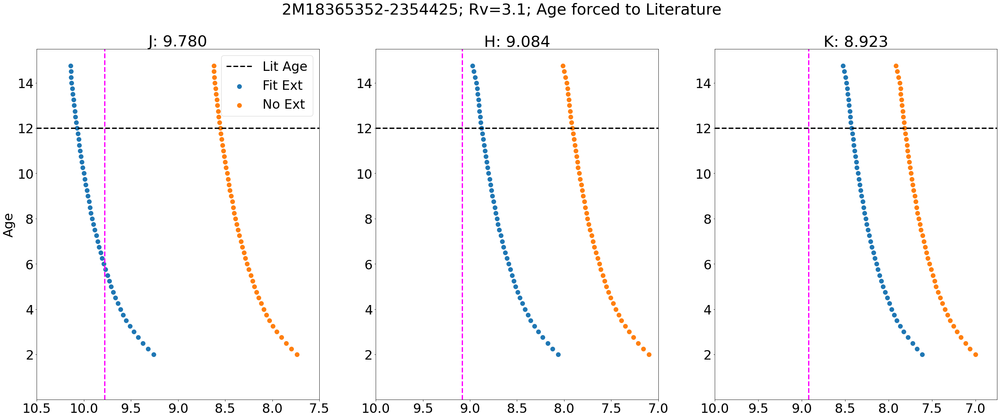

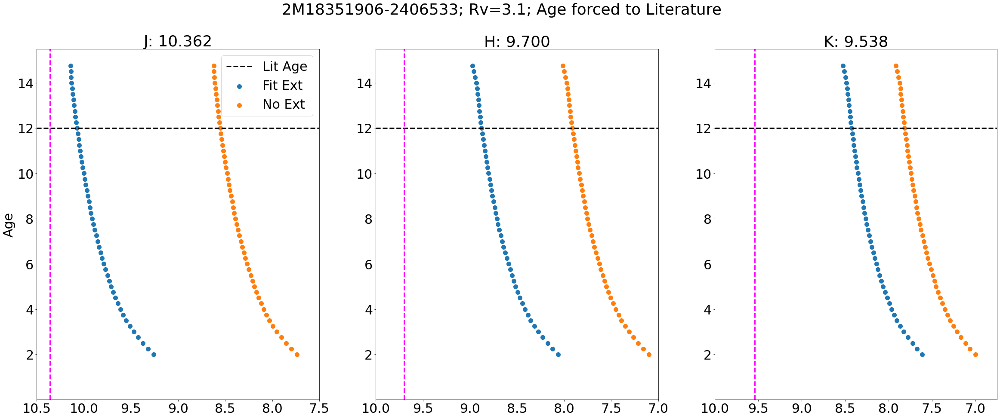

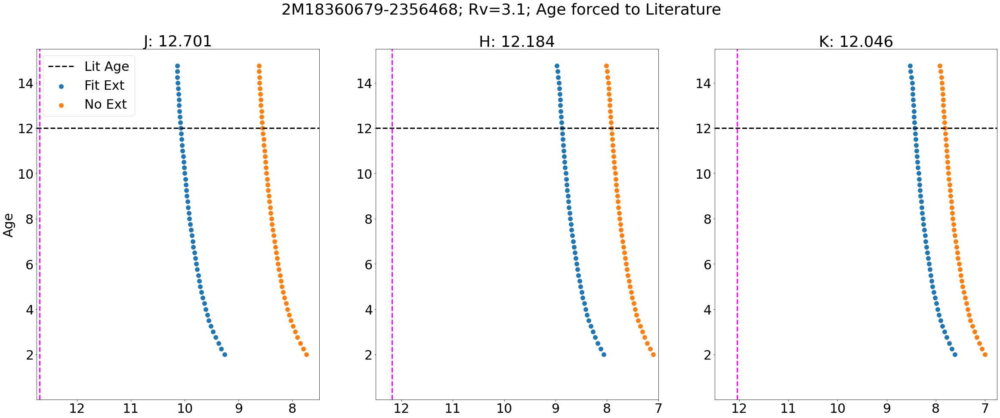

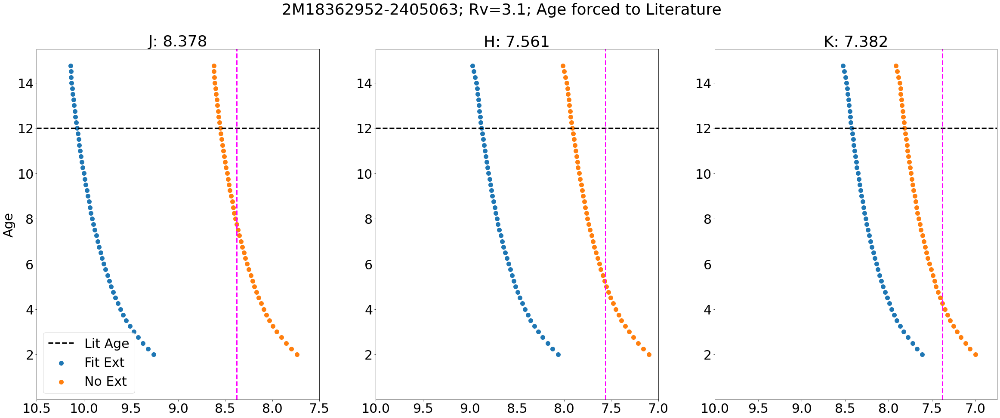

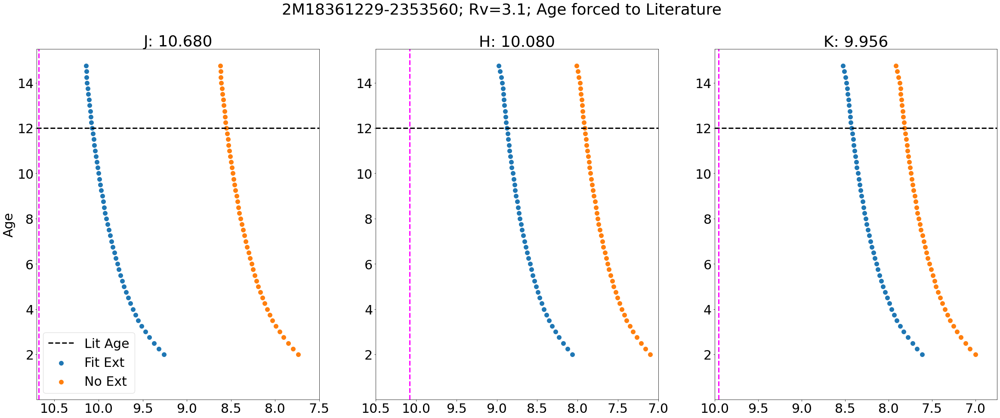

In [184]:
bands = ['J','H','K']
for j in range(len(gcs_bad_idx)):
    fig, ax = plt.subplots(1,3,figsize=[40,15])
    for i in range(3):
        ax[i].scatter(m22badtheos[:,0,i],np.arange(0,15,0.25),s=100,label='Fit Ext')
        ax[i].scatter(m22badtheos0[:,0,i],np.arange(0,15,0.25),s=100,label='No Ext')
        ax[i].set_ylim(bottom=0.01)
        ax[i].axhline(12.0,c='k',ls='--',label='Lit Age',lw=3.0)

    ax[0].axvline(gcs[gcs_bad_idx[j]]['J'],ls='--',c='magenta',lw=3.0)
    ax[1].axvline(gcs[gcs_bad_idx[j]]['H'],ls='--',c='magenta',lw=3.0)
    ax[2].axvline(gcs[gcs_bad_idx[j]]['K'],ls='--',c='magenta',lw=3.0)

    ax[0].set_title(r'J: {:.3f}'.format(gcs[gcs_bad_idx[j]]['J']))
    ax[1].set_title(r'H: {:.3f}'.format(gcs[gcs_bad_idx[j]]['H']))
    ax[2].set_title(r'K: {:.3f}'.format(gcs[gcs_bad_idx[j]]['K']))

    ax[0].set_xlim(10.5,7.5)
    ax[1].set_xlim(10.,7.)
    ax[2].set_xlim(10.,6.75)
    
    if j == 2:
        ax[0].set_xlim(12.75,7.5)
        ax[1].set_xlim(12.5,7.)
        ax[2].set_xlim(12.5,6.75)
        
    if j == 4:
        ax[0].set_xlim(10.7,7.5)
        ax[1].set_xlim(10.5,7.)
        ax[2].set_xlim(10.,6.75)

    ax[0].legend()

    ax[0].set_ylabel('Age')
    plt.suptitle(r'{}; Rv=3.1; Age forced to Literature'.format(gcs[gcs_bad_idx[j]]['APOGEE_ID']))

    plt.show()

# Rv = 3.6

In [185]:
ages0 = np.arange(0,15,1.0)
aks0 = np.array([0,0.5,1.0])

m22curve_chis36 = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22curve_ages36 = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
m22curve_aks36 = 999999.0*np.ones((len(ages0),len(aks0),len(m22_idx)))
for k in tqdm_notebook(range(len(m22_idx))):
        CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx[k]],gcs['ALPHA_M'][m22_idx[k]],gcs_dist[m22_idx[k]],
                                  3.1,massive)
        for i in range(len(ages0)):
            for j in range(len(aks0)):
                try:
                    popt,_ = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx[k]],
                                  np.array([[gcs['J'][m22_idx[k]],gcs['H'][m22_idx[k]],gcs['K'][m22_idx[k]]]],
                                       dtype=float).T.ravel(),
                                  p0=[ages0[i],aks0[j]],bounds=((12.,0.),(12.01,2.)),method='trf',
                                  sigma=np.array([[gcs['J_ERR'][m22_idx[k]],gcs['H_ERR'][m22_idx[k]],
                                                   gcs['K_ERR'][m22_idx[k]]]],dtype=float).T.ravel(),maxfev=5000)
        
                    m22curve_ages36[i,j,k] = popt[0]
                    m22curve_aks36[i,j,k] = popt[1]
      
                    calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx[k]],popt[0],popt[1]))
                    mag_errs = np.array([gcs['J_ERR'][m22_idx[k]],gcs['H_ERR'][m22_idx[k]],
                                         gcs['K_ERR'][m22_idx[k]]])
                    mags = np.array([gcs['J'][m22_idx[k]],gcs['H'][m22_idx[k]],gcs['K'][m22_idx[k]]])
                    m22curve_chis36[i,j,k] = sum((calc_mags-mags)**2/mag_errs**2)
                    
                except:
                    m22curve_ages36[i,j,k]=999999.0
                    m22curve_aks36[i,j,k]=999999.0
                    m22curve_chis36[i,j,k]=999999.0

In [186]:
m22bestaks36 = 999999.0*np.ones(len(m22_idx))
m22bestchis36 = 999999.0*np.ones(len(m22_idx))
m22bestages36 = 999999.0*np.ones(len(m22_idx))
for i in range(len(m22_idx)):
    m22bestidx = np.where(m22curve_chis36[:,:,i]==np.min(m22curve_chis36[:,:,i]))
    m22bestchis36[i] = np.median(m22curve_chis36[:,:,i][m22bestidx])
    m22bestaks36[i] = np.median(m22curve_aks36[:,:,i][m22bestidx])
    m22bestages36[i] = np.median(m22curve_ages36[:,:,i][m22bestidx])

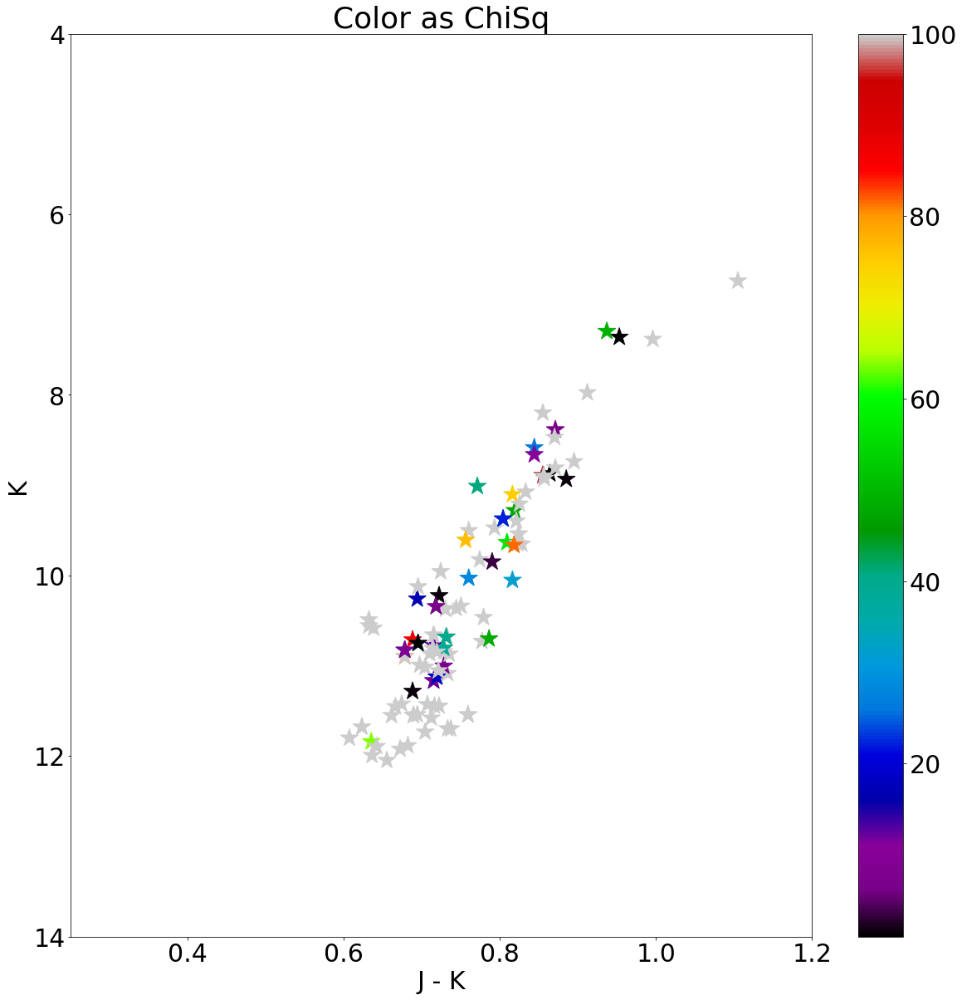

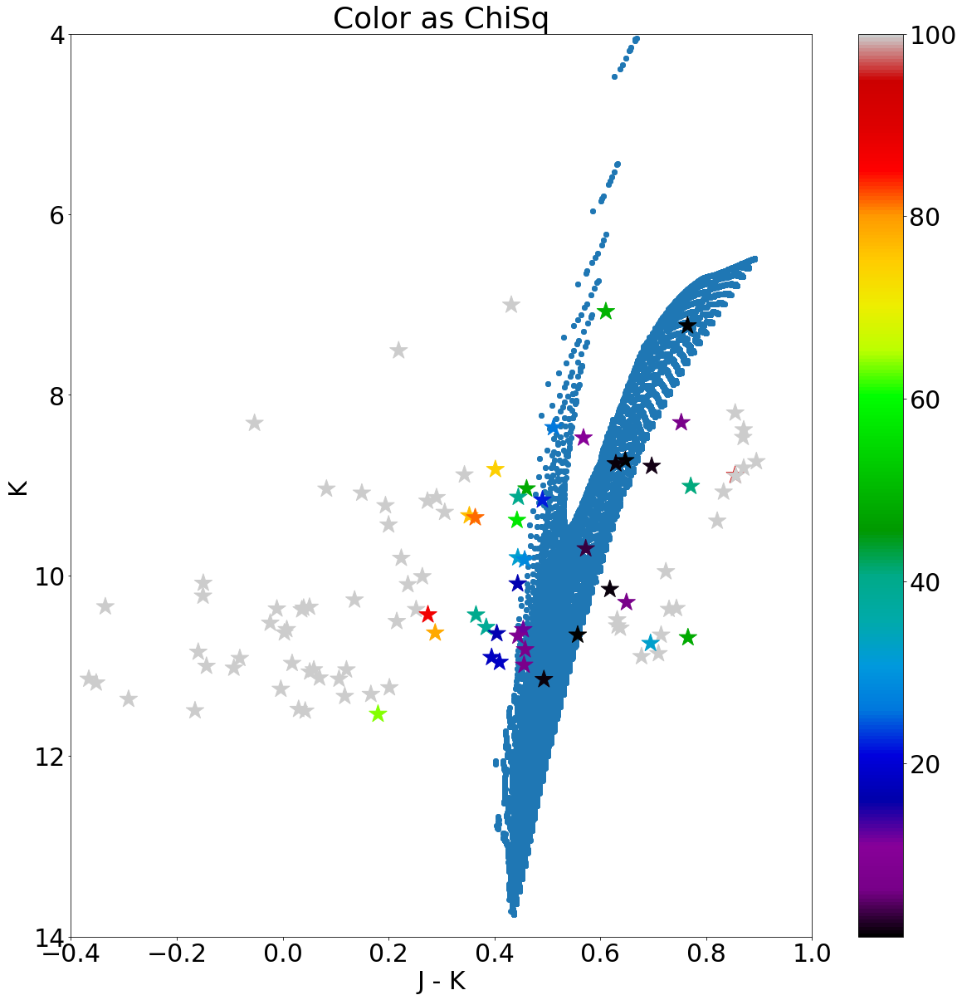

In [187]:
### Without Isochrones
plt.figure(figsize=[20,20])
plt.scatter((gcs['J']-gcs['K'])[m22_idx],gcs['K'][m22_idx],c=m22bestchis36,cmap='nipy_spectral',vmax=100,marker='*',
            s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as ChiSq')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(0.25,1.2)
plt.show()

### With Isochrones
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks36),gcs['K'][m22_idx]-m22bestaks36,c=m22bestchis36,
            cmap='nipy_spectral',vmax=100,
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as ChiSq')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.0)
plt.show()

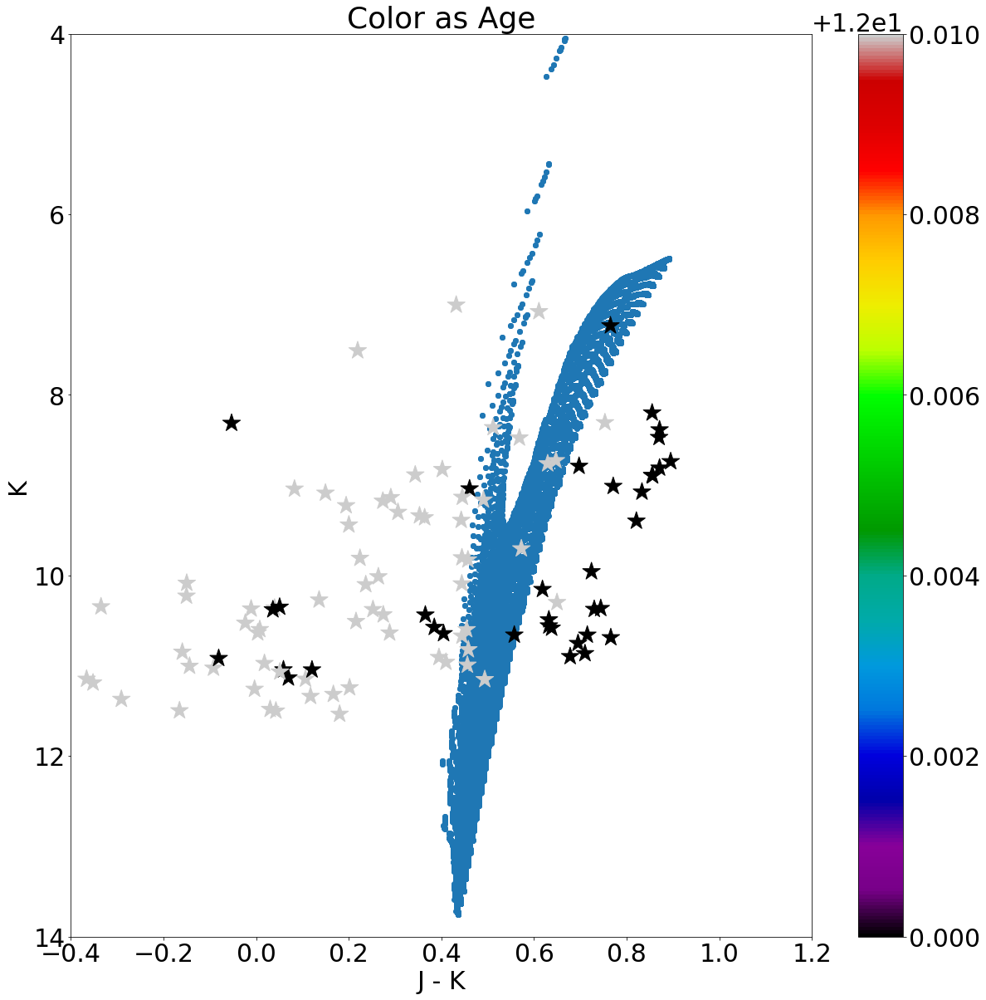

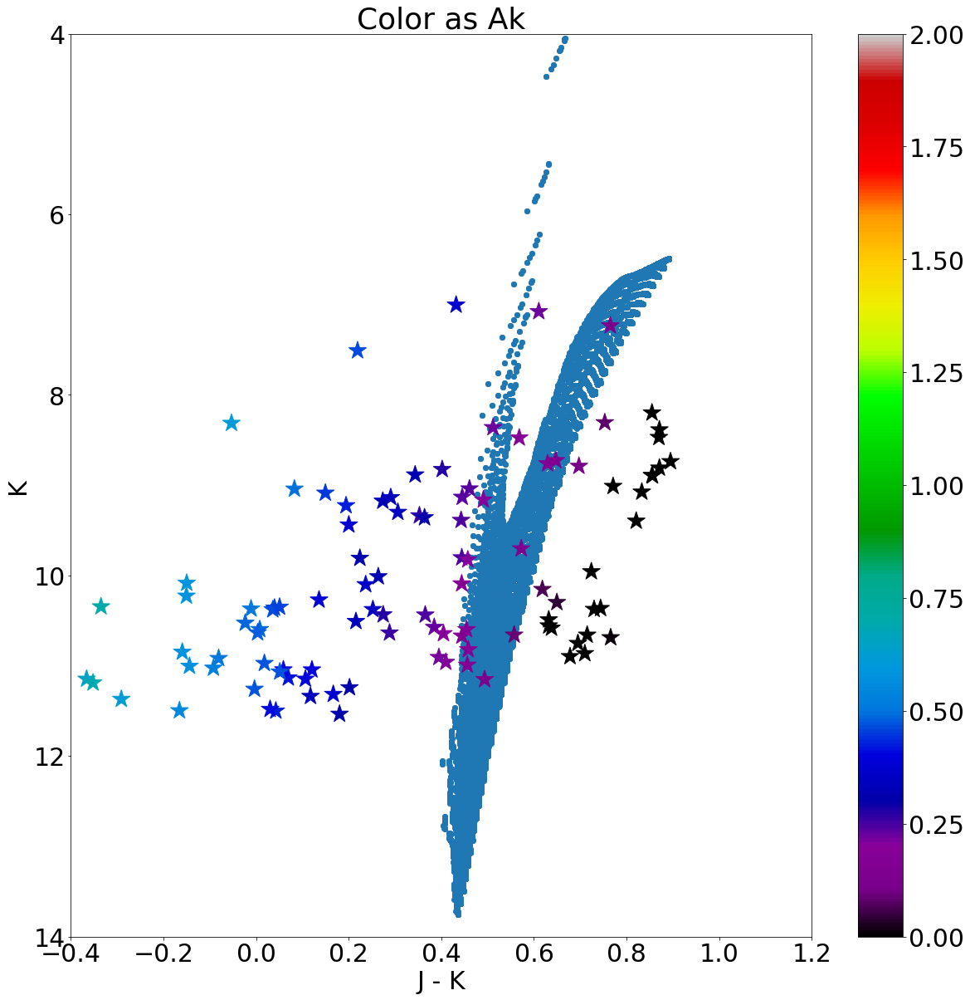

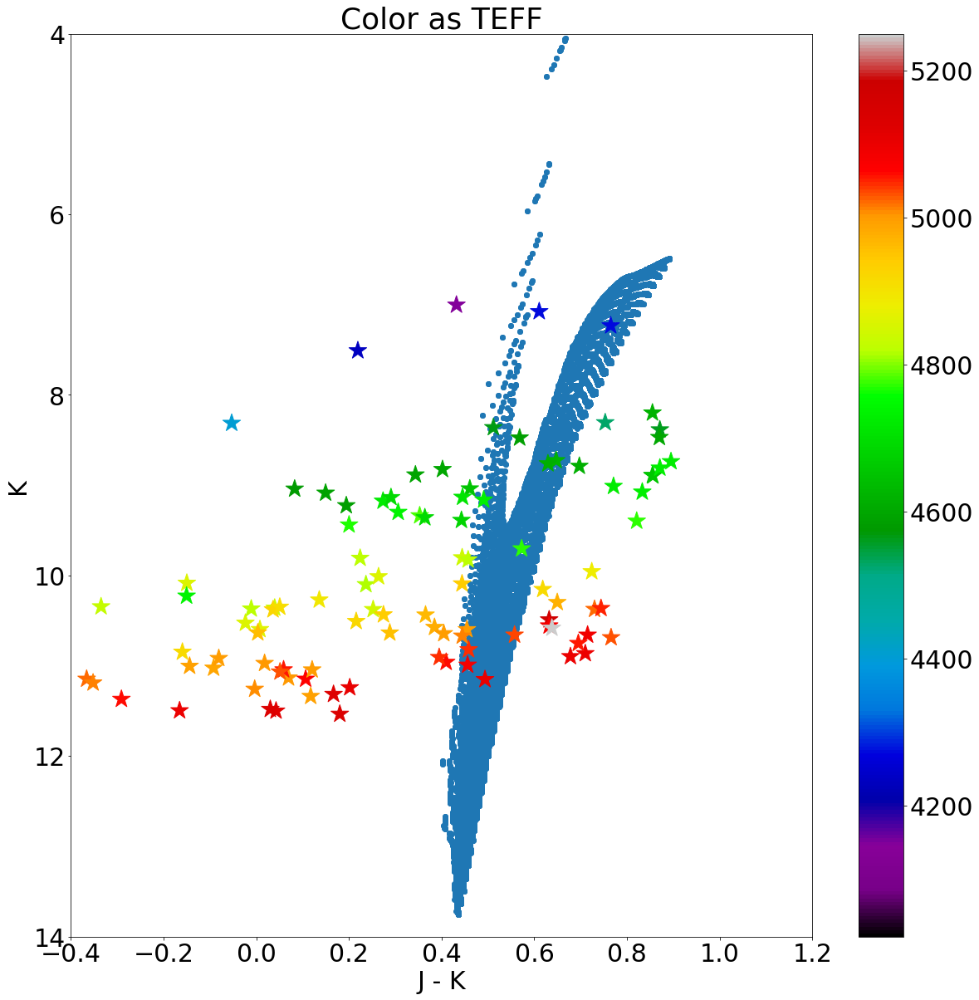

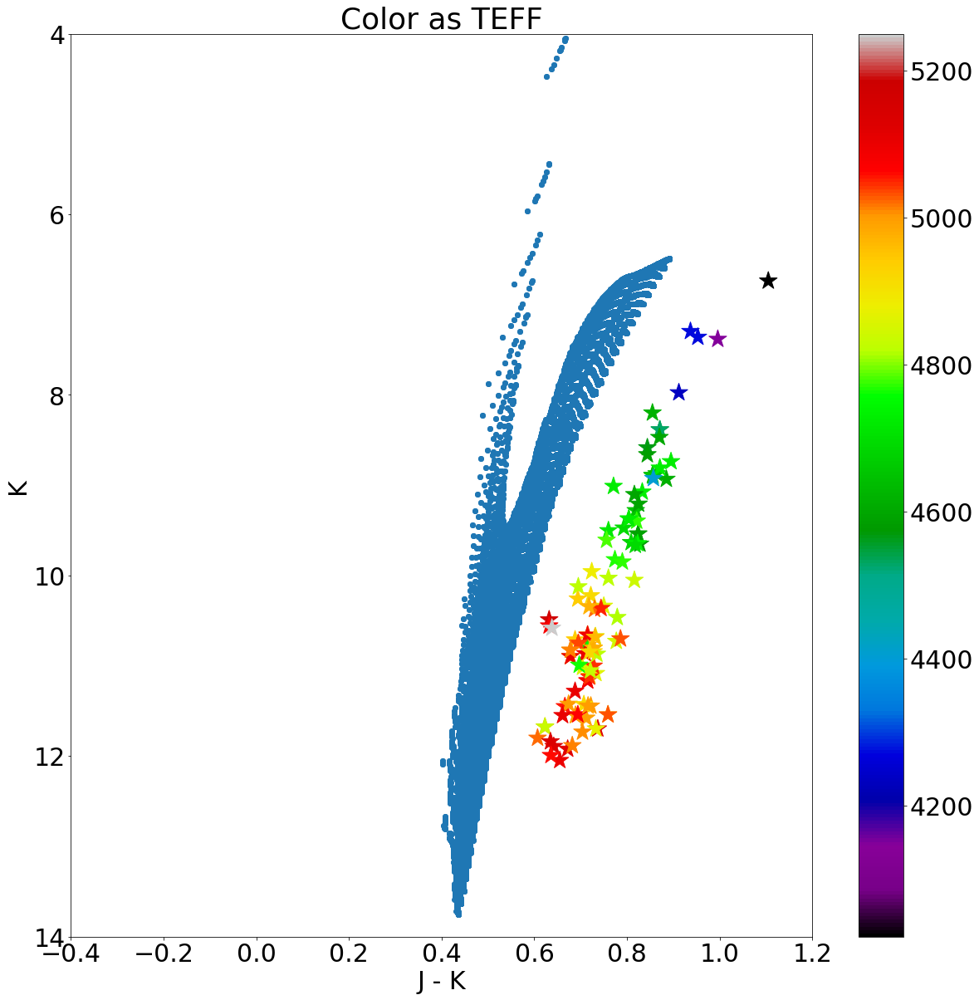

In [188]:
### Age
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks36),gcs['K'][m22_idx]-m22bestaks36,c=m22bestages,
            cmap='nipy_spectral',vmax=12.01,
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as Age')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

### Aks
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks36),gcs['K'][m22_idx]-m22bestaks36,c=m22bestaks36,
            cmap='nipy_spectral',
            marker='*',s=500,vmax=2.0)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as Ak')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

### TEFF
plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx]-ejk_ak*np.asarray(m22bestaks36),gcs['K'][m22_idx]-m22bestaks36,c=gcs['TEFF'][m22_idx],
            cmap='nipy_spectral',
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as TEFF')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

plt.figure(figsize=[20,20])
plt.scatter((massive['Jmag']-massive['Ksmag'])[m22iso],
            massive['Ksmag'][m22iso]+5*np.log10(gcs_dist[m22_idx][0])-5.0)
plt.scatter((gcs['J']-gcs['K'])[m22_idx],gcs['K'][m22_idx],c=gcs['TEFF'][m22_idx],
            cmap='nipy_spectral',
            marker='*',s=500)
plt.colorbar()
plt.gca().invert_yaxis()
plt.title(r'Color as TEFF')
plt.ylabel(r'K')
plt.xlabel(r'J - K')
plt.ylim(14,4)
plt.xlim(-0.4,1.2)
plt.show()

In [190]:
m22badtheos36 = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(gcs_bad_idx),3))
m22badtheos360 = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(gcs_bad_idx),3))

for i in tqdm_notebook(range(len(gcs_bad_idx))):
    CalcAge = WhatsMyAgeAgain(gcs['M_H'][gcs_bad_idx[i]],gcs['ALPHA_M'][gcs_bad_idx[i]],gcs_dist[gcs_bad_idx[i]],
                              3.1,massive)

    for j in range(len(np.arange(0,15,0.25))):
        theo = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],m22bestaks36[bads[i]])
        theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],0)
        m22badtheos36[j,i,0] = theo[0]
        m22badtheos36[j,i,1] = theo[1]
        m22badtheos36[j,i,2] = theo[2]
        m22badtheos360[j,i,0] = theo0[0]
        m22badtheos360[j,i,1] = theo0[1]
        m22badtheos360[j,i,2] = theo0[2]

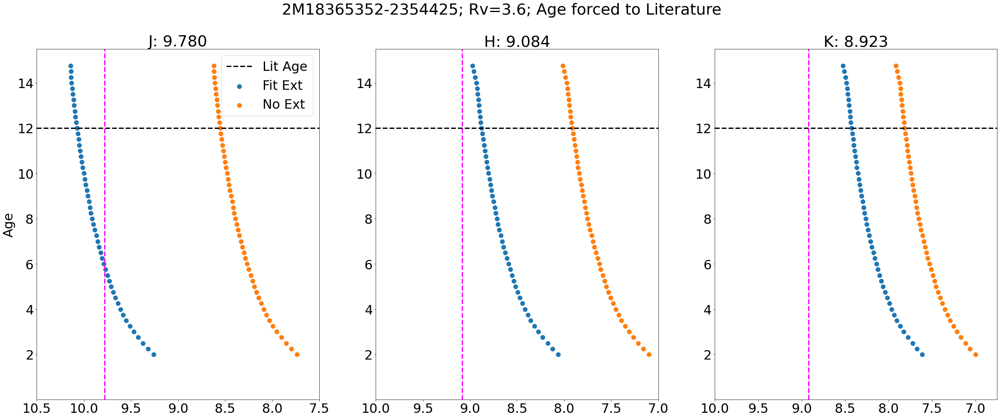

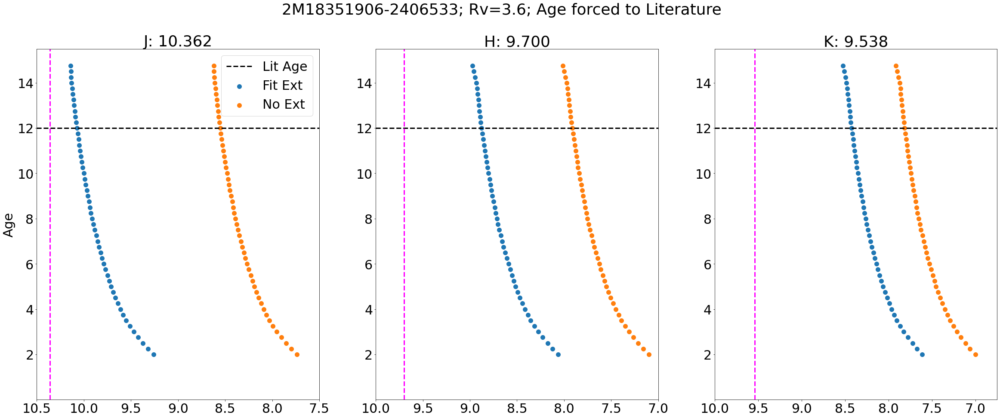

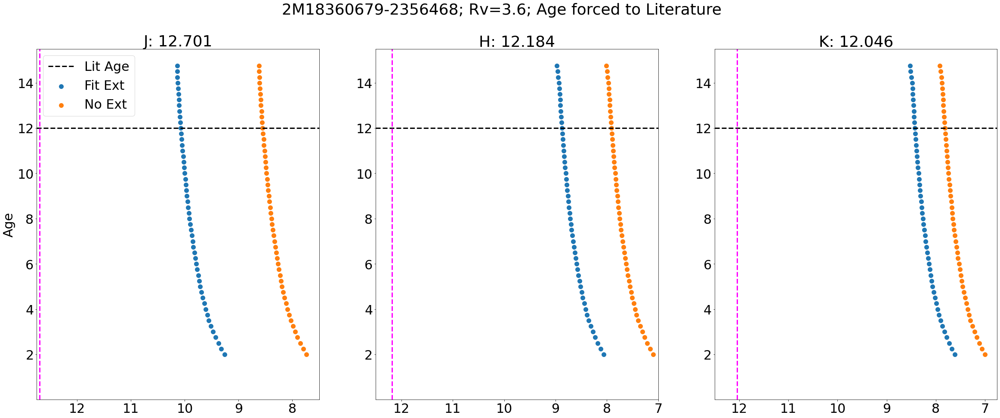

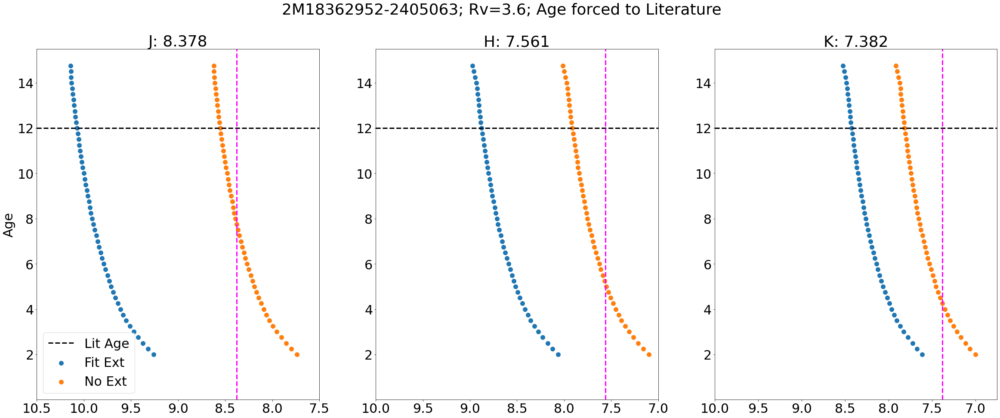

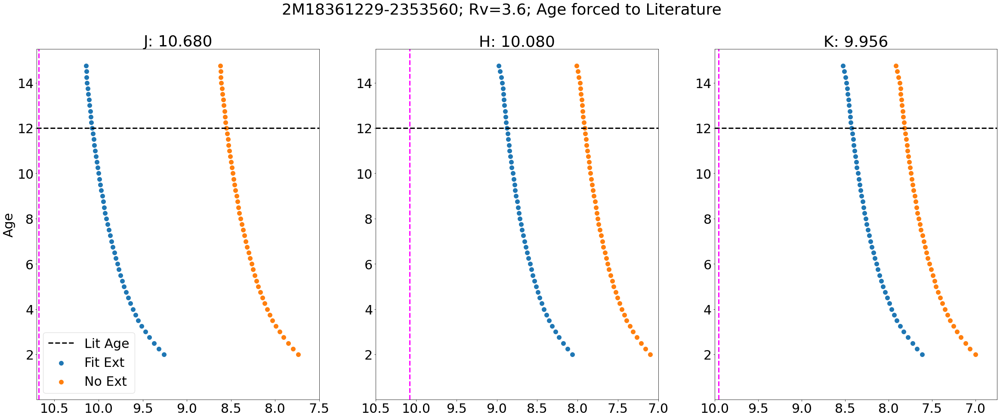

In [191]:
bands = ['J','H','K']
for j in range(len(gcs_bad_idx)):
    fig, ax = plt.subplots(1,3,figsize=[40,15])
    for i in range(3):
        ax[i].scatter(m22badtheos36[:,0,i],np.arange(0,15,0.25),s=100,label='Fit Ext')
        ax[i].scatter(m22badtheos360[:,0,i],np.arange(0,15,0.25),s=100,label='No Ext')
        ax[i].set_ylim(bottom=0.01)
        ax[i].axhline(12.0,c='k',ls='--',label='Lit Age',lw=3.0)

    ax[0].axvline(gcs[gcs_bad_idx[j]]['J'],ls='--',c='magenta',lw=3.0)
    ax[1].axvline(gcs[gcs_bad_idx[j]]['H'],ls='--',c='magenta',lw=3.0)
    ax[2].axvline(gcs[gcs_bad_idx[j]]['K'],ls='--',c='magenta',lw=3.0)

    ax[0].set_title(r'J: {:.3f}'.format(gcs[gcs_bad_idx[j]]['J']))
    ax[1].set_title(r'H: {:.3f}'.format(gcs[gcs_bad_idx[j]]['H']))
    ax[2].set_title(r'K: {:.3f}'.format(gcs[gcs_bad_idx[j]]['K']))

    ax[0].set_xlim(10.5,7.5)
    ax[1].set_xlim(10.,7.)
    ax[2].set_xlim(10.,6.75)
    
    if j == 2:
        ax[0].set_xlim(12.75,7.5)
        ax[1].set_xlim(12.5,7.)
        ax[2].set_xlim(12.5,6.75)
        
    if j == 4:
        ax[0].set_xlim(10.7,7.5)
        ax[1].set_xlim(10.5,7.)
        ax[2].set_xlim(10.,6.75)

    ax[0].legend()

    ax[0].set_ylabel('Age')
    plt.suptitle(r'{}; Rv=3.6; Age forced to Literature'.format(gcs[gcs_bad_idx[j]]['APOGEE_ID']))

    plt.show()

In [ ]:
# fitting with only one initial guess
# curve fit print values in model function
# check outputs

In [206]:
# ages0 = np.arange(0,15,1.0)
# aks0 = np.array([0,0.5,1.0])

# bad3curve_chis = 999999.0*np.ones((len(ages0),len(aks0)))
# bad3curve_ages = 999999.0*np.ones((len(ages0),len(aks0)))
# bad3curve_aks = 999999.0*np.ones((len(ages0),len(aks0)))

# CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx][bad3],gcs['ALPHA_M'][m22_idx][bad3],gcs_dist[m22_idx][bad3],3.1,
#                           massive)
# for i in tqdm_notebook(range(len(ages0))):
#     for j in range(len(aks0)):
#         try:
#             popt,_ = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx][bad3],
#                                np.array([[gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],
#                                           gcs['K'][m22_idx][bad3]]],dtype=float).T.ravel(),
#                                p0=[ages0[i],aks0[j]],bounds=((0.,0.),(14.0,2.)),method='trf',
#                                sigma=np.array([[gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],
#                                                 gcs['K_ERR'][m22_idx][bad3]]],dtype=float).T.ravel(),
#                                maxfev=5000,absolute_sigma=True)
        
#             bad3curve_ages[i,j] = popt[0]
#             bad3curve_aks[i,j] = popt[1]
      
#             calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx][bad3],popt[0],popt[1]))
#             mag_errs = np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],
#                                  gcs['K_ERR'][m22_idx][bad3]])
#             mags = np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]])
#             bad3curve_chis[i,j] = sum((calc_mags-mags)**2/mag_errs**2)
                    
#         except:
#             bad3curve_ages[i,j]=999999.0
#             bad3curve_aks[i,j]=999999.0
#             bad3curve_chis[i,j]=999999.0

[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7.69897]
[J,H,K]:  [999999. 999999. 999999.]
[lgage_lo,lgage_hi]:  [7.397939999999999, 7

[J,H,K]:  [12.45537416 11.37202411 10.89859301]
[lgage_lo,lgage_hi]:  [9.39794, 9.39357]
[J,H,K]:  [12.45984963 11.37506936 10.90071644]
[lgage_lo,lgage_hi]:  [9.39794, 9.39357]
[J,H,K]:  [12.45984962 11.37506934 10.90071642]
[lgage_lo,lgage_hi]:  [9.39794, 9.39357]
[J,H,K]:  [12.45984967 11.37506938 10.90071645]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.46879237 11.38115612 10.90496225]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.46879235 11.3811561  10.90496223]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.46879241 11.38115614 10.90496226]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.48664423 11.3933143  10.91344963]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.48664421 11.39331428 10.91344961]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.48664427 11.39331433 10.91344964]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.51989706 11.41525477 10.92810471]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.5198970

[J,H,K]:  [12.57878105 11.45298855 10.9524837 ]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.5787811  11.45298859 10.95248373]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.57905468 11.4531757  10.95261502]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.57905466 11.45317568 10.952615  ]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.57905472 11.45317573 10.95261503]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.57947008 11.45341809 10.95274634]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.57947011 11.45341812 10.95274636]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.57947012 11.45341812 10.95274635]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.5796471  11.45347045 10.95272806]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.57964708 11.45347043 10.95272804]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.57964714 11.45347047 10.95272808]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.5797838

[J,H,K]:  [12.59259169 11.46171924 10.95800268]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.59259167 11.46171922 10.95800266]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.59259173 11.46171927 10.95800269]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.59356996 11.46235309 10.95841465]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.59356999 11.46235311 10.95841468]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.59357    11.46235311 10.95841467]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.59385007 11.46213814 10.9579215 ]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.5937251  11.46238443 10.95837603]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.59372509 11.46238442 10.95837601]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.59372514 11.46238446 10.95837604]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.5938615  11.46247779 10.9584416 ]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.5938614

[J,H,K]:  [12.61825163 11.47798922 10.96832946]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61849898 11.47774779 10.96781403]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61839113 11.47800649 10.96827785]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61836387 11.47807094 10.96839363]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61836385 11.47807093 10.96839361]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61836391 11.47807097 10.96839364]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61849957 11.47816396 10.96845906]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61849955 11.47816394 10.96845904]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61849961 11.47816398 10.96845908]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61877097 11.47834998 10.96858993]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.61877095 11.47834996 10.96858991]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.618771 

[J,H,K]:  [12.62727418 11.48370522 10.97195406]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.62727363 11.48370492 10.97195392]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.62737217 11.48380357 10.97205218]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.62737215 11.48380355 10.97205216]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.62737221 11.48380359 10.9720522 ]
[lgage_lo,lgage_hi]:  [9.39357, 9.38917]
[J,H,K]:  [12.62727359 11.48370489 10.97195391]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.6273722  11.48380359 10.9720522 ]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.62737219 11.48380357 10.97205218]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.62737224 11.48380361 10.97205221]
[lgage_lo,lgage_hi]:  [9.39357, 9.39794]
[J,H,K]:  [12.6273722  11.48380359 10.9720522 ]
[J,H,K]:  [11.37342733 10.46189764 10.09911646]
[lgage_lo,lgage_hi]:  [9.0, 9.01072]
[J,H,K]:  [11.37342734 10.46189765 10.09911647]
[J,H,K]:  [11.3734

[J,H,K]:  [12.93408697 11.68515607 11.1061264 ]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93408705 11.68515614 11.10612646]
[lgage_lo,lgage_hi]:  [9.38471, 9.38021]
[J,H,K]:  [12.93388403 11.68488834 11.10582594]
[lgage_lo,lgage_hi]:  [9.38471, 9.38021]
[J,H,K]:  [12.93389938 11.6849445  11.10590458]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93410484 11.68517163 11.10614037]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93410479 11.68517158 11.10614032]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93410488 11.68517165 11.10614039]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93414049 11.68520265 11.10616822]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93414045 11.6852026  11.10616817]
[lgage_lo,lgage_hi]:  [9.38471, 9.38917]
[J,H,K]:  [12.93414053 11.68520267 11.10616823]
[lgage_lo,lgage_hi]:  [9.38471, 9.38021]
[J,H,K]:  [12.93389555 11.68493047 11.10588492]
[lgage_lo,lgage_hi]:  [9.38471, 9.38021]
[J,H,K]:  [12.9338993

[J,H,K]:  [13.34791564 11.93014429 11.24343222]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791555 11.9301442  11.24343213]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791568 11.93014431 11.24343223]
[lgage_lo,lgage_hi]:  [9.32736, 9.32222]
[J,H,K]:  [13.34696525 11.92916626 11.2424548 ]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791638 11.93014511 11.24343307]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791629 11.93014502 11.24343298]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791642 11.93014513 11.24343309]
[lgage_lo,lgage_hi]:  [9.32736, 9.32222]
[J,H,K]:  [13.34696658 11.92916759 11.24245609]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791676 11.93014551 11.2434335 ]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.34791667 11.93014542 11.24343341]
[lgage_lo,lgage_hi]:  [9.32736, 9.33244]
[J,H,K]:  [13.3479168  11.93014554 11.24343351]
[lgage_lo,lgage_hi]:  [9.32736, 9.32222]
[J,H,K]:  [13.3469672

[J,H,K]:  [13.27539141 11.8250188  11.11995836]
[lgage_lo,lgage_hi]:  [9.30103, 9.29557]
[J,H,K]:  [13.27523163 11.8248564  11.11979803]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.27539253 11.82501988 11.11995942]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.27539251 11.82501986 11.11995939]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.27539257 11.8250199  11.11995943]
[lgage_lo,lgage_hi]:  [9.30103, 9.29557]
[J,H,K]:  [13.2752319  11.82485674 11.11979838]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.27539311 11.82502043 11.11995995]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.27539308 11.82502041 11.11995993]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.27539315 11.82502046 11.11995997]
[lgage_lo,lgage_hi]:  [9.30103, 9.29557]
[J,H,K]:  [13.27523204 11.82485691 11.11979856]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.2753934  11.82502071 11.11996022]
[lgage_lo,lgage_hi]:  [9.30103, 9.30642]
[J,H,K]:  [13.2753933

[J,H,K]:  [13.31583734 11.9487329  11.29564749]
[lgage_lo,lgage_hi]:  [9.801060000000001, 9.802769999999999]
[J,H,K]:  [12.37625555 11.50890541 11.17158218]
[lgage_lo,lgage_hi]:  [9.58263, 9.57978]
[J,H,K]:  [13.08756699 11.85377308 11.28544707]
[lgage_lo,lgage_hi]:  [9.58263, 9.57978]
[J,H,K]:  [13.087567   11.85377309 11.28544708]
[lgage_lo,lgage_hi]:  [9.58263, 9.57978]
[J,H,K]:  [13.08756702 11.8537731  11.28544708]
[lgage_lo,lgage_hi]:  [9.6744, 9.6721]
[J,H,K]:  [13.07458929 11.89027928 11.35205083]
[lgage_lo,lgage_hi]:  [9.6744, 9.6721]
[J,H,K]:  [13.07458931 11.8902793  11.35205084]
[lgage_lo,lgage_hi]:  [9.6744, 9.6721]
[J,H,K]:  [13.07458933 11.89027931 11.35205084]
[lgage_lo,lgage_hi]:  [9.74624, 9.74429]
[J,H,K]:  [13.01950902 11.89063131 11.38793647]
[lgage_lo,lgage_hi]:  [9.74624, 9.74429]
[J,H,K]:  [13.01950903 11.89063131 11.38793647]
[lgage_lo,lgage_hi]:  [9.74624, 9.74429]
[J,H,K]:  [13.01950906 11.89063133 11.38793648]
[lgage_lo,lgage_hi]:  [9.80618, 9.80448]
[J,H,K]

[J,H,K]:  [12.91104144 11.89734442 11.4678766 ]
[lgage_lo,lgage_hi]:  [10.03543, 10.036430000000001]
[J,H,K]:  [12.94681842 11.9805855  11.58043342]
[lgage_lo,lgage_hi]:  [10.03543, 10.036430000000001]
[J,H,K]:  [12.94681844 11.98058551 11.58043343]
[lgage_lo,lgage_hi]:  [10.03543, 10.036430000000001]
[J,H,K]:  [12.94681846 11.98058552 11.58043343]
[lgage_lo,lgage_hi]:  [10.1038, 10.10295]
[J,H,K]:  [12.89696625 11.97998061 11.61059023]
[lgage_lo,lgage_hi]:  [10.1038, 10.10295]
[J,H,K]:  [12.89696626 11.97998062 11.61059024]
[lgage_lo,lgage_hi]:  [10.1038, 10.10295]
[J,H,K]:  [12.89696629 11.97998063 11.61059024]
[lgage_lo,lgage_hi]:  [10.13274, 10.13194]
[J,H,K]:  [12.95327111 12.02889149 11.65591536]
[lgage_lo,lgage_hi]:  [10.13274, 10.13194]
[J,H,K]:  [12.95327112 12.02889149 11.65591537]
[lgage_lo,lgage_hi]:  [10.13274, 10.13194]
[J,H,K]:  [12.95327115 12.02889151 11.65591537]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.95073511 12.03462882 11.66687989]
[lgage_lo,lgage

[J,H,K]:  [13.03818472 12.0572346  11.64711879]
[lgage_lo,lgage_hi]:  [10.07555, 10.07463]
[J,H,K]:  [13.03818473 12.05723461 11.6471188 ]
[lgage_lo,lgage_hi]:  [10.07555, 10.07463]
[J,H,K]:  [13.03818475 12.05723462 11.6471188 ]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.87235106 11.98502118 11.63547309]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.87235107 11.98502119 11.6354731 ]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.8723511  11.98502121 11.63547311]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94553359 12.03142994 11.66494639]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.9455336  12.03142994 11.6649464 ]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94553363 12.03142996 11.6649464 ]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694417 12.03235253 11.66555992]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694418 12.03235253 11.66555993]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]

[J,H,K]:  [12.94908481 11.98000579 11.57795666]
[lgage_lo,lgage_hi]:  [10.03242, 10.031410000000001]
[J,H,K]:  [12.94908478 11.98000577 11.57795664]
[lgage_lo,lgage_hi]:  [10.03242, 10.031410000000001]
[J,H,K]:  [12.94908484 11.98000581 11.57795667]
[lgage_lo,lgage_hi]:  [9.81291, 9.81458]
[J,H,K]:  [12.07430315 11.3221087  11.05780663]
[lgage_lo,lgage_hi]:  [9.98677, 9.98565]
[J,H,K]:  [12.77825714 11.85209771 11.47691182]
[lgage_lo,lgage_hi]:  [10.021189999999999, 10.02015]
[J,H,K]:  [12.93580717 11.96666386 11.5645055 ]
[lgage_lo,lgage_hi]:  [10.02938, 10.0304]
[J,H,K]:  [12.97043754 11.99248149 11.58502782]
[lgage_lo,lgage_hi]:  [10.02938, 10.0304]
[J,H,K]:  [12.97043756 11.99248151 11.58502785]
[lgage_lo,lgage_hi]:  [10.02938, 10.0304]
[J,H,K]:  [12.97043758 11.99248152 11.58502784]
[lgage_lo,lgage_hi]:  [10.0304, 10.02938]
[J,H,K]:  [12.97939435 11.99843894 11.58938626]
[lgage_lo,lgage_hi]:  [10.0304, 10.02938]
[J,H,K]:  [12.97939437 11.99843896 11.58938628]
[lgage_lo,lgage_hi]: 

[J,H,K]:  [12.54320528 11.68395115 11.35152454]
[lgage_lo,lgage_hi]:  [9.950610000000001, 9.94939]
[J,H,K]:  [12.5432053  11.68395116 11.35152455]
[lgage_lo,lgage_hi]:  [9.950610000000001, 9.94939]
[J,H,K]:  [12.54320532 11.68395117 11.35152456]
[lgage_lo,lgage_hi]:  [10.01703, 10.01808]
[J,H,K]:  [12.92086138 11.95529243 11.55599765]
[lgage_lo,lgage_hi]:  [10.01703, 10.01808]
[J,H,K]:  [12.9208614  11.95529245 11.55599767]
[lgage_lo,lgage_hi]:  [10.01703, 10.01808]
[J,H,K]:  [12.92086142 11.95529245 11.55599767]
[lgage_lo,lgage_hi]:  [10.0899, 10.08902]
[J,H,K]:  [12.82900576 11.92980837 11.57163342]
[lgage_lo,lgage_hi]:  [10.0899, 10.08902]
[J,H,K]:  [12.82900573 11.92980834 11.57163338]
[lgage_lo,lgage_hi]:  [10.0899, 10.08902]
[J,H,K]:  [12.8290058  11.9298084  11.57163343]
[lgage_lo,lgage_hi]:  [9.99123, 9.99233]
[J,H,K]:  [12.3079984  11.55444412 11.28849242]
[lgage_lo,lgage_hi]:  [10.067260000000001, 10.06633]
[J,H,K]:  [12.80241392 11.90301088 11.54536068]
[lgage_lo,lgage_hi]: 

[J,H,K]:  [12.95184022 12.03067348 11.65968433]
[lgage_lo,lgage_hi]:  [10.13751, 10.13672]
[J,H,K]:  [12.95184025 12.03067349 11.65968433]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.95018948 12.03438424 11.66682435]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.95018949 12.03438425 11.66682436]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.95018952 12.03438427 11.66682436]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94703234 12.0324087  11.66559585]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94703234 12.03240869 11.66559584]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94703238 12.03240872 11.66559586]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694444 12.03235302 11.66556055]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694444 12.03235302 11.66556055]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694448 12.03235305 11.66556057]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]

[J,H,K]:  [12.96542549 12.02089968 11.63500284]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96532975 12.02084648 11.63497243]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96532976 12.02084649 11.63497243]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96532978 12.02084651 11.63497244]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96539983 12.02088633 11.63500233]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96534904 12.02085761 11.63498102]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96534905 12.02085761 11.63498102]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96534908 12.02085763 11.63498104]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96538396 12.02087771 11.63500077]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96538397 12.02087772 11.63500078]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.965384   12.02087773 11.63500078]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]

[J,H,K]:  [12.9455573  12.01884661 11.64490525]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94564933 12.01893592 11.64500548]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94564928 12.01893588 11.64500543]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94564936 12.01893595 11.6450055 ]
[lgage_lo,lgage_hi]:  [10.11893, 10.1181]
[J,H,K]:  [12.94556068 12.0188507  11.64491017]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94565275 12.01893869 11.64500837]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94565271 12.01893865 11.64500831]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94565279 12.01893872 11.64500838]
[lgage_lo,lgage_hi]:  [10.11893, 10.1181]
[J,H,K]:  [12.94556237 12.01885275 11.64491262]
[lgage_lo,lgage_hi]:  [10.11893, 10.1181]
[J,H,K]:  [12.9455649  12.01885581 11.64491631]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.94565318 12.01893904 11.64500873]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J

[J,H,K]:  [12.96569254 12.0210749  11.63511918]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96569255 12.02107491 11.63511918]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96569257 12.02107492 11.6351192 ]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96573298 12.02108952 11.63510969]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96570184 12.02107857 11.63512678]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96570184 12.02107858 11.63512679]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96570188 12.0210786  11.63512679]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.9657122  12.02108714 11.6351377 ]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96571221 12.02108715 11.63513772]
[lgage_lo,lgage_hi]:  [10.09864, 10.09778]
[J,H,K]:  [12.96571224 12.02108717 11.63513771]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96573783 12.02110606 11.63513548]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]

[J,H,K]:  [12.98251487 12.00308037 11.59568323]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03743]
[J,H,K]:  [12.98271088 12.00320394 11.59576428]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03743]
[J,H,K]:  [12.98271087 12.00320394 11.59576427]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03743]
[J,H,K]:  [12.98271092 12.00320397 11.5957643 ]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03543]
[J,H,K]:  [12.98278939 12.00325518 11.59578621]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03543]
[J,H,K]:  [12.98273474 12.00321937 11.59577361]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03543]
[J,H,K]:  [12.98273475 12.00321938 11.59577362]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03543]
[J,H,K]:  [12.98273477 12.0032194  11.59577362]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03543]
[J,H,K]:  [12.98274729 12.00322728 11.59577897]
[lgage_lo,lgage_hi]:  [10.036430000000001, 10.03543]
[J,H,K]:  [12.9827473  12.00322729 11.59577899]
[lgage_lo,lgage_hi]:  [10.036430000000001, 

[J,H,K]:  [12.94376225 12.02469724 11.65349584]
[lgage_lo,lgage_hi]:  [10.13988, 10.14066]
[J,H,K]:  [12.94696015 12.02909344 11.65946301]
[lgage_lo,lgage_hi]:  [10.13988, 10.14066]
[J,H,K]:  [12.94696016 12.02909345 11.65946303]
[lgage_lo,lgage_hi]:  [10.13988, 10.14066]
[J,H,K]:  [12.94696019 12.02909347 11.65946303]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94674299 12.03212932 11.6653241 ]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.946743   12.03212933 11.66532411]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94674302 12.03212935 11.66532411]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694463 12.0323529  11.66556024]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694463 12.03235291 11.66556025]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694466 12.03235292 11.66556026]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694441 12.032353   11.66556054]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]

[J,H,K]:  [12.66019351 11.82760072 11.51240868]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.66019353 11.82760073 11.51240869]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.94394391 12.00748854 11.6262399 ]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.94394392 12.00748855 11.6262399 ]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.94394395 12.00748856 11.62623991]
[lgage_lo,lgage_hi]:  [9.95665, 9.95785]
[J,H,K]:  [13.00467244 11.98091049 11.54519429]
[lgage_lo,lgage_hi]:  [10.067260000000001, 10.06819]
[J,H,K]:  [12.97859077 12.01385814 11.61515958]
[lgage_lo,lgage_hi]:  [10.09167, 10.09079]
[J,H,K]:  [12.96762084 12.01821108 11.62858004]
[lgage_lo,lgage_hi]:  [10.096910000000001, 10.09778]
[J,H,K]:  [12.96665538 12.02096122 11.63340637]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.96538059 12.0208978  11.6349782 ]
[lgage_lo,lgage_hi]:  [10.09864, 10.09951]
[J,H,K]:  [12.9653806  12.02089781 11.6349782 ]
[lgage_lo,lgage_hi]:  [1

[J,H,K]:  [12.93492016 12.01044495 11.63759463]
[lgage_lo,lgage_hi]:  [10.1181, 10.11893]
[J,H,K]:  [12.94077408 12.01435984 11.64032319]
[lgage_lo,lgage_hi]:  [10.1181, 10.11893]
[J,H,K]:  [12.94077414 12.0143599  11.64032326]
[lgage_lo,lgage_hi]:  [10.1181, 10.11893]
[J,H,K]:  [12.94077411 12.01435986 11.6403232 ]
[lgage_lo,lgage_hi]:  [10.11893, 10.1181]
[J,H,K]:  [12.94903165 12.02008363 11.64454005]
[lgage_lo,lgage_hi]:  [10.11893, 10.1181]
[J,H,K]:  [12.94903172 12.02008369 11.64454012]
[lgage_lo,lgage_hi]:  [10.11893, 10.1181]
[J,H,K]:  [12.94903169 12.02008365 11.64454007]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.9548782  12.02471501 11.64854339]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.95487815 12.02471496 11.64854333]
[lgage_lo,lgage_hi]:  [10.11893, 10.11975]
[J,H,K]:  [12.95487823 12.02471503 11.6485434 ]
[lgage_lo,lgage_hi]:  [10.116439999999999, 10.11727]
[J,H,K]:  [12.93311741 12.00748607 11.63274607]
[lgage_lo,lgage_hi]:  [10.1181, 10.118

[J,H,K]:  [12.94694446 12.03235304 11.66556056]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]
[J,H,K]:  [12.94694443 12.03235301 11.66556055]
[lgage_lo,lgage_hi]:  [10.11394, 10.11311]
[J,H,K]:  [14.1411235  12.77372873 12.12037913]
[lgage_lo,lgage_hi]:  [10.11394, 10.11311]
[J,H,K]:  [14.14112351 12.77372874 12.12037914]
[lgage_lo,lgage_hi]:  [10.11394, 10.11311]
[J,H,K]:  [14.14112354 12.77372876 12.12037914]
[lgage_lo,lgage_hi]:  [10.07646, 10.07555]
[J,H,K]:  [13.33769089 12.24691817 11.76873337]
[lgage_lo,lgage_hi]:  [10.07646, 10.07555]
[J,H,K]:  [13.3376909  12.24691817 11.76873339]
[lgage_lo,lgage_hi]:  [10.07646, 10.07555]
[J,H,K]:  [13.33769093 12.24691819 11.76873339]
[lgage_lo,lgage_hi]:  [10.13033, 10.13114]
[J,H,K]:  [12.98676232 12.0491913  11.66683974]
[lgage_lo,lgage_hi]:  [10.13033, 10.13114]
[J,H,K]:  [12.98676233 12.04919131 11.66683975]
[lgage_lo,lgage_hi]:  [10.13033, 10.13114]
[J,H,K]:  [12.98676236 12.04919132 11.66683976]
[lgage_lo,lgage_hi]:  [10.14613, 10.14535]

In [241]:
# ages0 = np.arange(0,15,1.0)
# aks0 = np.array([0,0.5,1.0])

# bad3curve_chis = 999999.0*np.ones((len(ages0)))
# bad3curve_ages = 999999.0*np.ones((len(ages0),len(aks0)))
# bad3curve_aks = 999999.0*np.ones((len(ages0),len(aks0)))

CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx][bad3]+0.35,gcs['ALPHA_M'][m22_idx][bad3],gcs_dist[m22_idx][bad3],
                          3.1,massive)
try:
    popt,_ = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx][bad3],
                       np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]],
                                dtype=float).T.ravel(),
                       p0=[12.0,0.5],bounds=((0.,0.),(14.0,2.)),method='trf',
                       sigma=np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],
                                       gcs['K_ERR'][m22_idx][bad3]],dtype=float).T.ravel(),
                       maxfev=5000,absolute_sigma=True)

    bad3curve_ages = popt[0]
    bad3curve_aks = popt[1]
      
    calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx][bad3],popt[0],popt[1]))
    mag_errs = np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],gcs['K_ERR'][m22_idx][bad3]])
    mags = np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]])
    bad3curve_chis = sum((calc_mags-mags)**2/mag_errs**2)
                    
except:
    bad3curve_ages=999999.0
    bad3curve_aks=999999.0
    bad3curve_chis=999999.0
    
print(np.array([gcs[m22_idx][bad3]['J'],gcs[m22_idx][bad3]['H'],gcs[m22_idx][bad3]['K']]))

[12.701 12.184 12.046]


In [242]:
# Metallicity offset for bad3

b3fehoff_age = np.array([]) 
b3fehoff_aks = np.array([]) 
b3fehoff_chi = np.array([])

for i in tqdm_notebook(np.arange(0,1.0,0.01)):
    CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx][bad3]+i,gcs['ALPHA_M'][m22_idx][bad3],gcs_dist[m22_idx][bad3],
                              3.1,massive)
    try:
        popt,_ = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx][bad3],
                           np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]],
                                dtype=float).T.ravel(),
                           p0=[12.0,0.5],bounds=((0.,0.),(14.0,2.)),method='trf',
                           sigma=np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],
                                       gcs['K_ERR'][m22_idx][bad3]],dtype=float).T.ravel(),
                           maxfev=5000,absolute_sigma=True)

        b3fehoff_age = np.append(b3fehoff_age,popt[0])
        b3fehoff_aks = np.append(b3fehoff_aks,popt[1])
      
        calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx][bad3],popt[0],popt[1]))
        mag_errs = np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],gcs['K_ERR'][m22_idx][bad3]])
        mags = np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]])
        b3fehoff_chi = np.append(b3fehoff_chi,sum((calc_mags-mags)**2/mag_errs**2))
                    
    except:
        b3fehoff_age = np.append(b3fehoff_age,999999.0)
        b3fehoff_aks = np.append(b3fehoff_aks,999999.0)
        b3fehoff_chi = np.append(b3fehoff_chi,999999.0)
        
#     print(np.array([gcs[m22_idx][bad3]['J'],gcs[m22_idx][bad3]['H'],gcs[m22_idx][bad3]['K']]))

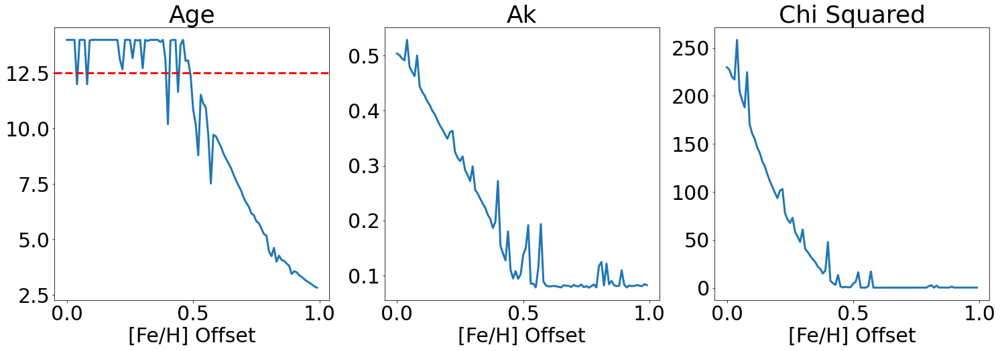

In [262]:
b3fehoffs = np.array([b3fehoff_age,b3fehoff_aks,b3fehoff_chi])
b3ylabs = ['Age','Ak','Chi Squared']

fig,ax=plt.subplots(1,3,figsize=[25,7.5])
for i in range(len(b3fehoffs)):
    ax[i].plot(np.arange(0,1,0.01),b3fehoffs[i],lw='3.0')
    ax[i].set_xlabel('[Fe/H] Offset')
    ax[i].set_title(b3ylabs[i])

ax[0].axhline(12.5,lw=3.0,ls='--',c='r')
plt.show()

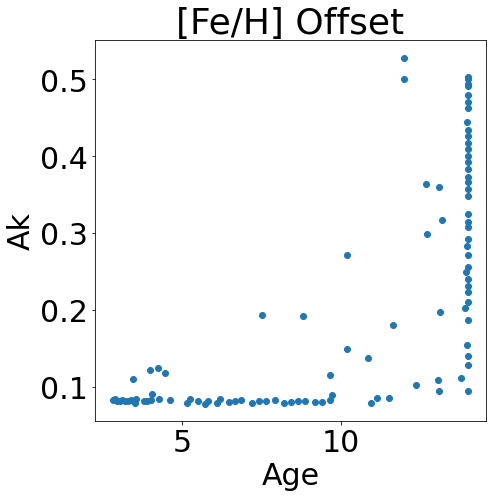

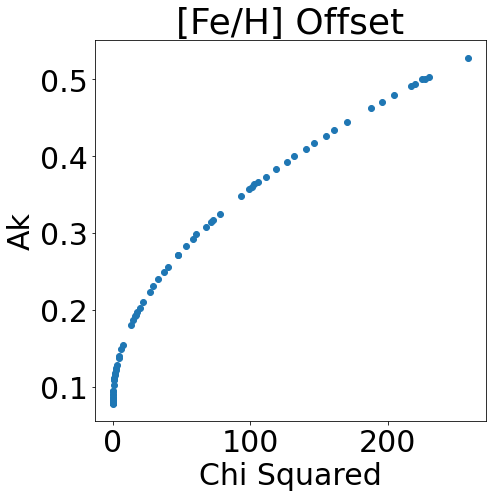

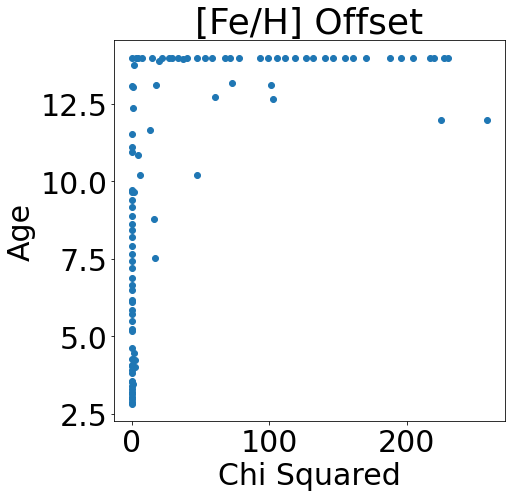

In [272]:
plt.figure(figsize=[7,7])
plt.scatter(b3fehoff_age,b3fehoff_aks)
plt.title('[Fe/H] Offset')
plt.xlabel('Age')
plt.ylabel('Ak')
plt.show()

plt.figure(figsize=[7,7])
plt.scatter(b3fehoff_chi,b3fehoff_aks)
plt.title('[Fe/H] Offset')
plt.xlabel('Chi Squared')
plt.ylabel('Ak')
plt.show()

plt.figure(figsize=[7,7])
plt.scatter(b3fehoff_chi,b3fehoff_age)
plt.title('[Fe/H] Offset')
plt.xlabel('Chi Squared')
plt.ylabel('Age')
plt.show()

In [273]:
# Metallicity offset for bad3

b3teffoff_age = np.array([]) 
b3teffoff_aks = np.array([]) 
b3teffoff_chi = np.array([])

for i in tqdm_notebook(np.arange(0,500,5.)):
    CalcAge = WhatsMyAgeAgain(gcs['M_H'][m22_idx][bad3],gcs['ALPHA_M'][m22_idx][bad3],gcs_dist[m22_idx][bad3],
                              3.1,massive)
    try:
        popt,_ = curve_fit(CalcAge.Teff2AppMags,gcs['TEFF'][m22_idx][bad3]+i,
                           np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]],
                                dtype=float).T.ravel(),
                           p0=[12.0,0.5],bounds=((0.,0.),(14.0,2.)),method='trf',
                           sigma=np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],
                                       gcs['K_ERR'][m22_idx][bad3]],dtype=float).T.ravel(),
                           maxfev=5000,absolute_sigma=True)

        b3teffoff_age = np.append(b3teffoff_age,popt[0])
        b3teffoff_aks = np.append(b3teffoff_aks,popt[1])
      
        calc_mags = np.asarray(CalcAge.Teff2AppMags(gcs['TEFF'][m22_idx][bad3]+i,popt[0],popt[1]))
        mag_errs = np.array([gcs['J_ERR'][m22_idx][bad3],gcs['H_ERR'][m22_idx][bad3],gcs['K_ERR'][m22_idx][bad3]])
        mags = np.array([gcs['J'][m22_idx][bad3],gcs['H'][m22_idx][bad3],gcs['K'][m22_idx][bad3]])
        b3teffoff_chi = np.append(b3teffoff_chi,sum((calc_mags-mags)**2/mag_errs**2))
                    
    except:
        b3teffoff_age = np.append(b3teffoff_age,999999.0)
        b3teffoff_aks = np.append(b3teffoff_aks,999999.0)
        b3teffoff_chi = np.append(b3teffoff_chi,999999.0)

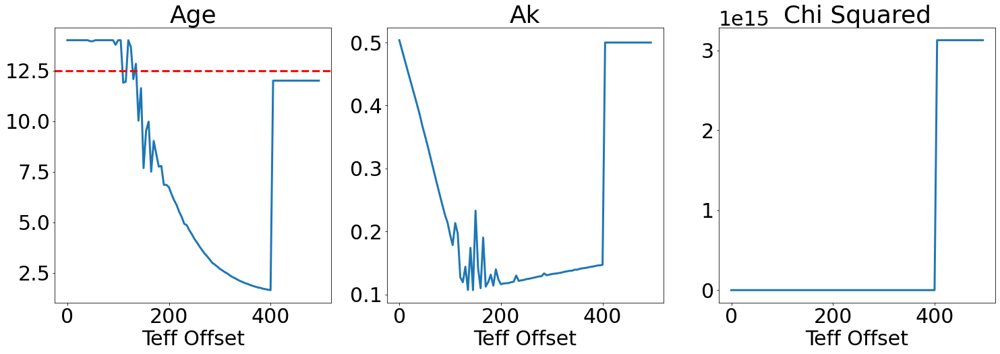

In [276]:
b3teffoffs = np.array([b3teffoff_age,b3teffoff_aks,b3teffoff_chi])
b3ylabs = ['Age','Ak','Chi Squared']

fig,ax=plt.subplots(1,3,figsize=[25,7.5])
for i in range(len(b3teffoffs)):
    ax[i].plot(np.arange(0,500,5),b3teffoffs[i],lw='3.0')
    ax[i].set_xlabel('Teff Offset')
    ax[i].set_title(b3ylabs[i])

ax[0].axhline(12.5,lw=3.0,ls='--',c='r')
plt.show()

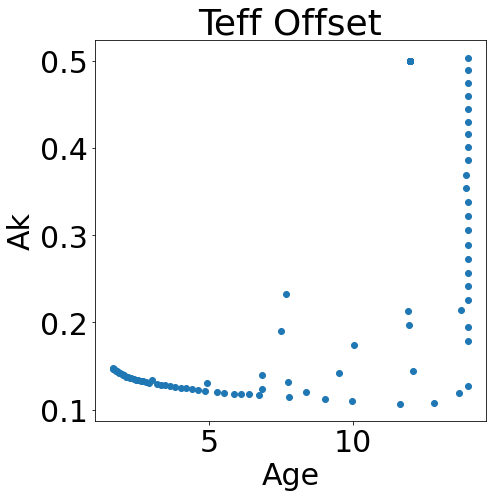

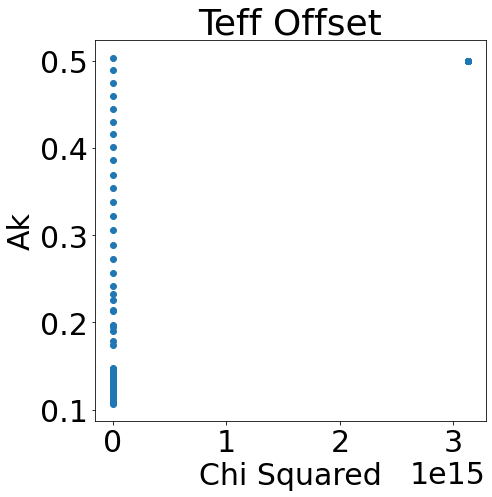

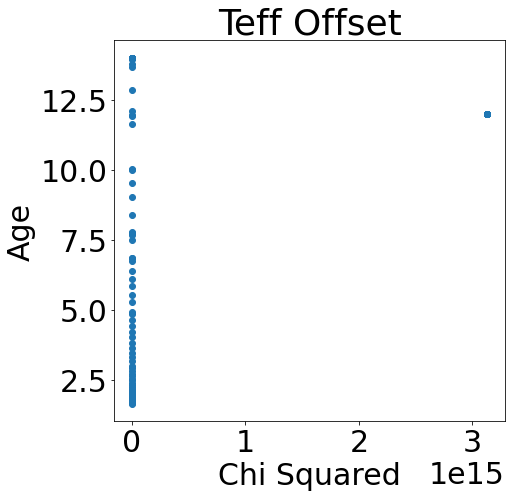

In [275]:
plt.figure(figsize=[7,7])
plt.scatter(b3teffoff_age,b3teffoff_aks)
plt.title('Teff Offset')
plt.xlabel('Age')
plt.ylabel('Ak')
plt.show()

plt.figure(figsize=[7,7])
plt.scatter(b3teffoff_chi,b3teffoff_aks)
plt.title('Teff Offset')
plt.xlabel('Chi Squared')
plt.ylabel('Ak')
plt.show()

plt.figure(figsize=[7,7])
plt.scatter(b3teffoff_chi,b3teffoff_age)
plt.title('Teff Offset')
plt.xlabel('Chi Squared')
plt.ylabel('Age')
plt.show()